# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_categorical",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_1"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: ukjdmd7e
Name: jedi-fleet-184
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/ukjdmd7e
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_221505-ukjdmd7e/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `training` set. Number of elements in each group: 4800,7552,5833,6676,15184,18913
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `validation` set. Number of elements in each group: 1213,1892,1486,1668,3781,4699
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:35<5:51:58, 35.26s/it]

Epoch 1/600:   0%|          | 1/600 [00:35<5:51:58, 35.26s/it, v_num=7e_1, total_loss_train=588, kl_local_train=50.6]

Epoch 2/600:   0%|          | 1/600 [00:35<5:51:58, 35.26s/it, v_num=7e_1, total_loss_train=588, kl_local_train=50.6]

Epoch 2/600:   0%|          | 2/600 [01:08<5:39:02, 34.02s/it, v_num=7e_1, total_loss_train=588, kl_local_train=50.6]

Epoch 2/600:   0%|          | 2/600 [01:08<5:39:02, 34.02s/it, v_num=7e_1, total_loss_train=457, kl_local_train=78.4]

Epoch 3/600:   0%|          | 2/600 [01:08<5:39:02, 34.02s/it, v_num=7e_1, total_loss_train=457, kl_local_train=78.4]

Epoch 3/600:   0%|          | 3/600 [01:41<5:36:15, 33.80s/it, v_num=7e_1, total_loss_train=457, kl_local_train=78.4]

Epoch 3/600:   0%|          | 3/600 [01:41<5:36:15, 33.80s/it, v_num=7e_1, total_loss_train=441, kl_local_train=87.3]

Epoch 4/600:   0%|          | 3/600 [01:41<5:36:15, 33.80s/it, v_num=7e_1, total_loss_train=441, kl_local_train=87.3]

Epoch 4/600:   1%|          | 4/600 [02:15<5:35:15, 33.75s/it, v_num=7e_1, total_loss_train=441, kl_local_train=87.3]

Epoch 4/600:   1%|          | 4/600 [02:15<5:35:15, 33.75s/it, v_num=7e_1, total_loss_train=434, kl_local_train=89.3]

Epoch 5/600:   1%|          | 4/600 [02:15<5:35:15, 33.75s/it, v_num=7e_1, total_loss_train=434, kl_local_train=89.3]

Epoch 5/600:   1%|          | 5/600 [02:50<5:38:08, 34.10s/it, v_num=7e_1, total_loss_train=434, kl_local_train=89.3]

Epoch 5/600:   1%|          | 5/600 [02:50<5:38:08, 34.10s/it, v_num=7e_1, total_loss_train=430, kl_local_train=87.9]

Epoch 6/600:   1%|          | 5/600 [02:51<5:38:08, 34.10s/it, v_num=7e_1, total_loss_train=430, kl_local_train=87.9]

Epoch 6/600:   1%|          | 6/600 [03:22<5:30:30, 33.38s/it, v_num=7e_1, total_loss_train=430, kl_local_train=87.9]

Epoch 6/600:   1%|          | 6/600 [03:22<5:30:30, 33.38s/it, v_num=7e_1, total_loss_train=427, kl_local_train=84.7, metric_mi|age_categorical_train=0.0748]

Epoch 7/600:   1%|          | 6/600 [03:22<5:30:30, 33.38s/it, v_num=7e_1, total_loss_train=427, kl_local_train=84.7, metric_mi|age_categorical_train=0.0748]

Epoch 7/600:   1%|          | 7/600 [03:53<5:24:12, 32.80s/it, v_num=7e_1, total_loss_train=427, kl_local_train=84.7, metric_mi|age_categorical_train=0.0748]

Epoch 7/600:   1%|          | 7/600 [03:53<5:24:12, 32.80s/it, v_num=7e_1, total_loss_train=424, kl_local_train=81.7, metric_mi|age_categorical_train=0.0748]

Epoch 8/600:   1%|          | 7/600 [03:53<5:24:12, 32.80s/it, v_num=7e_1, total_loss_train=424, kl_local_train=81.7, metric_mi|age_categorical_train=0.0748]

Epoch 8/600:   1%|▏         | 8/600 [04:25<5:21:08, 32.55s/it, v_num=7e_1, total_loss_train=424, kl_local_train=81.7, metric_mi|age_categorical_train=0.0748]

Epoch 8/600:   1%|▏         | 8/600 [04:25<5:21:08, 32.55s/it, v_num=7e_1, total_loss_train=434, kl_local_train=99, metric_mi|age_categorical_train=0.0748]  

Epoch 9/600:   1%|▏         | 8/600 [04:25<5:21:08, 32.55s/it, v_num=7e_1, total_loss_train=434, kl_local_train=99, metric_mi|age_categorical_train=0.0748]

Epoch 9/600:   2%|▏         | 9/600 [04:57<5:18:34, 32.34s/it, v_num=7e_1, total_loss_train=434, kl_local_train=99, metric_mi|age_categorical_train=0.0748]

Epoch 9/600:   2%|▏         | 9/600 [04:57<5:18:34, 32.34s/it, v_num=7e_1, total_loss_train=442, kl_local_train=91.2, metric_mi|age_categorical_train=0.0748]

Epoch 10/600:   2%|▏         | 9/600 [04:57<5:18:34, 32.34s/it, v_num=7e_1, total_loss_train=442, kl_local_train=91.2, metric_mi|age_categorical_train=0.0748]

Epoch 10/600:   2%|▏         | 10/600 [05:31<5:21:52, 32.73s/it, v_num=7e_1, total_loss_train=442, kl_local_train=91.2, metric_mi|age_categorical_train=0.0748]

Epoch 10/600:   2%|▏         | 10/600 [05:31<5:21:52, 32.73s/it, v_num=7e_1, total_loss_train=450, kl_local_train=91.3, metric_mi|age_categorical_train=0.0748]

Epoch 11/600:   2%|▏         | 10/600 [05:32<5:21:52, 32.73s/it, v_num=7e_1, total_loss_train=450, kl_local_train=91.3, metric_mi|age_categorical_train=0.0748]

Epoch 11/600:   2%|▏         | 11/600 [06:04<5:21:40, 32.77s/it, v_num=7e_1, total_loss_train=450, kl_local_train=91.3, metric_mi|age_categorical_train=0.0748]

Epoch 11/600:   2%|▏         | 11/600 [06:04<5:21:40, 32.77s/it, v_num=7e_1, total_loss_train=443, kl_local_train=174, metric_mi|age_categorical_train=0.0826] 

Epoch 12/600:   2%|▏         | 11/600 [06:04<5:21:40, 32.77s/it, v_num=7e_1, total_loss_train=443, kl_local_train=174, metric_mi|age_categorical_train=0.0826]

Epoch 12/600:   2%|▏         | 12/600 [06:36<5:19:13, 32.57s/it, v_num=7e_1, total_loss_train=443, kl_local_train=174, metric_mi|age_categorical_train=0.0826]

Epoch 12/600:   2%|▏         | 12/600 [06:36<5:19:13, 32.57s/it, v_num=7e_1, total_loss_train=437, kl_local_train=266, metric_mi|age_categorical_train=0.0826]

Epoch 13/600:   2%|▏         | 12/600 [06:36<5:19:13, 32.57s/it, v_num=7e_1, total_loss_train=437, kl_local_train=266, metric_mi|age_categorical_train=0.0826]

Epoch 13/600:   2%|▏         | 13/600 [07:08<5:16:55, 32.39s/it, v_num=7e_1, total_loss_train=437, kl_local_train=266, metric_mi|age_categorical_train=0.0826]

Epoch 13/600:   2%|▏         | 13/600 [07:08<5:16:55, 32.39s/it, v_num=7e_1, total_loss_train=437, kl_local_train=292, metric_mi|age_categorical_train=0.0826]

Epoch 14/600:   2%|▏         | 13/600 [07:08<5:16:55, 32.39s/it, v_num=7e_1, total_loss_train=437, kl_local_train=292, metric_mi|age_categorical_train=0.0826]

Epoch 14/600:   2%|▏         | 14/600 [07:40<5:15:16, 32.28s/it, v_num=7e_1, total_loss_train=437, kl_local_train=292, metric_mi|age_categorical_train=0.0826]

Epoch 14/600:   2%|▏         | 14/600 [07:40<5:15:16, 32.28s/it, v_num=7e_1, total_loss_train=438, kl_local_train=298, metric_mi|age_categorical_train=0.0826]

Epoch 15/600:   2%|▏         | 14/600 [07:40<5:15:16, 32.28s/it, v_num=7e_1, total_loss_train=438, kl_local_train=298, metric_mi|age_categorical_train=0.0826]

Epoch 15/600:   2%|▎         | 15/600 [08:13<5:16:13, 32.43s/it, v_num=7e_1, total_loss_train=438, kl_local_train=298, metric_mi|age_categorical_train=0.0826]

Epoch 15/600:   2%|▎         | 15/600 [08:13<5:16:13, 32.43s/it, v_num=7e_1, total_loss_train=439, kl_local_train=302, metric_mi|age_categorical_train=0.0826]

Epoch 16/600:   2%|▎         | 15/600 [08:13<5:16:13, 32.43s/it, v_num=7e_1, total_loss_train=439, kl_local_train=302, metric_mi|age_categorical_train=0.0826]

Epoch 16/600:   3%|▎         | 16/600 [08:46<5:17:18, 32.60s/it, v_num=7e_1, total_loss_train=439, kl_local_train=302, metric_mi|age_categorical_train=0.0826]

Epoch 16/600:   3%|▎         | 16/600 [08:46<5:17:18, 32.60s/it, v_num=7e_1, total_loss_train=439, kl_local_train=288, metric_mi|age_categorical_train=0.182] 

Epoch 17/600:   3%|▎         | 16/600 [08:46<5:17:18, 32.60s/it, v_num=7e_1, total_loss_train=439, kl_local_train=288, metric_mi|age_categorical_train=0.182]

Epoch 17/600:   3%|▎         | 17/600 [09:18<5:15:19, 32.45s/it, v_num=7e_1, total_loss_train=439, kl_local_train=288, metric_mi|age_categorical_train=0.182]

Epoch 17/600:   3%|▎         | 17/600 [09:18<5:15:19, 32.45s/it, v_num=7e_1, total_loss_train=440, kl_local_train=273, metric_mi|age_categorical_train=0.182]

Epoch 18/600:   3%|▎         | 17/600 [09:18<5:15:19, 32.45s/it, v_num=7e_1, total_loss_train=440, kl_local_train=273, metric_mi|age_categorical_train=0.182]

Epoch 18/600:   3%|▎         | 18/600 [09:50<5:14:17, 32.40s/it, v_num=7e_1, total_loss_train=440, kl_local_train=273, metric_mi|age_categorical_train=0.182]

Epoch 18/600:   3%|▎         | 18/600 [09:50<5:14:17, 32.40s/it, v_num=7e_1, total_loss_train=440, kl_local_train=277, metric_mi|age_categorical_train=0.182]

Epoch 19/600:   3%|▎         | 18/600 [09:50<5:14:17, 32.40s/it, v_num=7e_1, total_loss_train=440, kl_local_train=277, metric_mi|age_categorical_train=0.182]

Epoch 19/600:   3%|▎         | 19/600 [10:22<5:13:30, 32.38s/it, v_num=7e_1, total_loss_train=440, kl_local_train=277, metric_mi|age_categorical_train=0.182]

Epoch 19/600:   3%|▎         | 19/600 [10:22<5:13:30, 32.38s/it, v_num=7e_1, total_loss_train=441, kl_local_train=274, metric_mi|age_categorical_train=0.182]

Epoch 20/600:   3%|▎         | 19/600 [10:22<5:13:30, 32.38s/it, v_num=7e_1, total_loss_train=441, kl_local_train=274, metric_mi|age_categorical_train=0.182]

Epoch 20/600:   3%|▎         | 20/600 [10:55<5:14:33, 32.54s/it, v_num=7e_1, total_loss_train=441, kl_local_train=274, metric_mi|age_categorical_train=0.182]

Epoch 20/600:   3%|▎         | 20/600 [10:55<5:14:33, 32.54s/it, v_num=7e_1, total_loss_train=441, kl_local_train=265, metric_mi|age_categorical_train=0.182]

Epoch 21/600:   3%|▎         | 20/600 [10:56<5:14:33, 32.54s/it, v_num=7e_1, total_loss_train=441, kl_local_train=265, metric_mi|age_categorical_train=0.182]

Epoch 21/600:   4%|▎         | 21/600 [11:28<5:15:48, 32.73s/it, v_num=7e_1, total_loss_train=441, kl_local_train=265, metric_mi|age_categorical_train=0.182]

Epoch 21/600:   4%|▎         | 21/600 [11:28<5:15:48, 32.73s/it, v_num=7e_1, total_loss_train=442, kl_local_train=264, metric_mi|age_categorical_train=0.234]

Epoch 22/600:   4%|▎         | 21/600 [11:28<5:15:48, 32.73s/it, v_num=7e_1, total_loss_train=442, kl_local_train=264, metric_mi|age_categorical_train=0.234]

Epoch 22/600:   4%|▎         | 22/600 [12:01<5:14:12, 32.62s/it, v_num=7e_1, total_loss_train=442, kl_local_train=264, metric_mi|age_categorical_train=0.234]

Epoch 22/600:   4%|▎         | 22/600 [12:01<5:14:12, 32.62s/it, v_num=7e_1, total_loss_train=443, kl_local_train=264, metric_mi|age_categorical_train=0.234]

Epoch 23/600:   4%|▎         | 22/600 [12:01<5:14:12, 32.62s/it, v_num=7e_1, total_loss_train=443, kl_local_train=264, metric_mi|age_categorical_train=0.234]

Epoch 23/600:   4%|▍         | 23/600 [12:33<5:12:30, 32.50s/it, v_num=7e_1, total_loss_train=443, kl_local_train=264, metric_mi|age_categorical_train=0.234]

Epoch 23/600:   4%|▍         | 23/600 [12:33<5:12:30, 32.50s/it, v_num=7e_1, total_loss_train=444, kl_local_train=263, metric_mi|age_categorical_train=0.234]

Epoch 24/600:   4%|▍         | 23/600 [12:33<5:12:30, 32.50s/it, v_num=7e_1, total_loss_train=444, kl_local_train=263, metric_mi|age_categorical_train=0.234]

Epoch 24/600:   4%|▍         | 24/600 [13:05<5:11:31, 32.45s/it, v_num=7e_1, total_loss_train=444, kl_local_train=263, metric_mi|age_categorical_train=0.234]

Epoch 24/600:   4%|▍         | 24/600 [13:05<5:11:31, 32.45s/it, v_num=7e_1, total_loss_train=446, kl_local_train=268, metric_mi|age_categorical_train=0.234]

Epoch 25/600:   4%|▍         | 24/600 [13:05<5:11:31, 32.45s/it, v_num=7e_1, total_loss_train=446, kl_local_train=268, metric_mi|age_categorical_train=0.234]

Epoch 25/600:   4%|▍         | 25/600 [13:38<5:12:25, 32.60s/it, v_num=7e_1, total_loss_train=446, kl_local_train=268, metric_mi|age_categorical_train=0.234]

Epoch 25/600:   4%|▍         | 25/600 [13:38<5:12:25, 32.60s/it, v_num=7e_1, total_loss_train=447, kl_local_train=266, metric_mi|age_categorical_train=0.234]

Epoch 26/600:   4%|▍         | 25/600 [13:39<5:12:25, 32.60s/it, v_num=7e_1, total_loss_train=447, kl_local_train=266, metric_mi|age_categorical_train=0.234]

Epoch 26/600:   4%|▍         | 26/600 [14:12<5:13:50, 32.81s/it, v_num=7e_1, total_loss_train=447, kl_local_train=266, metric_mi|age_categorical_train=0.234]

Epoch 26/600:   4%|▍         | 26/600 [14:12<5:13:50, 32.81s/it, v_num=7e_1, total_loss_train=448, kl_local_train=257, metric_mi|age_categorical_train=0.248]

Epoch 27/600:   4%|▍         | 26/600 [14:12<5:13:50, 32.81s/it, v_num=7e_1, total_loss_train=448, kl_local_train=257, metric_mi|age_categorical_train=0.248]

Epoch 27/600:   4%|▍         | 27/600 [14:44<5:12:10, 32.69s/it, v_num=7e_1, total_loss_train=448, kl_local_train=257, metric_mi|age_categorical_train=0.248]

Epoch 27/600:   4%|▍         | 27/600 [14:44<5:12:10, 32.69s/it, v_num=7e_1, total_loss_train=449, kl_local_train=260, metric_mi|age_categorical_train=0.248]

Epoch 28/600:   4%|▍         | 27/600 [14:44<5:12:10, 32.69s/it, v_num=7e_1, total_loss_train=449, kl_local_train=260, metric_mi|age_categorical_train=0.248]

Epoch 28/600:   5%|▍         | 28/600 [15:17<5:11:16, 32.65s/it, v_num=7e_1, total_loss_train=449, kl_local_train=260, metric_mi|age_categorical_train=0.248]

Epoch 28/600:   5%|▍         | 28/600 [15:17<5:11:16, 32.65s/it, v_num=7e_1, total_loss_train=451, kl_local_train=258, metric_mi|age_categorical_train=0.248]

Epoch 29/600:   5%|▍         | 28/600 [15:17<5:11:16, 32.65s/it, v_num=7e_1, total_loss_train=451, kl_local_train=258, metric_mi|age_categorical_train=0.248]

Epoch 29/600:   5%|▍         | 29/600 [15:49<5:09:06, 32.48s/it, v_num=7e_1, total_loss_train=451, kl_local_train=258, metric_mi|age_categorical_train=0.248]

Epoch 29/600:   5%|▍         | 29/600 [15:49<5:09:06, 32.48s/it, v_num=7e_1, total_loss_train=452, kl_local_train=262, metric_mi|age_categorical_train=0.248]

Epoch 30/600:   5%|▍         | 29/600 [15:49<5:09:06, 32.48s/it, v_num=7e_1, total_loss_train=452, kl_local_train=262, metric_mi|age_categorical_train=0.248]

Epoch 30/600:   5%|▌         | 30/600 [16:22<5:10:34, 32.69s/it, v_num=7e_1, total_loss_train=452, kl_local_train=262, metric_mi|age_categorical_train=0.248]

Epoch 30/600:   5%|▌         | 30/600 [16:22<5:10:34, 32.69s/it, v_num=7e_1, total_loss_train=454, kl_local_train=261, metric_mi|age_categorical_train=0.248]

Epoch 31/600:   5%|▌         | 30/600 [16:23<5:10:34, 32.69s/it, v_num=7e_1, total_loss_train=454, kl_local_train=261, metric_mi|age_categorical_train=0.248]

Epoch 31/600:   5%|▌         | 31/600 [16:55<5:11:54, 32.89s/it, v_num=7e_1, total_loss_train=454, kl_local_train=261, metric_mi|age_categorical_train=0.248]

Epoch 31/600:   5%|▌         | 31/600 [16:55<5:11:54, 32.89s/it, v_num=7e_1, total_loss_train=455, kl_local_train=264, metric_mi|age_categorical_train=0.247]

Epoch 32/600:   5%|▌         | 31/600 [16:55<5:11:54, 32.89s/it, v_num=7e_1, total_loss_train=455, kl_local_train=264, metric_mi|age_categorical_train=0.247]

Epoch 32/600:   5%|▌         | 32/600 [17:28<5:10:05, 32.76s/it, v_num=7e_1, total_loss_train=455, kl_local_train=264, metric_mi|age_categorical_train=0.247]

Epoch 32/600:   5%|▌         | 32/600 [17:28<5:10:05, 32.76s/it, v_num=7e_1, total_loss_train=457, kl_local_train=266, metric_mi|age_categorical_train=0.247]

Epoch 33/600:   5%|▌         | 32/600 [17:28<5:10:05, 32.76s/it, v_num=7e_1, total_loss_train=457, kl_local_train=266, metric_mi|age_categorical_train=0.247]

Epoch 33/600:   6%|▌         | 33/600 [18:00<5:07:47, 32.57s/it, v_num=7e_1, total_loss_train=457, kl_local_train=266, metric_mi|age_categorical_train=0.247]

Epoch 33/600:   6%|▌         | 33/600 [18:00<5:07:47, 32.57s/it, v_num=7e_1, total_loss_train=459, kl_local_train=267, metric_mi|age_categorical_train=0.247]

Epoch 34/600:   6%|▌         | 33/600 [18:00<5:07:47, 32.57s/it, v_num=7e_1, total_loss_train=459, kl_local_train=267, metric_mi|age_categorical_train=0.247]

Epoch 34/600:   6%|▌         | 34/600 [18:32<5:06:40, 32.51s/it, v_num=7e_1, total_loss_train=459, kl_local_train=267, metric_mi|age_categorical_train=0.247]

Epoch 34/600:   6%|▌         | 34/600 [18:32<5:06:40, 32.51s/it, v_num=7e_1, total_loss_train=460, kl_local_train=265, metric_mi|age_categorical_train=0.247]

Epoch 35/600:   6%|▌         | 34/600 [18:32<5:06:40, 32.51s/it, v_num=7e_1, total_loss_train=460, kl_local_train=265, metric_mi|age_categorical_train=0.247]

Epoch 35/600:   6%|▌         | 35/600 [19:05<5:06:57, 32.60s/it, v_num=7e_1, total_loss_train=460, kl_local_train=265, metric_mi|age_categorical_train=0.247]

Epoch 35/600:   6%|▌         | 35/600 [19:05<5:06:57, 32.60s/it, v_num=7e_1, total_loss_train=462, kl_local_train=267, metric_mi|age_categorical_train=0.247]

Epoch 36/600:   6%|▌         | 35/600 [19:06<5:06:57, 32.60s/it, v_num=7e_1, total_loss_train=462, kl_local_train=267, metric_mi|age_categorical_train=0.247]

Epoch 36/600:   6%|▌         | 36/600 [19:39<5:09:04, 32.88s/it, v_num=7e_1, total_loss_train=462, kl_local_train=267, metric_mi|age_categorical_train=0.247]

Epoch 36/600:   6%|▌         | 36/600 [19:39<5:09:04, 32.88s/it, v_num=7e_1, total_loss_train=463, kl_local_train=269, metric_mi|age_categorical_train=0.256]

Epoch 37/600:   6%|▌         | 36/600 [19:39<5:09:04, 32.88s/it, v_num=7e_1, total_loss_train=463, kl_local_train=269, metric_mi|age_categorical_train=0.256]

Epoch 37/600:   6%|▌         | 37/600 [20:11<5:07:32, 32.77s/it, v_num=7e_1, total_loss_train=463, kl_local_train=269, metric_mi|age_categorical_train=0.256]

Epoch 37/600:   6%|▌         | 37/600 [20:11<5:07:32, 32.77s/it, v_num=7e_1, total_loss_train=465, kl_local_train=264, metric_mi|age_categorical_train=0.256]

Epoch 38/600:   6%|▌         | 37/600 [20:11<5:07:32, 32.77s/it, v_num=7e_1, total_loss_train=465, kl_local_train=264, metric_mi|age_categorical_train=0.256]

Epoch 38/600:   6%|▋         | 38/600 [20:44<5:06:46, 32.75s/it, v_num=7e_1, total_loss_train=465, kl_local_train=264, metric_mi|age_categorical_train=0.256]

Epoch 38/600:   6%|▋         | 38/600 [20:44<5:06:46, 32.75s/it, v_num=7e_1, total_loss_train=467, kl_local_train=264, metric_mi|age_categorical_train=0.256]

Epoch 39/600:   6%|▋         | 38/600 [20:44<5:06:46, 32.75s/it, v_num=7e_1, total_loss_train=467, kl_local_train=264, metric_mi|age_categorical_train=0.256]

Epoch 39/600:   6%|▋         | 39/600 [21:16<5:05:37, 32.69s/it, v_num=7e_1, total_loss_train=467, kl_local_train=264, metric_mi|age_categorical_train=0.256]

Epoch 39/600:   6%|▋         | 39/600 [21:16<5:05:37, 32.69s/it, v_num=7e_1, total_loss_train=468, kl_local_train=263, metric_mi|age_categorical_train=0.256]

Epoch 40/600:   6%|▋         | 39/600 [21:16<5:05:37, 32.69s/it, v_num=7e_1, total_loss_train=468, kl_local_train=263, metric_mi|age_categorical_train=0.256]

Epoch 40/600:   7%|▋         | 40/600 [21:49<5:05:44, 32.76s/it, v_num=7e_1, total_loss_train=468, kl_local_train=263, metric_mi|age_categorical_train=0.256]

Epoch 40/600:   7%|▋         | 40/600 [21:49<5:05:44, 32.76s/it, v_num=7e_1, total_loss_train=470, kl_local_train=266, metric_mi|age_categorical_train=0.256]

Epoch 41/600:   7%|▋         | 40/600 [21:50<5:05:44, 32.76s/it, v_num=7e_1, total_loss_train=470, kl_local_train=266, metric_mi|age_categorical_train=0.256]

Epoch 41/600:   7%|▋         | 41/600 [22:23<5:06:47, 32.93s/it, v_num=7e_1, total_loss_train=470, kl_local_train=266, metric_mi|age_categorical_train=0.256]

Epoch 41/600:   7%|▋         | 41/600 [22:23<5:06:47, 32.93s/it, v_num=7e_1, total_loss_train=472, kl_local_train=264, metric_mi|age_categorical_train=0.249]

Epoch 42/600:   7%|▋         | 41/600 [22:23<5:06:47, 32.93s/it, v_num=7e_1, total_loss_train=472, kl_local_train=264, metric_mi|age_categorical_train=0.249]

Epoch 42/600:   7%|▋         | 42/600 [22:55<5:04:42, 32.76s/it, v_num=7e_1, total_loss_train=472, kl_local_train=264, metric_mi|age_categorical_train=0.249]

Epoch 42/600:   7%|▋         | 42/600 [22:55<5:04:42, 32.76s/it, v_num=7e_1, total_loss_train=474, kl_local_train=273, metric_mi|age_categorical_train=0.249]

Epoch 43/600:   7%|▋         | 42/600 [22:55<5:04:42, 32.76s/it, v_num=7e_1, total_loss_train=474, kl_local_train=273, metric_mi|age_categorical_train=0.249]

Epoch 43/600:   7%|▋         | 43/600 [23:27<5:03:04, 32.65s/it, v_num=7e_1, total_loss_train=474, kl_local_train=273, metric_mi|age_categorical_train=0.249]

Epoch 43/600:   7%|▋         | 43/600 [23:27<5:03:04, 32.65s/it, v_num=7e_1, total_loss_train=475, kl_local_train=271, metric_mi|age_categorical_train=0.249]

Epoch 44/600:   7%|▋         | 43/600 [23:27<5:03:04, 32.65s/it, v_num=7e_1, total_loss_train=475, kl_local_train=271, metric_mi|age_categorical_train=0.249]

Epoch 44/600:   7%|▋         | 44/600 [24:00<5:02:16, 32.62s/it, v_num=7e_1, total_loss_train=475, kl_local_train=271, metric_mi|age_categorical_train=0.249]

Epoch 44/600:   7%|▋         | 44/600 [24:00<5:02:16, 32.62s/it, v_num=7e_1, total_loss_train=477, kl_local_train=269, metric_mi|age_categorical_train=0.249]

Epoch 45/600:   7%|▋         | 44/600 [24:00<5:02:16, 32.62s/it, v_num=7e_1, total_loss_train=477, kl_local_train=269, metric_mi|age_categorical_train=0.249]

Epoch 45/600:   8%|▊         | 45/600 [24:33<5:02:50, 32.74s/it, v_num=7e_1, total_loss_train=477, kl_local_train=269, metric_mi|age_categorical_train=0.249]

Epoch 45/600:   8%|▊         | 45/600 [24:33<5:02:50, 32.74s/it, v_num=7e_1, total_loss_train=479, kl_local_train=271, metric_mi|age_categorical_train=0.249]

Epoch 46/600:   8%|▊         | 45/600 [24:34<5:02:50, 32.74s/it, v_num=7e_1, total_loss_train=479, kl_local_train=271, metric_mi|age_categorical_train=0.249]

Epoch 46/600:   8%|▊         | 46/600 [25:06<5:04:34, 32.99s/it, v_num=7e_1, total_loss_train=479, kl_local_train=271, metric_mi|age_categorical_train=0.249]

Epoch 46/600:   8%|▊         | 46/600 [25:06<5:04:34, 32.99s/it, v_num=7e_1, total_loss_train=480, kl_local_train=268, metric_mi|age_categorical_train=0.268]

Epoch 47/600:   8%|▊         | 46/600 [25:06<5:04:34, 32.99s/it, v_num=7e_1, total_loss_train=480, kl_local_train=268, metric_mi|age_categorical_train=0.268]

Epoch 47/600:   8%|▊         | 47/600 [25:39<5:03:53, 32.97s/it, v_num=7e_1, total_loss_train=480, kl_local_train=268, metric_mi|age_categorical_train=0.268]

Epoch 47/600:   8%|▊         | 47/600 [25:39<5:03:53, 32.97s/it, v_num=7e_1, total_loss_train=482, kl_local_train=267, metric_mi|age_categorical_train=0.268]

Epoch 48/600:   8%|▊         | 47/600 [25:39<5:03:53, 32.97s/it, v_num=7e_1, total_loss_train=482, kl_local_train=267, metric_mi|age_categorical_train=0.268]

Epoch 48/600:   8%|▊         | 48/600 [26:12<5:02:22, 32.87s/it, v_num=7e_1, total_loss_train=482, kl_local_train=267, metric_mi|age_categorical_train=0.268]

Epoch 48/600:   8%|▊         | 48/600 [26:12<5:02:22, 32.87s/it, v_num=7e_1, total_loss_train=484, kl_local_train=267, metric_mi|age_categorical_train=0.268]

Epoch 49/600:   8%|▊         | 48/600 [26:12<5:02:22, 32.87s/it, v_num=7e_1, total_loss_train=484, kl_local_train=267, metric_mi|age_categorical_train=0.268]

Epoch 49/600:   8%|▊         | 49/600 [26:45<5:01:03, 32.78s/it, v_num=7e_1, total_loss_train=484, kl_local_train=267, metric_mi|age_categorical_train=0.268]

Epoch 49/600:   8%|▊         | 49/600 [26:45<5:01:03, 32.78s/it, v_num=7e_1, total_loss_train=486, kl_local_train=273, metric_mi|age_categorical_train=0.268]

Epoch 50/600:   8%|▊         | 49/600 [26:45<5:01:03, 32.78s/it, v_num=7e_1, total_loss_train=486, kl_local_train=273, metric_mi|age_categorical_train=0.268]

Epoch 50/600:   8%|▊         | 50/600 [27:17<5:00:39, 32.80s/it, v_num=7e_1, total_loss_train=486, kl_local_train=273, metric_mi|age_categorical_train=0.268]

Epoch 50/600:   8%|▊         | 50/600 [27:17<5:00:39, 32.80s/it, v_num=7e_1, total_loss_train=487, kl_local_train=269, metric_mi|age_categorical_train=0.268]

Epoch 51/600:   8%|▊         | 50/600 [27:18<5:00:39, 32.80s/it, v_num=7e_1, total_loss_train=487, kl_local_train=269, metric_mi|age_categorical_train=0.268]

Epoch 51/600:   8%|▊         | 51/600 [27:51<5:01:09, 32.91s/it, v_num=7e_1, total_loss_train=487, kl_local_train=269, metric_mi|age_categorical_train=0.268]

Epoch 51/600:   8%|▊         | 51/600 [27:51<5:01:09, 32.91s/it, v_num=7e_1, total_loss_train=487, kl_local_train=261, metric_mi|age_categorical_train=0.262]

Epoch 52/600:   8%|▊         | 51/600 [27:51<5:01:09, 32.91s/it, v_num=7e_1, total_loss_train=487, kl_local_train=261, metric_mi|age_categorical_train=0.262]

Epoch 52/600:   9%|▊         | 52/600 [28:23<4:58:52, 32.72s/it, v_num=7e_1, total_loss_train=487, kl_local_train=261, metric_mi|age_categorical_train=0.262]

Epoch 52/600:   9%|▊         | 52/600 [28:23<4:58:52, 32.72s/it, v_num=7e_1, total_loss_train=487, kl_local_train=262, metric_mi|age_categorical_train=0.262]

Epoch 53/600:   9%|▊         | 52/600 [28:23<4:58:52, 32.72s/it, v_num=7e_1, total_loss_train=487, kl_local_train=262, metric_mi|age_categorical_train=0.262]

Epoch 53/600:   9%|▉         | 53/600 [28:55<4:57:44, 32.66s/it, v_num=7e_1, total_loss_train=487, kl_local_train=262, metric_mi|age_categorical_train=0.262]

Epoch 53/600:   9%|▉         | 53/600 [28:55<4:57:44, 32.66s/it, v_num=7e_1, total_loss_train=487, kl_local_train=258, metric_mi|age_categorical_train=0.262]

Epoch 54/600:   9%|▉         | 53/600 [28:55<4:57:44, 32.66s/it, v_num=7e_1, total_loss_train=487, kl_local_train=258, metric_mi|age_categorical_train=0.262]

Epoch 54/600:   9%|▉         | 54/600 [29:28<4:56:24, 32.57s/it, v_num=7e_1, total_loss_train=487, kl_local_train=258, metric_mi|age_categorical_train=0.262]

Epoch 54/600:   9%|▉         | 54/600 [29:28<4:56:24, 32.57s/it, v_num=7e_1, total_loss_train=487, kl_local_train=256, metric_mi|age_categorical_train=0.262]

Epoch 55/600:   9%|▉         | 54/600 [29:28<4:56:24, 32.57s/it, v_num=7e_1, total_loss_train=487, kl_local_train=256, metric_mi|age_categorical_train=0.262]

Epoch 55/600:   9%|▉         | 55/600 [29:58<4:50:23, 31.97s/it, v_num=7e_1, total_loss_train=487, kl_local_train=256, metric_mi|age_categorical_train=0.262]

Epoch 55/600:   9%|▉         | 55/600 [29:58<4:50:23, 31.97s/it, v_num=7e_1, total_loss_train=487, kl_local_train=252, metric_mi|age_categorical_train=0.262]

Epoch 56/600:   9%|▉         | 55/600 [29:59<4:50:23, 31.97s/it, v_num=7e_1, total_loss_train=487, kl_local_train=252, metric_mi|age_categorical_train=0.262]

Epoch 56/600:   9%|▉         | 56/600 [30:29<4:45:11, 31.46s/it, v_num=7e_1, total_loss_train=487, kl_local_train=252, metric_mi|age_categorical_train=0.262]

Epoch 56/600:   9%|▉         | 56/600 [30:29<4:45:11, 31.46s/it, v_num=7e_1, total_loss_train=487, kl_local_train=252, metric_mi|age_categorical_train=0.263]

Epoch 57/600:   9%|▉         | 56/600 [30:29<4:45:11, 31.46s/it, v_num=7e_1, total_loss_train=487, kl_local_train=252, metric_mi|age_categorical_train=0.263]

Epoch 57/600:  10%|▉         | 57/600 [30:58<4:40:22, 30.98s/it, v_num=7e_1, total_loss_train=487, kl_local_train=252, metric_mi|age_categorical_train=0.263]

Epoch 57/600:  10%|▉         | 57/600 [30:58<4:40:22, 30.98s/it, v_num=7e_1, total_loss_train=487, kl_local_train=249, metric_mi|age_categorical_train=0.263]

Epoch 58/600:  10%|▉         | 57/600 [30:58<4:40:22, 30.98s/it, v_num=7e_1, total_loss_train=487, kl_local_train=249, metric_mi|age_categorical_train=0.263]

Epoch 58/600:  10%|▉         | 58/600 [31:28<4:36:22, 30.60s/it, v_num=7e_1, total_loss_train=487, kl_local_train=249, metric_mi|age_categorical_train=0.263]

Epoch 58/600:  10%|▉         | 58/600 [31:28<4:36:22, 30.60s/it, v_num=7e_1, total_loss_train=487, kl_local_train=250, metric_mi|age_categorical_train=0.263]

Epoch 59/600:  10%|▉         | 58/600 [31:28<4:36:22, 30.60s/it, v_num=7e_1, total_loss_train=487, kl_local_train=250, metric_mi|age_categorical_train=0.263]

Epoch 59/600:  10%|▉         | 59/600 [32:00<4:38:12, 30.85s/it, v_num=7e_1, total_loss_train=487, kl_local_train=250, metric_mi|age_categorical_train=0.263]

Epoch 59/600:  10%|▉         | 59/600 [32:00<4:38:12, 30.85s/it, v_num=7e_1, total_loss_train=487, kl_local_train=247, metric_mi|age_categorical_train=0.263]

Epoch 60/600:  10%|▉         | 59/600 [32:00<4:38:12, 30.85s/it, v_num=7e_1, total_loss_train=487, kl_local_train=247, metric_mi|age_categorical_train=0.263]

Epoch 60/600:  10%|█         | 60/600 [32:32<4:41:41, 31.30s/it, v_num=7e_1, total_loss_train=487, kl_local_train=247, metric_mi|age_categorical_train=0.263]

Epoch 60/600:  10%|█         | 60/600 [32:32<4:41:41, 31.30s/it, v_num=7e_1, total_loss_train=487, kl_local_train=246, metric_mi|age_categorical_train=0.263]

Epoch 61/600:  10%|█         | 60/600 [32:33<4:41:41, 31.30s/it, v_num=7e_1, total_loss_train=487, kl_local_train=246, metric_mi|age_categorical_train=0.263]

Epoch 61/600:  10%|█         | 61/600 [33:05<4:45:32, 31.79s/it, v_num=7e_1, total_loss_train=487, kl_local_train=246, metric_mi|age_categorical_train=0.263]

Epoch 61/600:  10%|█         | 61/600 [33:05<4:45:32, 31.79s/it, v_num=7e_1, total_loss_train=487, kl_local_train=242, metric_mi|age_categorical_train=0.243]

Epoch 62/600:  10%|█         | 61/600 [33:05<4:45:32, 31.79s/it, v_num=7e_1, total_loss_train=487, kl_local_train=242, metric_mi|age_categorical_train=0.243]

Epoch 62/600:  10%|█         | 62/600 [33:37<4:45:20, 31.82s/it, v_num=7e_1, total_loss_train=487, kl_local_train=242, metric_mi|age_categorical_train=0.243]

Epoch 62/600:  10%|█         | 62/600 [33:37<4:45:20, 31.82s/it, v_num=7e_1, total_loss_train=487, kl_local_train=245, metric_mi|age_categorical_train=0.243]

Epoch 63/600:  10%|█         | 62/600 [33:37<4:45:20, 31.82s/it, v_num=7e_1, total_loss_train=487, kl_local_train=245, metric_mi|age_categorical_train=0.243]

Epoch 63/600:  10%|█         | 63/600 [34:09<4:45:44, 31.93s/it, v_num=7e_1, total_loss_train=487, kl_local_train=245, metric_mi|age_categorical_train=0.243]

Epoch 63/600:  10%|█         | 63/600 [34:09<4:45:44, 31.93s/it, v_num=7e_1, total_loss_train=487, kl_local_train=240, metric_mi|age_categorical_train=0.243]

Epoch 64/600:  10%|█         | 63/600 [34:09<4:45:44, 31.93s/it, v_num=7e_1, total_loss_train=487, kl_local_train=240, metric_mi|age_categorical_train=0.243]

Epoch 64/600:  11%|█         | 64/600 [34:41<4:45:49, 32.00s/it, v_num=7e_1, total_loss_train=487, kl_local_train=240, metric_mi|age_categorical_train=0.243]

Epoch 64/600:  11%|█         | 64/600 [34:41<4:45:49, 32.00s/it, v_num=7e_1, total_loss_train=487, kl_local_train=239, metric_mi|age_categorical_train=0.243]

Epoch 65/600:  11%|█         | 64/600 [34:41<4:45:49, 32.00s/it, v_num=7e_1, total_loss_train=487, kl_local_train=239, metric_mi|age_categorical_train=0.243]

Epoch 65/600:  11%|█         | 65/600 [35:14<4:46:30, 32.13s/it, v_num=7e_1, total_loss_train=487, kl_local_train=239, metric_mi|age_categorical_train=0.243]

Epoch 65/600:  11%|█         | 65/600 [35:14<4:46:30, 32.13s/it, v_num=7e_1, total_loss_train=487, kl_local_train=235, metric_mi|age_categorical_train=0.243]

Epoch 66/600:  11%|█         | 65/600 [35:14<4:46:30, 32.13s/it, v_num=7e_1, total_loss_train=487, kl_local_train=235, metric_mi|age_categorical_train=0.243]

Epoch 66/600:  11%|█         | 66/600 [35:47<4:49:49, 32.56s/it, v_num=7e_1, total_loss_train=487, kl_local_train=235, metric_mi|age_categorical_train=0.243]

Epoch 66/600:  11%|█         | 66/600 [35:47<4:49:49, 32.56s/it, v_num=7e_1, total_loss_train=487, kl_local_train=231, metric_mi|age_categorical_train=0.269]

Epoch 67/600:  11%|█         | 66/600 [35:47<4:49:49, 32.56s/it, v_num=7e_1, total_loss_train=487, kl_local_train=231, metric_mi|age_categorical_train=0.269]

Epoch 67/600:  11%|█         | 67/600 [36:19<4:48:05, 32.43s/it, v_num=7e_1, total_loss_train=487, kl_local_train=231, metric_mi|age_categorical_train=0.269]

Epoch 67/600:  11%|█         | 67/600 [36:19<4:48:05, 32.43s/it, v_num=7e_1, total_loss_train=487, kl_local_train=229, metric_mi|age_categorical_train=0.269]

Epoch 68/600:  11%|█         | 67/600 [36:19<4:48:05, 32.43s/it, v_num=7e_1, total_loss_train=487, kl_local_train=229, metric_mi|age_categorical_train=0.269]

Epoch 68/600:  11%|█▏        | 68/600 [36:51<4:45:57, 32.25s/it, v_num=7e_1, total_loss_train=487, kl_local_train=229, metric_mi|age_categorical_train=0.269]

Epoch 68/600:  11%|█▏        | 68/600 [36:51<4:45:57, 32.25s/it, v_num=7e_1, total_loss_train=487, kl_local_train=229, metric_mi|age_categorical_train=0.269]

Epoch 69/600:  11%|█▏        | 68/600 [36:51<4:45:57, 32.25s/it, v_num=7e_1, total_loss_train=487, kl_local_train=229, metric_mi|age_categorical_train=0.269]

Epoch 69/600:  12%|█▏        | 69/600 [37:23<4:44:50, 32.19s/it, v_num=7e_1, total_loss_train=487, kl_local_train=229, metric_mi|age_categorical_train=0.269]

Epoch 69/600:  12%|█▏        | 69/600 [37:23<4:44:50, 32.19s/it, v_num=7e_1, total_loss_train=488, kl_local_train=228, metric_mi|age_categorical_train=0.269]

Epoch 70/600:  12%|█▏        | 69/600 [37:23<4:44:50, 32.19s/it, v_num=7e_1, total_loss_train=488, kl_local_train=228, metric_mi|age_categorical_train=0.269]

Epoch 70/600:  12%|█▏        | 70/600 [37:56<4:45:05, 32.27s/it, v_num=7e_1, total_loss_train=488, kl_local_train=228, metric_mi|age_categorical_train=0.269]

Epoch 70/600:  12%|█▏        | 70/600 [37:56<4:45:05, 32.27s/it, v_num=7e_1, total_loss_train=487, kl_local_train=226, metric_mi|age_categorical_train=0.269]

Epoch 71/600:  12%|█▏        | 70/600 [37:56<4:45:05, 32.27s/it, v_num=7e_1, total_loss_train=487, kl_local_train=226, metric_mi|age_categorical_train=0.269]

Epoch 71/600:  12%|█▏        | 71/600 [38:29<4:47:18, 32.59s/it, v_num=7e_1, total_loss_train=487, kl_local_train=226, metric_mi|age_categorical_train=0.269]

Epoch 71/600:  12%|█▏        | 71/600 [38:29<4:47:18, 32.59s/it, v_num=7e_1, total_loss_train=487, kl_local_train=226, metric_mi|age_categorical_train=0.257]

Epoch 72/600:  12%|█▏        | 71/600 [38:29<4:47:18, 32.59s/it, v_num=7e_1, total_loss_train=487, kl_local_train=226, metric_mi|age_categorical_train=0.257]

Epoch 72/600:  12%|█▏        | 72/600 [39:01<4:46:11, 32.52s/it, v_num=7e_1, total_loss_train=487, kl_local_train=226, metric_mi|age_categorical_train=0.257]

Epoch 72/600:  12%|█▏        | 72/600 [39:01<4:46:11, 32.52s/it, v_num=7e_1, total_loss_train=487, kl_local_train=223, metric_mi|age_categorical_train=0.257]

Epoch 73/600:  12%|█▏        | 72/600 [39:01<4:46:11, 32.52s/it, v_num=7e_1, total_loss_train=487, kl_local_train=223, metric_mi|age_categorical_train=0.257]

Epoch 73/600:  12%|█▏        | 73/600 [39:34<4:45:00, 32.45s/it, v_num=7e_1, total_loss_train=487, kl_local_train=223, metric_mi|age_categorical_train=0.257]

Epoch 73/600:  12%|█▏        | 73/600 [39:34<4:45:00, 32.45s/it, v_num=7e_1, total_loss_train=487, kl_local_train=220, metric_mi|age_categorical_train=0.257]

Epoch 74/600:  12%|█▏        | 73/600 [39:34<4:45:00, 32.45s/it, v_num=7e_1, total_loss_train=487, kl_local_train=220, metric_mi|age_categorical_train=0.257]

Epoch 74/600:  12%|█▏        | 74/600 [40:06<4:44:10, 32.42s/it, v_num=7e_1, total_loss_train=487, kl_local_train=220, metric_mi|age_categorical_train=0.257]

Epoch 74/600:  12%|█▏        | 74/600 [40:06<4:44:10, 32.42s/it, v_num=7e_1, total_loss_train=487, kl_local_train=214, metric_mi|age_categorical_train=0.257]

Epoch 75/600:  12%|█▏        | 74/600 [40:06<4:44:10, 32.42s/it, v_num=7e_1, total_loss_train=487, kl_local_train=214, metric_mi|age_categorical_train=0.257]

Epoch 75/600:  12%|█▎        | 75/600 [40:38<4:43:51, 32.44s/it, v_num=7e_1, total_loss_train=487, kl_local_train=214, metric_mi|age_categorical_train=0.257]

Epoch 75/600:  12%|█▎        | 75/600 [40:38<4:43:51, 32.44s/it, v_num=7e_1, total_loss_train=487, kl_local_train=213, metric_mi|age_categorical_train=0.257]

Epoch 76/600:  12%|█▎        | 75/600 [40:39<4:43:51, 32.44s/it, v_num=7e_1, total_loss_train=487, kl_local_train=213, metric_mi|age_categorical_train=0.257]

Epoch 76/600:  13%|█▎        | 76/600 [41:11<4:44:57, 32.63s/it, v_num=7e_1, total_loss_train=487, kl_local_train=213, metric_mi|age_categorical_train=0.257]

Epoch 76/600:  13%|█▎        | 76/600 [41:11<4:44:57, 32.63s/it, v_num=7e_1, total_loss_train=487, kl_local_train=215, metric_mi|age_categorical_train=0.262]

Epoch 77/600:  13%|█▎        | 76/600 [41:11<4:44:57, 32.63s/it, v_num=7e_1, total_loss_train=487, kl_local_train=215, metric_mi|age_categorical_train=0.262]

Epoch 77/600:  13%|█▎        | 77/600 [41:44<4:43:31, 32.53s/it, v_num=7e_1, total_loss_train=487, kl_local_train=215, metric_mi|age_categorical_train=0.262]

Epoch 77/600:  13%|█▎        | 77/600 [41:44<4:43:31, 32.53s/it, v_num=7e_1, total_loss_train=487, kl_local_train=213, metric_mi|age_categorical_train=0.262]

Epoch 78/600:  13%|█▎        | 77/600 [41:44<4:43:31, 32.53s/it, v_num=7e_1, total_loss_train=487, kl_local_train=213, metric_mi|age_categorical_train=0.262]

Epoch 78/600:  13%|█▎        | 78/600 [42:16<4:42:21, 32.45s/it, v_num=7e_1, total_loss_train=487, kl_local_train=213, metric_mi|age_categorical_train=0.262]

Epoch 78/600:  13%|█▎        | 78/600 [42:16<4:42:21, 32.45s/it, v_num=7e_1, total_loss_train=488, kl_local_train=214, metric_mi|age_categorical_train=0.262]

Epoch 79/600:  13%|█▎        | 78/600 [42:16<4:42:21, 32.45s/it, v_num=7e_1, total_loss_train=488, kl_local_train=214, metric_mi|age_categorical_train=0.262]

Epoch 79/600:  13%|█▎        | 79/600 [42:48<4:41:10, 32.38s/it, v_num=7e_1, total_loss_train=488, kl_local_train=214, metric_mi|age_categorical_train=0.262]

Epoch 79/600:  13%|█▎        | 79/600 [42:48<4:41:10, 32.38s/it, v_num=7e_1, total_loss_train=487, kl_local_train=210, metric_mi|age_categorical_train=0.262]

Epoch 80/600:  13%|█▎        | 79/600 [42:48<4:41:10, 32.38s/it, v_num=7e_1, total_loss_train=487, kl_local_train=210, metric_mi|age_categorical_train=0.262]

Epoch 80/600:  13%|█▎        | 80/600 [43:21<4:41:31, 32.48s/it, v_num=7e_1, total_loss_train=487, kl_local_train=210, metric_mi|age_categorical_train=0.262]

Epoch 80/600:  13%|█▎        | 80/600 [43:21<4:41:31, 32.48s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.262]

Epoch 81/600:  13%|█▎        | 80/600 [43:22<4:41:31, 32.48s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.262]

Epoch 81/600:  14%|█▎        | 81/600 [43:54<4:42:44, 32.69s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.262]

Epoch 81/600:  14%|█▎        | 81/600 [43:54<4:42:44, 32.69s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 82/600:  14%|█▎        | 81/600 [43:54<4:42:44, 32.69s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 82/600:  14%|█▎        | 82/600 [44:26<4:41:10, 32.57s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 82/600:  14%|█▎        | 82/600 [44:26<4:41:10, 32.57s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 83/600:  14%|█▎        | 82/600 [44:26<4:41:10, 32.57s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 83/600:  14%|█▍        | 83/600 [44:58<4:39:16, 32.41s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 83/600:  14%|█▍        | 83/600 [44:58<4:39:16, 32.41s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 84/600:  14%|█▍        | 83/600 [44:58<4:39:16, 32.41s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 84/600:  14%|█▍        | 84/600 [45:31<4:38:12, 32.35s/it, v_num=7e_1, total_loss_train=488, kl_local_train=210, metric_mi|age_categorical_train=0.265]

Epoch 84/600:  14%|█▍        | 84/600 [45:31<4:38:12, 32.35s/it, v_num=7e_1, total_loss_train=488, kl_local_train=207, metric_mi|age_categorical_train=0.265]

Epoch 85/600:  14%|█▍        | 84/600 [45:31<4:38:12, 32.35s/it, v_num=7e_1, total_loss_train=488, kl_local_train=207, metric_mi|age_categorical_train=0.265]

Epoch 85/600:  14%|█▍        | 85/600 [46:04<4:38:59, 32.50s/it, v_num=7e_1, total_loss_train=488, kl_local_train=207, metric_mi|age_categorical_train=0.265]

Epoch 85/600:  14%|█▍        | 85/600 [46:04<4:38:59, 32.50s/it, v_num=7e_1, total_loss_train=488, kl_local_train=205, metric_mi|age_categorical_train=0.265]

Epoch 86/600:  14%|█▍        | 85/600 [46:04<4:38:59, 32.50s/it, v_num=7e_1, total_loss_train=488, kl_local_train=205, metric_mi|age_categorical_train=0.265]

Epoch 86/600:  14%|█▍        | 86/600 [46:37<4:40:25, 32.73s/it, v_num=7e_1, total_loss_train=488, kl_local_train=205, metric_mi|age_categorical_train=0.265]

Epoch 86/600:  14%|█▍        | 86/600 [46:37<4:40:25, 32.73s/it, v_num=7e_1, total_loss_train=488, kl_local_train=203, metric_mi|age_categorical_train=0.254]

Epoch 87/600:  14%|█▍        | 86/600 [46:37<4:40:25, 32.73s/it, v_num=7e_1, total_loss_train=488, kl_local_train=203, metric_mi|age_categorical_train=0.254]

Epoch 87/600:  14%|█▍        | 87/600 [47:09<4:38:32, 32.58s/it, v_num=7e_1, total_loss_train=488, kl_local_train=203, metric_mi|age_categorical_train=0.254]

Epoch 87/600:  14%|█▍        | 87/600 [47:09<4:38:32, 32.58s/it, v_num=7e_1, total_loss_train=488, kl_local_train=201, metric_mi|age_categorical_train=0.254]

Epoch 88/600:  14%|█▍        | 87/600 [47:09<4:38:32, 32.58s/it, v_num=7e_1, total_loss_train=488, kl_local_train=201, metric_mi|age_categorical_train=0.254]

Epoch 88/600:  15%|█▍        | 88/600 [47:41<4:37:32, 32.52s/it, v_num=7e_1, total_loss_train=488, kl_local_train=201, metric_mi|age_categorical_train=0.254]

Epoch 88/600:  15%|█▍        | 88/600 [47:41<4:37:32, 32.52s/it, v_num=7e_1, total_loss_train=488, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 89/600:  15%|█▍        | 88/600 [47:41<4:37:32, 32.52s/it, v_num=7e_1, total_loss_train=488, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 89/600:  15%|█▍        | 89/600 [48:14<4:36:09, 32.42s/it, v_num=7e_1, total_loss_train=488, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 89/600:  15%|█▍        | 89/600 [48:14<4:36:09, 32.42s/it, v_num=7e_1, total_loss_train=488, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 90/600:  15%|█▍        | 89/600 [48:14<4:36:09, 32.42s/it, v_num=7e_1, total_loss_train=488, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 90/600:  15%|█▌        | 90/600 [48:46<4:35:47, 32.45s/it, v_num=7e_1, total_loss_train=488, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 90/600:  15%|█▌        | 90/600 [48:46<4:35:47, 32.45s/it, v_num=7e_1, total_loss_train=489, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 91/600:  15%|█▌        | 90/600 [48:47<4:35:47, 32.45s/it, v_num=7e_1, total_loss_train=489, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 91/600:  15%|█▌        | 91/600 [49:19<4:36:21, 32.58s/it, v_num=7e_1, total_loss_train=489, kl_local_train=200, metric_mi|age_categorical_train=0.254]

Epoch 91/600:  15%|█▌        | 91/600 [49:19<4:36:21, 32.58s/it, v_num=7e_1, total_loss_train=488, kl_local_train=198, metric_mi|age_categorical_train=0.257]

Epoch 92/600:  15%|█▌        | 91/600 [49:19<4:36:21, 32.58s/it, v_num=7e_1, total_loss_train=488, kl_local_train=198, metric_mi|age_categorical_train=0.257]

Epoch 92/600:  15%|█▌        | 92/600 [49:51<4:34:36, 32.43s/it, v_num=7e_1, total_loss_train=488, kl_local_train=198, metric_mi|age_categorical_train=0.257]

Epoch 92/600:  15%|█▌        | 92/600 [49:51<4:34:36, 32.43s/it, v_num=7e_1, total_loss_train=489, kl_local_train=197, metric_mi|age_categorical_train=0.257]

Epoch 93/600:  15%|█▌        | 92/600 [49:51<4:34:36, 32.43s/it, v_num=7e_1, total_loss_train=489, kl_local_train=197, metric_mi|age_categorical_train=0.257]

Epoch 93/600:  16%|█▌        | 93/600 [50:23<4:32:22, 32.23s/it, v_num=7e_1, total_loss_train=489, kl_local_train=197, metric_mi|age_categorical_train=0.257]

Epoch 93/600:  16%|█▌        | 93/600 [50:23<4:32:22, 32.23s/it, v_num=7e_1, total_loss_train=489, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 94/600:  16%|█▌        | 93/600 [50:23<4:32:22, 32.23s/it, v_num=7e_1, total_loss_train=489, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 94/600:  16%|█▌        | 94/600 [50:54<4:30:08, 32.03s/it, v_num=7e_1, total_loss_train=489, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 94/600:  16%|█▌        | 94/600 [50:54<4:30:08, 32.03s/it, v_num=7e_1, total_loss_train=489, kl_local_train=194, metric_mi|age_categorical_train=0.257]

Epoch 95/600:  16%|█▌        | 94/600 [50:54<4:30:08, 32.03s/it, v_num=7e_1, total_loss_train=489, kl_local_train=194, metric_mi|age_categorical_train=0.257]

Epoch 95/600:  16%|█▌        | 95/600 [51:27<4:31:33, 32.26s/it, v_num=7e_1, total_loss_train=489, kl_local_train=194, metric_mi|age_categorical_train=0.257]

Epoch 95/600:  16%|█▌        | 95/600 [51:27<4:31:33, 32.26s/it, v_num=7e_1, total_loss_train=489, kl_local_train=193, metric_mi|age_categorical_train=0.257]

Epoch 96/600:  16%|█▌        | 95/600 [51:28<4:31:33, 32.26s/it, v_num=7e_1, total_loss_train=489, kl_local_train=193, metric_mi|age_categorical_train=0.257]

Epoch 96/600:  16%|█▌        | 96/600 [52:00<4:33:34, 32.57s/it, v_num=7e_1, total_loss_train=489, kl_local_train=193, metric_mi|age_categorical_train=0.257]

Epoch 96/600:  16%|█▌        | 96/600 [52:00<4:33:34, 32.57s/it, v_num=7e_1, total_loss_train=489, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 97/600:  16%|█▌        | 96/600 [52:01<4:33:34, 32.57s/it, v_num=7e_1, total_loss_train=489, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 97/600:  16%|█▌        | 97/600 [52:33<4:32:04, 32.45s/it, v_num=7e_1, total_loss_train=489, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 97/600:  16%|█▌        | 97/600 [52:33<4:32:04, 32.45s/it, v_num=7e_1, total_loss_train=489, kl_local_train=191, metric_mi|age_categorical_train=0.252]

Epoch 98/600:  16%|█▌        | 97/600 [52:33<4:32:04, 32.45s/it, v_num=7e_1, total_loss_train=489, kl_local_train=191, metric_mi|age_categorical_train=0.252]

Epoch 98/600:  16%|█▋        | 98/600 [53:05<4:30:37, 32.35s/it, v_num=7e_1, total_loss_train=489, kl_local_train=191, metric_mi|age_categorical_train=0.252]

Epoch 98/600:  16%|█▋        | 98/600 [53:05<4:30:37, 32.35s/it, v_num=7e_1, total_loss_train=489, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 99/600:  16%|█▋        | 98/600 [53:05<4:30:37, 32.35s/it, v_num=7e_1, total_loss_train=489, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 99/600:  16%|█▋        | 99/600 [53:37<4:29:26, 32.27s/it, v_num=7e_1, total_loss_train=489, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 99/600:  16%|█▋        | 99/600 [53:37<4:29:26, 32.27s/it, v_num=7e_1, total_loss_train=489, kl_local_train=190, metric_mi|age_categorical_train=0.252]

Epoch 100/600:  16%|█▋        | 99/600 [53:37<4:29:26, 32.27s/it, v_num=7e_1, total_loss_train=489, kl_local_train=190, metric_mi|age_categorical_train=0.252]

Epoch 100/600:  17%|█▋        | 100/600 [54:09<4:29:35, 32.35s/it, v_num=7e_1, total_loss_train=489, kl_local_train=190, metric_mi|age_categorical_train=0.252]

Epoch 100/600:  17%|█▋        | 100/600 [54:09<4:29:35, 32.35s/it, v_num=7e_1, total_loss_train=489, kl_local_train=189, metric_mi|age_categorical_train=0.252]

Epoch 101/600:  17%|█▋        | 100/600 [54:10<4:29:35, 32.35s/it, v_num=7e_1, total_loss_train=489, kl_local_train=189, metric_mi|age_categorical_train=0.252]

Epoch 101/600:  17%|█▋        | 101/600 [54:43<4:31:14, 32.61s/it, v_num=7e_1, total_loss_train=489, kl_local_train=189, metric_mi|age_categorical_train=0.252]

Epoch 101/600:  17%|█▋        | 101/600 [54:43<4:31:14, 32.61s/it, v_num=7e_1, total_loss_train=489, kl_local_train=187, metric_mi|age_categorical_train=0.266]

Epoch 102/600:  17%|█▋        | 101/600 [54:43<4:31:14, 32.61s/it, v_num=7e_1, total_loss_train=489, kl_local_train=187, metric_mi|age_categorical_train=0.266]

Epoch 102/600:  17%|█▋        | 102/600 [55:15<4:29:39, 32.49s/it, v_num=7e_1, total_loss_train=489, kl_local_train=187, metric_mi|age_categorical_train=0.266]

Epoch 102/600:  17%|█▋        | 102/600 [55:15<4:29:39, 32.49s/it, v_num=7e_1, total_loss_train=489, kl_local_train=188, metric_mi|age_categorical_train=0.266]

Epoch 103/600:  17%|█▋        | 102/600 [55:15<4:29:39, 32.49s/it, v_num=7e_1, total_loss_train=489, kl_local_train=188, metric_mi|age_categorical_train=0.266]

Epoch 103/600:  17%|█▋        | 103/600 [55:47<4:28:01, 32.36s/it, v_num=7e_1, total_loss_train=489, kl_local_train=188, metric_mi|age_categorical_train=0.266]

Epoch 103/600:  17%|█▋        | 103/600 [55:47<4:28:01, 32.36s/it, v_num=7e_1, total_loss_train=489, kl_local_train=186, metric_mi|age_categorical_train=0.266]

Epoch 104/600:  17%|█▋        | 103/600 [55:47<4:28:01, 32.36s/it, v_num=7e_1, total_loss_train=489, kl_local_train=186, metric_mi|age_categorical_train=0.266]

Epoch 104/600:  17%|█▋        | 104/600 [56:19<4:27:58, 32.42s/it, v_num=7e_1, total_loss_train=489, kl_local_train=186, metric_mi|age_categorical_train=0.266]

Epoch 104/600:  17%|█▋        | 104/600 [56:19<4:27:58, 32.42s/it, v_num=7e_1, total_loss_train=490, kl_local_train=185, metric_mi|age_categorical_train=0.266]

Epoch 105/600:  17%|█▋        | 104/600 [56:19<4:27:58, 32.42s/it, v_num=7e_1, total_loss_train=490, kl_local_train=185, metric_mi|age_categorical_train=0.266]

Epoch 105/600:  18%|█▊        | 105/600 [56:52<4:28:05, 32.50s/it, v_num=7e_1, total_loss_train=490, kl_local_train=185, metric_mi|age_categorical_train=0.266]

Epoch 105/600:  18%|█▊        | 105/600 [56:52<4:28:05, 32.50s/it, v_num=7e_1, total_loss_train=490, kl_local_train=184, metric_mi|age_categorical_train=0.266]

Epoch 106/600:  18%|█▊        | 105/600 [56:53<4:28:05, 32.50s/it, v_num=7e_1, total_loss_train=490, kl_local_train=184, metric_mi|age_categorical_train=0.266]

Epoch 106/600:  18%|█▊        | 106/600 [57:25<4:29:38, 32.75s/it, v_num=7e_1, total_loss_train=490, kl_local_train=184, metric_mi|age_categorical_train=0.266]

Epoch 106/600:  18%|█▊        | 106/600 [57:25<4:29:38, 32.75s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 107/600:  18%|█▊        | 106/600 [57:25<4:29:38, 32.75s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 107/600:  18%|█▊        | 107/600 [57:58<4:27:36, 32.57s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 107/600:  18%|█▊        | 107/600 [57:58<4:27:36, 32.57s/it, v_num=7e_1, total_loss_train=490, kl_local_train=181, metric_mi|age_categorical_train=0.257]

Epoch 108/600:  18%|█▊        | 107/600 [57:58<4:27:36, 32.57s/it, v_num=7e_1, total_loss_train=490, kl_local_train=181, metric_mi|age_categorical_train=0.257]

Epoch 108/600:  18%|█▊        | 108/600 [58:30<4:25:58, 32.44s/it, v_num=7e_1, total_loss_train=490, kl_local_train=181, metric_mi|age_categorical_train=0.257]

Epoch 108/600:  18%|█▊        | 108/600 [58:30<4:25:58, 32.44s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 109/600:  18%|█▊        | 108/600 [58:30<4:25:58, 32.44s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 109/600:  18%|█▊        | 109/600 [59:02<4:24:05, 32.27s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 109/600:  18%|█▊        | 109/600 [59:02<4:24:05, 32.27s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 110/600:  18%|█▊        | 109/600 [59:02<4:24:05, 32.27s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 110/600:  18%|█▊        | 110/600 [59:34<4:23:49, 32.30s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 110/600:  18%|█▊        | 110/600 [59:34<4:23:49, 32.30s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 111/600:  18%|█▊        | 110/600 [59:35<4:23:49, 32.30s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 111/600:  18%|█▊        | 111/600 [1:00:07<4:25:27, 32.57s/it, v_num=7e_1, total_loss_train=490, kl_local_train=182, metric_mi|age_categorical_train=0.257]

Epoch 111/600:  18%|█▊        | 111/600 [1:00:07<4:25:27, 32.57s/it, v_num=7e_1, total_loss_train=490, kl_local_train=181, metric_mi|age_categorical_train=0.26] 

Epoch 112/600:  18%|█▊        | 111/600 [1:00:07<4:25:27, 32.57s/it, v_num=7e_1, total_loss_train=490, kl_local_train=181, metric_mi|age_categorical_train=0.26]

Epoch 112/600:  19%|█▊        | 112/600 [1:00:40<4:24:28, 32.52s/it, v_num=7e_1, total_loss_train=490, kl_local_train=181, metric_mi|age_categorical_train=0.26]

Epoch 112/600:  19%|█▊        | 112/600 [1:00:40<4:24:28, 32.52s/it, v_num=7e_1, total_loss_train=490, kl_local_train=178, metric_mi|age_categorical_train=0.26]

Epoch 113/600:  19%|█▊        | 112/600 [1:00:40<4:24:28, 32.52s/it, v_num=7e_1, total_loss_train=490, kl_local_train=178, metric_mi|age_categorical_train=0.26]

Epoch 113/600:  19%|█▉        | 113/600 [1:01:12<4:23:15, 32.44s/it, v_num=7e_1, total_loss_train=490, kl_local_train=178, metric_mi|age_categorical_train=0.26]

Epoch 113/600:  19%|█▉        | 113/600 [1:01:12<4:23:15, 32.44s/it, v_num=7e_1, total_loss_train=490, kl_local_train=178, metric_mi|age_categorical_train=0.26]

Epoch 114/600:  19%|█▉        | 113/600 [1:01:12<4:23:15, 32.44s/it, v_num=7e_1, total_loss_train=490, kl_local_train=178, metric_mi|age_categorical_train=0.26]

Epoch 114/600:  19%|█▉        | 114/600 [1:01:44<4:23:10, 32.49s/it, v_num=7e_1, total_loss_train=490, kl_local_train=178, metric_mi|age_categorical_train=0.26]

Epoch 114/600:  19%|█▉        | 114/600 [1:01:44<4:23:10, 32.49s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.26]

Epoch 115/600:  19%|█▉        | 114/600 [1:01:44<4:23:10, 32.49s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.26]

Epoch 115/600:  19%|█▉        | 115/600 [1:02:15<4:17:53, 31.90s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.26]

Epoch 115/600:  19%|█▉        | 115/600 [1:02:15<4:17:53, 31.90s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.26]

Epoch 116/600:  19%|█▉        | 115/600 [1:02:16<4:17:53, 31.90s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.26]

Epoch 116/600:  19%|█▉        | 116/600 [1:02:45<4:13:06, 31.38s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.26]

Epoch 116/600:  19%|█▉        | 116/600 [1:02:45<4:13:06, 31.38s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 117/600:  19%|█▉        | 116/600 [1:02:45<4:13:06, 31.38s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 117/600:  20%|█▉        | 117/600 [1:03:15<4:08:24, 30.86s/it, v_num=7e_1, total_loss_train=490, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 117/600:  20%|█▉        | 117/600 [1:03:15<4:08:24, 30.86s/it, v_num=7e_1, total_loss_train=491, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 118/600:  20%|█▉        | 117/600 [1:03:15<4:08:24, 30.86s/it, v_num=7e_1, total_loss_train=491, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 118/600:  20%|█▉        | 118/600 [1:03:44<4:04:50, 30.48s/it, v_num=7e_1, total_loss_train=491, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 118/600:  20%|█▉        | 118/600 [1:03:44<4:04:50, 30.48s/it, v_num=7e_1, total_loss_train=491, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 119/600:  20%|█▉        | 118/600 [1:03:44<4:04:50, 30.48s/it, v_num=7e_1, total_loss_train=491, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 119/600:  20%|█▉        | 119/600 [1:04:16<4:06:14, 30.72s/it, v_num=7e_1, total_loss_train=491, kl_local_train=176, metric_mi|age_categorical_train=0.258]

Epoch 119/600:  20%|█▉        | 119/600 [1:04:16<4:06:14, 30.72s/it, v_num=7e_1, total_loss_train=491, kl_local_train=175, metric_mi|age_categorical_train=0.258]

Epoch 120/600:  20%|█▉        | 119/600 [1:04:16<4:06:14, 30.72s/it, v_num=7e_1, total_loss_train=491, kl_local_train=175, metric_mi|age_categorical_train=0.258]

Epoch 120/600:  20%|██        | 120/600 [1:04:48<4:09:54, 31.24s/it, v_num=7e_1, total_loss_train=491, kl_local_train=175, metric_mi|age_categorical_train=0.258]

Epoch 120/600:  20%|██        | 120/600 [1:04:48<4:09:54, 31.24s/it, v_num=7e_1, total_loss_train=491, kl_local_train=172, metric_mi|age_categorical_train=0.258]

Epoch 121/600:  20%|██        | 120/600 [1:04:49<4:09:54, 31.24s/it, v_num=7e_1, total_loss_train=491, kl_local_train=172, metric_mi|age_categorical_train=0.258]

Epoch 121/600:  20%|██        | 121/600 [1:05:21<4:13:39, 31.77s/it, v_num=7e_1, total_loss_train=491, kl_local_train=172, metric_mi|age_categorical_train=0.258]

Epoch 121/600:  20%|██        | 121/600 [1:05:21<4:13:39, 31.77s/it, v_num=7e_1, total_loss_train=491, kl_local_train=173, metric_mi|age_categorical_train=0.259]

Epoch 122/600:  20%|██        | 121/600 [1:05:21<4:13:39, 31.77s/it, v_num=7e_1, total_loss_train=491, kl_local_train=173, metric_mi|age_categorical_train=0.259]

Epoch 122/600:  20%|██        | 122/600 [1:05:53<4:14:02, 31.89s/it, v_num=7e_1, total_loss_train=491, kl_local_train=173, metric_mi|age_categorical_train=0.259]

Epoch 122/600:  20%|██        | 122/600 [1:05:53<4:14:02, 31.89s/it, v_num=7e_1, total_loss_train=491, kl_local_train=173, metric_mi|age_categorical_train=0.259]

Epoch 123/600:  20%|██        | 122/600 [1:05:53<4:14:02, 31.89s/it, v_num=7e_1, total_loss_train=491, kl_local_train=173, metric_mi|age_categorical_train=0.259]

Epoch 123/600:  20%|██        | 123/600 [1:06:25<4:14:17, 31.99s/it, v_num=7e_1, total_loss_train=491, kl_local_train=173, metric_mi|age_categorical_train=0.259]

Epoch 123/600:  20%|██        | 123/600 [1:06:26<4:14:17, 31.99s/it, v_num=7e_1, total_loss_train=492, kl_local_train=171, metric_mi|age_categorical_train=0.259]

Epoch 124/600:  20%|██        | 123/600 [1:06:26<4:14:17, 31.99s/it, v_num=7e_1, total_loss_train=492, kl_local_train=171, metric_mi|age_categorical_train=0.259]

Epoch 124/600:  21%|██        | 124/600 [1:06:58<4:14:25, 32.07s/it, v_num=7e_1, total_loss_train=492, kl_local_train=171, metric_mi|age_categorical_train=0.259]

Epoch 124/600:  21%|██        | 124/600 [1:06:58<4:14:25, 32.07s/it, v_num=7e_1, total_loss_train=492, kl_local_train=171, metric_mi|age_categorical_train=0.259]

Epoch 125/600:  21%|██        | 124/600 [1:06:58<4:14:25, 32.07s/it, v_num=7e_1, total_loss_train=492, kl_local_train=171, metric_mi|age_categorical_train=0.259]

Epoch 125/600:  21%|██        | 125/600 [1:07:30<4:14:57, 32.20s/it, v_num=7e_1, total_loss_train=492, kl_local_train=171, metric_mi|age_categorical_train=0.259]

Epoch 125/600:  21%|██        | 125/600 [1:07:30<4:14:57, 32.20s/it, v_num=7e_1, total_loss_train=492, kl_local_train=169, metric_mi|age_categorical_train=0.259]

Epoch 126/600:  21%|██        | 125/600 [1:07:31<4:14:57, 32.20s/it, v_num=7e_1, total_loss_train=492, kl_local_train=169, metric_mi|age_categorical_train=0.259]

Epoch 126/600:  21%|██        | 126/600 [1:08:03<4:16:28, 32.47s/it, v_num=7e_1, total_loss_train=492, kl_local_train=169, metric_mi|age_categorical_train=0.259]

Epoch 126/600:  21%|██        | 126/600 [1:08:03<4:16:28, 32.47s/it, v_num=7e_1, total_loss_train=492, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 127/600:  21%|██        | 126/600 [1:08:03<4:16:28, 32.47s/it, v_num=7e_1, total_loss_train=492, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 127/600:  21%|██        | 127/600 [1:08:36<4:16:04, 32.48s/it, v_num=7e_1, total_loss_train=492, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 127/600:  21%|██        | 127/600 [1:08:36<4:16:04, 32.48s/it, v_num=7e_1, total_loss_train=492, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 128/600:  21%|██        | 127/600 [1:08:36<4:16:04, 32.48s/it, v_num=7e_1, total_loss_train=492, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 128/600:  21%|██▏       | 128/600 [1:09:08<4:15:04, 32.43s/it, v_num=7e_1, total_loss_train=492, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 128/600:  21%|██▏       | 128/600 [1:09:08<4:15:04, 32.43s/it, v_num=7e_1, total_loss_train=492, kl_local_train=168, metric_mi|age_categorical_train=0.254]

Epoch 129/600:  21%|██▏       | 128/600 [1:09:08<4:15:04, 32.43s/it, v_num=7e_1, total_loss_train=492, kl_local_train=168, metric_mi|age_categorical_train=0.254]

Epoch 129/600:  22%|██▏       | 129/600 [1:09:40<4:13:59, 32.36s/it, v_num=7e_1, total_loss_train=492, kl_local_train=168, metric_mi|age_categorical_train=0.254]

Epoch 129/600:  22%|██▏       | 129/600 [1:09:40<4:13:59, 32.36s/it, v_num=7e_1, total_loss_train=492, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 130/600:  22%|██▏       | 129/600 [1:09:40<4:13:59, 32.36s/it, v_num=7e_1, total_loss_train=492, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 130/600:  22%|██▏       | 130/600 [1:10:12<4:12:35, 32.25s/it, v_num=7e_1, total_loss_train=492, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 130/600:  22%|██▏       | 130/600 [1:10:12<4:12:35, 32.25s/it, v_num=7e_1, total_loss_train=493, kl_local_train=168, metric_mi|age_categorical_train=0.254]

Epoch 131/600:  22%|██▏       | 130/600 [1:10:13<4:12:35, 32.25s/it, v_num=7e_1, total_loss_train=493, kl_local_train=168, metric_mi|age_categorical_train=0.254]

Epoch 131/600:  22%|██▏       | 131/600 [1:10:44<4:11:19, 32.15s/it, v_num=7e_1, total_loss_train=493, kl_local_train=168, metric_mi|age_categorical_train=0.254]

Epoch 131/600:  22%|██▏       | 131/600 [1:10:44<4:11:19, 32.15s/it, v_num=7e_1, total_loss_train=493, kl_local_train=167, metric_mi|age_categorical_train=0.258]

Epoch 132/600:  22%|██▏       | 131/600 [1:10:44<4:11:19, 32.15s/it, v_num=7e_1, total_loss_train=493, kl_local_train=167, metric_mi|age_categorical_train=0.258]

Epoch 132/600:  22%|██▏       | 132/600 [1:11:15<4:08:25, 31.85s/it, v_num=7e_1, total_loss_train=493, kl_local_train=167, metric_mi|age_categorical_train=0.258]

Epoch 132/600:  22%|██▏       | 132/600 [1:11:15<4:08:25, 31.85s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 133/600:  22%|██▏       | 132/600 [1:11:15<4:08:25, 31.85s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 133/600:  22%|██▏       | 133/600 [1:11:47<4:06:12, 31.63s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 133/600:  22%|██▏       | 133/600 [1:11:47<4:06:12, 31.63s/it, v_num=7e_1, total_loss_train=492, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 134/600:  22%|██▏       | 133/600 [1:11:47<4:06:12, 31.63s/it, v_num=7e_1, total_loss_train=492, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 134/600:  22%|██▏       | 134/600 [1:12:18<4:04:24, 31.47s/it, v_num=7e_1, total_loss_train=492, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 134/600:  22%|██▏       | 134/600 [1:12:18<4:04:24, 31.47s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 135/600:  22%|██▏       | 134/600 [1:12:18<4:04:24, 31.47s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 135/600:  22%|██▎       | 135/600 [1:12:49<4:03:30, 31.42s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.258]

Epoch 135/600:  22%|██▎       | 135/600 [1:12:49<4:03:30, 31.42s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.258]

Epoch 136/600:  22%|██▎       | 135/600 [1:12:50<4:03:30, 31.42s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.258]

Epoch 136/600:  23%|██▎       | 136/600 [1:13:20<4:02:29, 31.36s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.258]

Epoch 136/600:  23%|██▎       | 136/600 [1:13:20<4:02:29, 31.36s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.259]

Epoch 137/600:  23%|██▎       | 136/600 [1:13:20<4:02:29, 31.36s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.259]

Epoch 137/600:  23%|██▎       | 137/600 [1:13:51<3:59:49, 31.08s/it, v_num=7e_1, total_loss_train=493, kl_local_train=164, metric_mi|age_categorical_train=0.259]

Epoch 137/600:  23%|██▎       | 137/600 [1:13:51<3:59:49, 31.08s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.259]

Epoch 138/600:  23%|██▎       | 137/600 [1:13:51<3:59:49, 31.08s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.259]

Epoch 138/600:  23%|██▎       | 138/600 [1:14:21<3:57:43, 30.87s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.259]

Epoch 138/600:  23%|██▎       | 138/600 [1:14:21<3:57:43, 30.87s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.259]

Epoch 139/600:  23%|██▎       | 138/600 [1:14:21<3:57:43, 30.87s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.259]

Epoch 139/600:  23%|██▎       | 139/600 [1:14:51<3:55:58, 30.71s/it, v_num=7e_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.259]

Epoch 139/600:  23%|██▎       | 139/600 [1:14:51<3:55:58, 30.71s/it, v_num=7e_1, total_loss_train=494, kl_local_train=161, metric_mi|age_categorical_train=0.259]

Epoch 140/600:  23%|██▎       | 139/600 [1:14:51<3:55:58, 30.71s/it, v_num=7e_1, total_loss_train=494, kl_local_train=161, metric_mi|age_categorical_train=0.259]

Epoch 140/600:  23%|██▎       | 140/600 [1:15:22<3:55:37, 30.73s/it, v_num=7e_1, total_loss_train=494, kl_local_train=161, metric_mi|age_categorical_train=0.259]

Epoch 140/600:  23%|██▎       | 140/600 [1:15:22<3:55:37, 30.73s/it, v_num=7e_1, total_loss_train=493, kl_local_train=160, metric_mi|age_categorical_train=0.259]

Epoch 141/600:  23%|██▎       | 140/600 [1:15:23<3:55:37, 30.73s/it, v_num=7e_1, total_loss_train=493, kl_local_train=160, metric_mi|age_categorical_train=0.259]

Epoch 141/600:  24%|██▎       | 141/600 [1:15:53<3:56:01, 30.85s/it, v_num=7e_1, total_loss_train=493, kl_local_train=160, metric_mi|age_categorical_train=0.259]

Epoch 141/600:  24%|██▎       | 141/600 [1:15:53<3:56:01, 30.85s/it, v_num=7e_1, total_loss_train=494, kl_local_train=161, metric_mi|age_categorical_train=0.255]

Epoch 142/600:  24%|██▎       | 141/600 [1:15:53<3:56:01, 30.85s/it, v_num=7e_1, total_loss_train=494, kl_local_train=161, metric_mi|age_categorical_train=0.255]

Epoch 142/600:  24%|██▎       | 142/600 [1:16:24<3:54:17, 30.69s/it, v_num=7e_1, total_loss_train=494, kl_local_train=161, metric_mi|age_categorical_train=0.255]

Epoch 142/600:  24%|██▎       | 142/600 [1:16:24<3:54:17, 30.69s/it, v_num=7e_1, total_loss_train=494, kl_local_train=160, metric_mi|age_categorical_train=0.255]

Epoch 143/600:  24%|██▎       | 142/600 [1:16:24<3:54:17, 30.69s/it, v_num=7e_1, total_loss_train=494, kl_local_train=160, metric_mi|age_categorical_train=0.255]

Epoch 143/600:  24%|██▍       | 143/600 [1:16:54<3:53:19, 30.63s/it, v_num=7e_1, total_loss_train=494, kl_local_train=160, metric_mi|age_categorical_train=0.255]

Epoch 143/600:  24%|██▍       | 143/600 [1:16:54<3:53:19, 30.63s/it, v_num=7e_1, total_loss_train=494, kl_local_train=159, metric_mi|age_categorical_train=0.255]

Epoch 144/600:  24%|██▍       | 143/600 [1:16:54<3:53:19, 30.63s/it, v_num=7e_1, total_loss_train=494, kl_local_train=159, metric_mi|age_categorical_train=0.255]

Epoch 144/600:  24%|██▍       | 144/600 [1:17:24<3:51:40, 30.48s/it, v_num=7e_1, total_loss_train=494, kl_local_train=159, metric_mi|age_categorical_train=0.255]

Epoch 144/600:  24%|██▍       | 144/600 [1:17:24<3:51:40, 30.48s/it, v_num=7e_1, total_loss_train=494, kl_local_train=159, metric_mi|age_categorical_train=0.255]

Epoch 145/600:  24%|██▍       | 144/600 [1:17:24<3:51:40, 30.48s/it, v_num=7e_1, total_loss_train=494, kl_local_train=159, metric_mi|age_categorical_train=0.255]

Epoch 145/600:  24%|██▍       | 145/600 [1:17:55<3:51:54, 30.58s/it, v_num=7e_1, total_loss_train=494, kl_local_train=159, metric_mi|age_categorical_train=0.255]

Epoch 145/600:  24%|██▍       | 145/600 [1:17:55<3:51:54, 30.58s/it, v_num=7e_1, total_loss_train=494, kl_local_train=158, metric_mi|age_categorical_train=0.255]

Epoch 146/600:  24%|██▍       | 145/600 [1:17:56<3:51:54, 30.58s/it, v_num=7e_1, total_loss_train=494, kl_local_train=158, metric_mi|age_categorical_train=0.255]

Epoch 146/600:  24%|██▍       | 146/600 [1:18:26<3:53:07, 30.81s/it, v_num=7e_1, total_loss_train=494, kl_local_train=158, metric_mi|age_categorical_train=0.255]

Epoch 146/600:  24%|██▍       | 146/600 [1:18:26<3:53:07, 30.81s/it, v_num=7e_1, total_loss_train=494, kl_local_train=157, metric_mi|age_categorical_train=0.257]

Epoch 147/600:  24%|██▍       | 146/600 [1:18:26<3:53:07, 30.81s/it, v_num=7e_1, total_loss_train=494, kl_local_train=157, metric_mi|age_categorical_train=0.257]

Epoch 147/600:  24%|██▍       | 147/600 [1:18:57<3:51:47, 30.70s/it, v_num=7e_1, total_loss_train=494, kl_local_train=157, metric_mi|age_categorical_train=0.257]

Epoch 147/600:  24%|██▍       | 147/600 [1:18:57<3:51:47, 30.70s/it, v_num=7e_1, total_loss_train=495, kl_local_train=158, metric_mi|age_categorical_train=0.257]

Epoch 148/600:  24%|██▍       | 147/600 [1:18:57<3:51:47, 30.70s/it, v_num=7e_1, total_loss_train=495, kl_local_train=158, metric_mi|age_categorical_train=0.257]

Epoch 148/600:  25%|██▍       | 148/600 [1:19:27<3:50:54, 30.65s/it, v_num=7e_1, total_loss_train=495, kl_local_train=158, metric_mi|age_categorical_train=0.257]

Epoch 148/600:  25%|██▍       | 148/600 [1:19:27<3:50:54, 30.65s/it, v_num=7e_1, total_loss_train=495, kl_local_train=157, metric_mi|age_categorical_train=0.257]

Epoch 149/600:  25%|██▍       | 148/600 [1:19:27<3:50:54, 30.65s/it, v_num=7e_1, total_loss_train=495, kl_local_train=157, metric_mi|age_categorical_train=0.257]

Epoch 149/600:  25%|██▍       | 149/600 [1:19:58<3:49:56, 30.59s/it, v_num=7e_1, total_loss_train=495, kl_local_train=157, metric_mi|age_categorical_train=0.257]

Epoch 149/600:  25%|██▍       | 149/600 [1:19:58<3:49:56, 30.59s/it, v_num=7e_1, total_loss_train=495, kl_local_train=156, metric_mi|age_categorical_train=0.257]

Epoch 150/600:  25%|██▍       | 149/600 [1:19:58<3:49:56, 30.59s/it, v_num=7e_1, total_loss_train=495, kl_local_train=156, metric_mi|age_categorical_train=0.257]

Epoch 150/600:  25%|██▌       | 150/600 [1:20:29<3:49:54, 30.65s/it, v_num=7e_1, total_loss_train=495, kl_local_train=156, metric_mi|age_categorical_train=0.257]

Epoch 150/600:  25%|██▌       | 150/600 [1:20:29<3:49:54, 30.65s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.257]

Epoch 151/600:  25%|██▌       | 150/600 [1:20:29<3:49:54, 30.65s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.257]

Epoch 151/600:  25%|██▌       | 151/600 [1:21:00<3:50:31, 30.80s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.257]

Epoch 151/600:  25%|██▌       | 151/600 [1:21:00<3:50:31, 30.80s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 152/600:  25%|██▌       | 151/600 [1:21:00<3:50:31, 30.80s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 152/600:  25%|██▌       | 152/600 [1:21:30<3:49:03, 30.68s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 152/600:  25%|██▌       | 152/600 [1:21:30<3:49:03, 30.68s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 153/600:  25%|██▌       | 152/600 [1:21:30<3:49:03, 30.68s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 153/600:  26%|██▌       | 153/600 [1:22:00<3:47:52, 30.59s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 153/600:  26%|██▌       | 153/600 [1:22:00<3:47:52, 30.59s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 154/600:  26%|██▌       | 153/600 [1:22:00<3:47:52, 30.59s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 154/600:  26%|██▌       | 154/600 [1:22:31<3:46:50, 30.52s/it, v_num=7e_1, total_loss_train=495, kl_local_train=155, metric_mi|age_categorical_train=0.256]

Epoch 154/600:  26%|██▌       | 154/600 [1:22:31<3:46:50, 30.52s/it, v_num=7e_1, total_loss_train=495, kl_local_train=153, metric_mi|age_categorical_train=0.256]

Epoch 155/600:  26%|██▌       | 154/600 [1:22:31<3:46:50, 30.52s/it, v_num=7e_1, total_loss_train=495, kl_local_train=153, metric_mi|age_categorical_train=0.256]

Epoch 155/600:  26%|██▌       | 155/600 [1:23:01<3:46:39, 30.56s/it, v_num=7e_1, total_loss_train=495, kl_local_train=153, metric_mi|age_categorical_train=0.256]

Epoch 155/600:  26%|██▌       | 155/600 [1:23:02<3:46:39, 30.56s/it, v_num=7e_1, total_loss_train=496, kl_local_train=154, metric_mi|age_categorical_train=0.256]

Epoch 156/600:  26%|██▌       | 155/600 [1:23:02<3:46:39, 30.56s/it, v_num=7e_1, total_loss_train=496, kl_local_train=154, metric_mi|age_categorical_train=0.256]

Epoch 156/600:  26%|██▌       | 156/600 [1:23:33<3:48:16, 30.85s/it, v_num=7e_1, total_loss_train=496, kl_local_train=154, metric_mi|age_categorical_train=0.256]

Epoch 156/600:  26%|██▌       | 156/600 [1:23:33<3:48:16, 30.85s/it, v_num=7e_1, total_loss_train=496, kl_local_train=153, metric_mi|age_categorical_train=0.244]

Epoch 157/600:  26%|██▌       | 156/600 [1:23:33<3:48:16, 30.85s/it, v_num=7e_1, total_loss_train=496, kl_local_train=153, metric_mi|age_categorical_train=0.244]

Epoch 157/600:  26%|██▌       | 157/600 [1:24:04<3:47:05, 30.76s/it, v_num=7e_1, total_loss_train=496, kl_local_train=153, metric_mi|age_categorical_train=0.244]

Epoch 157/600:  26%|██▌       | 157/600 [1:24:04<3:47:05, 30.76s/it, v_num=7e_1, total_loss_train=496, kl_local_train=152, metric_mi|age_categorical_train=0.244]

Epoch 158/600:  26%|██▌       | 157/600 [1:24:04<3:47:05, 30.76s/it, v_num=7e_1, total_loss_train=496, kl_local_train=152, metric_mi|age_categorical_train=0.244]

Epoch 158/600:  26%|██▋       | 158/600 [1:24:34<3:46:06, 30.69s/it, v_num=7e_1, total_loss_train=496, kl_local_train=152, metric_mi|age_categorical_train=0.244]

Epoch 158/600:  26%|██▋       | 158/600 [1:24:34<3:46:06, 30.69s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 159/600:  26%|██▋       | 158/600 [1:24:34<3:46:06, 30.69s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 159/600:  26%|██▋       | 159/600 [1:25:05<3:45:07, 30.63s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 159/600:  26%|██▋       | 159/600 [1:25:05<3:45:07, 30.63s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 160/600:  26%|██▋       | 159/600 [1:25:05<3:45:07, 30.63s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 160/600:  27%|██▋       | 160/600 [1:25:36<3:45:19, 30.73s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 160/600:  27%|██▋       | 160/600 [1:25:36<3:45:19, 30.73s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 161/600:  27%|██▋       | 160/600 [1:25:36<3:45:19, 30.73s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 161/600:  27%|██▋       | 161/600 [1:26:07<3:46:05, 30.90s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.244]

Epoch 161/600:  27%|██▋       | 161/600 [1:26:07<3:46:05, 30.90s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.234]

Epoch 162/600:  27%|██▋       | 161/600 [1:26:07<3:46:05, 30.90s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.234]

Epoch 162/600:  27%|██▋       | 162/600 [1:26:37<3:43:36, 30.63s/it, v_num=7e_1, total_loss_train=496, kl_local_train=151, metric_mi|age_categorical_train=0.234]

Epoch 162/600:  27%|██▋       | 162/600 [1:26:37<3:43:36, 30.63s/it, v_num=7e_1, total_loss_train=497, kl_local_train=150, metric_mi|age_categorical_train=0.234]

Epoch 163/600:  27%|██▋       | 162/600 [1:26:37<3:43:36, 30.63s/it, v_num=7e_1, total_loss_train=497, kl_local_train=150, metric_mi|age_categorical_train=0.234]

Epoch 163/600:  27%|██▋       | 163/600 [1:27:07<3:42:37, 30.57s/it, v_num=7e_1, total_loss_train=497, kl_local_train=150, metric_mi|age_categorical_train=0.234]

Epoch 163/600:  27%|██▋       | 163/600 [1:27:07<3:42:37, 30.57s/it, v_num=7e_1, total_loss_train=496, kl_local_train=149, metric_mi|age_categorical_train=0.234]

Epoch 164/600:  27%|██▋       | 163/600 [1:27:07<3:42:37, 30.57s/it, v_num=7e_1, total_loss_train=496, kl_local_train=149, metric_mi|age_categorical_train=0.234]

Epoch 164/600:  27%|██▋       | 164/600 [1:27:38<3:41:50, 30.53s/it, v_num=7e_1, total_loss_train=496, kl_local_train=149, metric_mi|age_categorical_train=0.234]

Epoch 164/600:  27%|██▋       | 164/600 [1:27:38<3:41:50, 30.53s/it, v_num=7e_1, total_loss_train=497, kl_local_train=150, metric_mi|age_categorical_train=0.234]

Epoch 165/600:  27%|██▋       | 164/600 [1:27:38<3:41:50, 30.53s/it, v_num=7e_1, total_loss_train=497, kl_local_train=150, metric_mi|age_categorical_train=0.234]

Epoch 165/600:  28%|██▊       | 165/600 [1:28:08<3:41:47, 30.59s/it, v_num=7e_1, total_loss_train=497, kl_local_train=150, metric_mi|age_categorical_train=0.234]

Epoch 165/600:  28%|██▊       | 165/600 [1:28:08<3:41:47, 30.59s/it, v_num=7e_1, total_loss_train=497, kl_local_train=149, metric_mi|age_categorical_train=0.234]

Epoch 166/600:  28%|██▊       | 165/600 [1:28:09<3:41:47, 30.59s/it, v_num=7e_1, total_loss_train=497, kl_local_train=149, metric_mi|age_categorical_train=0.234]

Epoch 166/600:  28%|██▊       | 166/600 [1:28:40<3:42:28, 30.76s/it, v_num=7e_1, total_loss_train=497, kl_local_train=149, metric_mi|age_categorical_train=0.234]

Epoch 166/600:  28%|██▊       | 166/600 [1:28:40<3:42:28, 30.76s/it, v_num=7e_1, total_loss_train=497, kl_local_train=149, metric_mi|age_categorical_train=0.247]

Epoch 167/600:  28%|██▊       | 166/600 [1:28:40<3:42:28, 30.76s/it, v_num=7e_1, total_loss_train=497, kl_local_train=149, metric_mi|age_categorical_train=0.247]

Epoch 167/600:  28%|██▊       | 167/600 [1:29:10<3:41:24, 30.68s/it, v_num=7e_1, total_loss_train=497, kl_local_train=149, metric_mi|age_categorical_train=0.247]

Epoch 167/600:  28%|██▊       | 167/600 [1:29:10<3:41:24, 30.68s/it, v_num=7e_1, total_loss_train=497, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 168/600:  28%|██▊       | 167/600 [1:29:10<3:41:24, 30.68s/it, v_num=7e_1, total_loss_train=497, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 168/600:  28%|██▊       | 168/600 [1:29:40<3:40:10, 30.58s/it, v_num=7e_1, total_loss_train=497, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 168/600:  28%|██▊       | 168/600 [1:29:40<3:40:10, 30.58s/it, v_num=7e_1, total_loss_train=497, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 169/600:  28%|██▊       | 168/600 [1:29:40<3:40:10, 30.58s/it, v_num=7e_1, total_loss_train=497, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 169/600:  28%|██▊       | 169/600 [1:30:11<3:39:02, 30.49s/it, v_num=7e_1, total_loss_train=497, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 169/600:  28%|██▊       | 169/600 [1:30:11<3:39:02, 30.49s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.247]

Epoch 170/600:  28%|██▊       | 169/600 [1:30:11<3:39:02, 30.49s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.247]

Epoch 170/600:  28%|██▊       | 170/600 [1:30:41<3:38:50, 30.54s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.247]

Epoch 170/600:  28%|██▊       | 170/600 [1:30:41<3:38:50, 30.54s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.247]

Epoch 171/600:  28%|██▊       | 170/600 [1:30:42<3:38:50, 30.54s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.247]

Epoch 171/600:  28%|██▊       | 171/600 [1:31:12<3:39:21, 30.68s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.247]

Epoch 171/600:  28%|██▊       | 171/600 [1:31:12<3:39:21, 30.68s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.25] 

Epoch 172/600:  28%|██▊       | 171/600 [1:31:12<3:39:21, 30.68s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.25]

Epoch 172/600:  29%|██▊       | 172/600 [1:31:43<3:38:00, 30.56s/it, v_num=7e_1, total_loss_train=497, kl_local_train=146, metric_mi|age_categorical_train=0.25]

Epoch 172/600:  29%|██▊       | 172/600 [1:31:43<3:38:00, 30.56s/it, v_num=7e_1, total_loss_train=498, kl_local_train=145, metric_mi|age_categorical_train=0.25]

Epoch 173/600:  29%|██▊       | 172/600 [1:31:43<3:38:00, 30.56s/it, v_num=7e_1, total_loss_train=498, kl_local_train=145, metric_mi|age_categorical_train=0.25]

Epoch 173/600:  29%|██▉       | 173/600 [1:32:13<3:36:49, 30.47s/it, v_num=7e_1, total_loss_train=498, kl_local_train=145, metric_mi|age_categorical_train=0.25]

Epoch 173/600:  29%|██▉       | 173/600 [1:32:13<3:36:49, 30.47s/it, v_num=7e_1, total_loss_train=498, kl_local_train=145, metric_mi|age_categorical_train=0.25]

Epoch 174/600:  29%|██▉       | 173/600 [1:32:13<3:36:49, 30.47s/it, v_num=7e_1, total_loss_train=498, kl_local_train=145, metric_mi|age_categorical_train=0.25]

Epoch 174/600:  29%|██▉       | 174/600 [1:32:43<3:35:52, 30.40s/it, v_num=7e_1, total_loss_train=498, kl_local_train=145, metric_mi|age_categorical_train=0.25]

Epoch 174/600:  29%|██▉       | 174/600 [1:32:43<3:35:52, 30.40s/it, v_num=7e_1, total_loss_train=498, kl_local_train=144, metric_mi|age_categorical_train=0.25]

Epoch 175/600:  29%|██▉       | 174/600 [1:32:43<3:35:52, 30.40s/it, v_num=7e_1, total_loss_train=498, kl_local_train=144, metric_mi|age_categorical_train=0.25]

Epoch 175/600:  29%|██▉       | 175/600 [1:33:14<3:35:42, 30.45s/it, v_num=7e_1, total_loss_train=498, kl_local_train=144, metric_mi|age_categorical_train=0.25]

Epoch 175/600:  29%|██▉       | 175/600 [1:33:14<3:35:42, 30.45s/it, v_num=7e_1, total_loss_train=498, kl_local_train=142, metric_mi|age_categorical_train=0.25]

Epoch 176/600:  29%|██▉       | 175/600 [1:33:14<3:35:42, 30.45s/it, v_num=7e_1, total_loss_train=498, kl_local_train=142, metric_mi|age_categorical_train=0.25]

Epoch 176/600:  29%|██▉       | 176/600 [1:33:45<3:36:42, 30.67s/it, v_num=7e_1, total_loss_train=498, kl_local_train=142, metric_mi|age_categorical_train=0.25]

Epoch 176/600:  29%|██▉       | 176/600 [1:33:45<3:36:42, 30.67s/it, v_num=7e_1, total_loss_train=498, kl_local_train=143, metric_mi|age_categorical_train=0.246]

Epoch 177/600:  29%|██▉       | 176/600 [1:33:45<3:36:42, 30.67s/it, v_num=7e_1, total_loss_train=498, kl_local_train=143, metric_mi|age_categorical_train=0.246]

Epoch 177/600:  30%|██▉       | 177/600 [1:34:13<3:31:13, 29.96s/it, v_num=7e_1, total_loss_train=498, kl_local_train=143, metric_mi|age_categorical_train=0.246]

Epoch 177/600:  30%|██▉       | 177/600 [1:34:13<3:31:13, 29.96s/it, v_num=7e_1, total_loss_train=498, kl_local_train=142, metric_mi|age_categorical_train=0.246]

Epoch 178/600:  30%|██▉       | 177/600 [1:34:13<3:31:13, 29.96s/it, v_num=7e_1, total_loss_train=498, kl_local_train=142, metric_mi|age_categorical_train=0.246]

Epoch 178/600:  30%|██▉       | 178/600 [1:34:42<3:27:29, 29.50s/it, v_num=7e_1, total_loss_train=498, kl_local_train=142, metric_mi|age_categorical_train=0.246]

Epoch 178/600:  30%|██▉       | 178/600 [1:34:42<3:27:29, 29.50s/it, v_num=7e_1, total_loss_train=498, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 179/600:  30%|██▉       | 178/600 [1:34:42<3:27:29, 29.50s/it, v_num=7e_1, total_loss_train=498, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 179/600:  30%|██▉       | 179/600 [1:35:10<3:24:41, 29.17s/it, v_num=7e_1, total_loss_train=498, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 179/600:  30%|██▉       | 179/600 [1:35:10<3:24:41, 29.17s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 180/600:  30%|██▉       | 179/600 [1:35:10<3:24:41, 29.17s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 180/600:  30%|███       | 180/600 [1:35:39<3:23:25, 29.06s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 180/600:  30%|███       | 180/600 [1:35:39<3:23:25, 29.06s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 181/600:  30%|███       | 180/600 [1:35:40<3:23:25, 29.06s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 181/600:  30%|███       | 181/600 [1:36:09<3:25:54, 29.49s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 181/600:  30%|███       | 181/600 [1:36:09<3:25:54, 29.49s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 182/600:  30%|███       | 181/600 [1:36:09<3:25:54, 29.49s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 182/600:  30%|███       | 182/600 [1:36:39<3:26:47, 29.68s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 182/600:  30%|███       | 182/600 [1:36:39<3:26:47, 29.68s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.237]

Epoch 183/600:  30%|███       | 182/600 [1:36:39<3:26:47, 29.68s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.237]

Epoch 183/600:  30%|███       | 183/600 [1:37:10<3:27:04, 29.79s/it, v_num=7e_1, total_loss_train=498, kl_local_train=140, metric_mi|age_categorical_train=0.237]

Epoch 183/600:  30%|███       | 183/600 [1:37:10<3:27:04, 29.79s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 184/600:  30%|███       | 183/600 [1:37:10<3:27:04, 29.79s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 184/600:  31%|███       | 184/600 [1:37:40<3:27:26, 29.92s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 184/600:  31%|███       | 184/600 [1:37:40<3:27:26, 29.92s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 185/600:  31%|███       | 184/600 [1:37:40<3:27:26, 29.92s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 185/600:  31%|███       | 185/600 [1:38:10<3:27:59, 30.07s/it, v_num=7e_1, total_loss_train=498, kl_local_train=139, metric_mi|age_categorical_train=0.237]

Epoch 185/600:  31%|███       | 185/600 [1:38:10<3:27:59, 30.07s/it, v_num=7e_1, total_loss_train=498, kl_local_train=138, metric_mi|age_categorical_train=0.237]

Epoch 186/600:  31%|███       | 185/600 [1:38:11<3:27:59, 30.07s/it, v_num=7e_1, total_loss_train=498, kl_local_train=138, metric_mi|age_categorical_train=0.237]

Epoch 186/600:  31%|███       | 186/600 [1:38:41<3:29:15, 30.33s/it, v_num=7e_1, total_loss_train=498, kl_local_train=138, metric_mi|age_categorical_train=0.237]

Epoch 186/600:  31%|███       | 186/600 [1:38:41<3:29:15, 30.33s/it, v_num=7e_1, total_loss_train=498, kl_local_train=138, metric_mi|age_categorical_train=0.24] 

Epoch 187/600:  31%|███       | 186/600 [1:38:41<3:29:15, 30.33s/it, v_num=7e_1, total_loss_train=498, kl_local_train=138, metric_mi|age_categorical_train=0.24]

Epoch 187/600:  31%|███       | 187/600 [1:39:11<3:28:24, 30.28s/it, v_num=7e_1, total_loss_train=498, kl_local_train=138, metric_mi|age_categorical_train=0.24]

Epoch 187/600:  31%|███       | 187/600 [1:39:11<3:28:24, 30.28s/it, v_num=7e_1, total_loss_train=498, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 188/600:  31%|███       | 187/600 [1:39:11<3:28:24, 30.28s/it, v_num=7e_1, total_loss_train=498, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 188/600:  31%|███▏      | 188/600 [1:39:41<3:27:36, 30.23s/it, v_num=7e_1, total_loss_train=498, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 188/600:  31%|███▏      | 188/600 [1:39:41<3:27:36, 30.23s/it, v_num=7e_1, total_loss_train=498, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 189/600:  31%|███▏      | 188/600 [1:39:41<3:27:36, 30.23s/it, v_num=7e_1, total_loss_train=498, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 189/600:  32%|███▏      | 189/600 [1:40:12<3:27:16, 30.26s/it, v_num=7e_1, total_loss_train=498, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 189/600:  32%|███▏      | 189/600 [1:40:12<3:27:16, 30.26s/it, v_num=7e_1, total_loss_train=499, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 190/600:  32%|███▏      | 189/600 [1:40:12<3:27:16, 30.26s/it, v_num=7e_1, total_loss_train=499, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 190/600:  32%|███▏      | 190/600 [1:40:42<3:27:31, 30.37s/it, v_num=7e_1, total_loss_train=499, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 190/600:  32%|███▏      | 190/600 [1:40:42<3:27:31, 30.37s/it, v_num=7e_1, total_loss_train=499, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 191/600:  32%|███▏      | 190/600 [1:40:43<3:27:31, 30.37s/it, v_num=7e_1, total_loss_train=499, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 191/600:  32%|███▏      | 191/600 [1:41:13<3:28:19, 30.56s/it, v_num=7e_1, total_loss_train=499, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 191/600:  32%|███▏      | 191/600 [1:41:13<3:28:19, 30.56s/it, v_num=7e_1, total_loss_train=498, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 192/600:  32%|███▏      | 191/600 [1:41:13<3:28:19, 30.56s/it, v_num=7e_1, total_loss_train=498, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 192/600:  32%|███▏      | 192/600 [1:41:43<3:26:56, 30.43s/it, v_num=7e_1, total_loss_train=498, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 192/600:  32%|███▏      | 192/600 [1:41:43<3:26:56, 30.43s/it, v_num=7e_1, total_loss_train=499, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 193/600:  32%|███▏      | 192/600 [1:41:43<3:26:56, 30.43s/it, v_num=7e_1, total_loss_train=499, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 193/600:  32%|███▏      | 193/600 [1:42:14<3:26:04, 30.38s/it, v_num=7e_1, total_loss_train=499, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 193/600:  32%|███▏      | 193/600 [1:42:14<3:26:04, 30.38s/it, v_num=7e_1, total_loss_train=499, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 194/600:  32%|███▏      | 193/600 [1:42:14<3:26:04, 30.38s/it, v_num=7e_1, total_loss_train=499, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 194/600:  32%|███▏      | 194/600 [1:42:44<3:25:03, 30.30s/it, v_num=7e_1, total_loss_train=499, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 194/600:  32%|███▏      | 194/600 [1:42:44<3:25:03, 30.30s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 195/600:  32%|███▏      | 194/600 [1:42:44<3:25:03, 30.30s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 195/600:  32%|███▎      | 195/600 [1:43:15<3:25:18, 30.42s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 195/600:  32%|███▎      | 195/600 [1:43:15<3:25:18, 30.42s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 196/600:  32%|███▎      | 195/600 [1:43:15<3:25:18, 30.42s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 196/600:  33%|███▎      | 196/600 [1:43:46<3:26:13, 30.63s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 196/600:  33%|███▎      | 196/600 [1:43:46<3:26:13, 30.63s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.246]

Epoch 197/600:  33%|███▎      | 196/600 [1:43:46<3:26:13, 30.63s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.246]

Epoch 197/600:  33%|███▎      | 197/600 [1:44:16<3:25:09, 30.55s/it, v_num=7e_1, total_loss_train=499, kl_local_train=135, metric_mi|age_categorical_train=0.246]

Epoch 197/600:  33%|███▎      | 197/600 [1:44:16<3:25:09, 30.55s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 198/600:  33%|███▎      | 197/600 [1:44:16<3:25:09, 30.55s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 198/600:  33%|███▎      | 198/600 [1:44:46<3:24:29, 30.52s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 198/600:  33%|███▎      | 198/600 [1:44:46<3:24:29, 30.52s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 199/600:  33%|███▎      | 198/600 [1:44:46<3:24:29, 30.52s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 199/600:  33%|███▎      | 199/600 [1:45:17<3:23:53, 30.51s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 199/600:  33%|███▎      | 199/600 [1:45:17<3:23:53, 30.51s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 200/600:  33%|███▎      | 199/600 [1:45:17<3:23:53, 30.51s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 200/600:  33%|███▎      | 200/600 [1:45:48<3:23:56, 30.59s/it, v_num=7e_1, total_loss_train=499, kl_local_train=134, metric_mi|age_categorical_train=0.246]

Epoch 200/600:  33%|███▎      | 200/600 [1:45:48<3:23:56, 30.59s/it, v_num=7e_1, total_loss_train=499, kl_local_train=133, metric_mi|age_categorical_train=0.246]

Epoch 201/600:  33%|███▎      | 200/600 [1:45:48<3:23:56, 30.59s/it, v_num=7e_1, total_loss_train=499, kl_local_train=133, metric_mi|age_categorical_train=0.246]

Epoch 201/600:  34%|███▎      | 201/600 [1:46:19<3:24:33, 30.76s/it, v_num=7e_1, total_loss_train=499, kl_local_train=133, metric_mi|age_categorical_train=0.246]

Epoch 201/600:  34%|███▎      | 201/600 [1:46:19<3:24:33, 30.76s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 202/600:  34%|███▎      | 201/600 [1:46:19<3:24:33, 30.76s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 202/600:  34%|███▎      | 202/600 [1:46:49<3:23:10, 30.63s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 202/600:  34%|███▎      | 202/600 [1:46:49<3:23:10, 30.63s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 203/600:  34%|███▎      | 202/600 [1:46:49<3:23:10, 30.63s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 203/600:  34%|███▍      | 203/600 [1:47:20<3:22:03, 30.54s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 203/600:  34%|███▍      | 203/600 [1:47:20<3:22:03, 30.54s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 204/600:  34%|███▍      | 203/600 [1:47:20<3:22:03, 30.54s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 204/600:  34%|███▍      | 204/600 [1:47:50<3:21:14, 30.49s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 204/600:  34%|███▍      | 204/600 [1:47:50<3:21:14, 30.49s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 205/600:  34%|███▍      | 204/600 [1:47:50<3:21:14, 30.49s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 205/600:  34%|███▍      | 205/600 [1:48:21<3:21:35, 30.62s/it, v_num=7e_1, total_loss_train=500, kl_local_train=133, metric_mi|age_categorical_train=0.255]

Epoch 205/600:  34%|███▍      | 205/600 [1:48:21<3:21:35, 30.62s/it, v_num=7e_1, total_loss_train=500, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 206/600:  34%|███▍      | 205/600 [1:48:22<3:21:35, 30.62s/it, v_num=7e_1, total_loss_train=500, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 206/600:  34%|███▍      | 206/600 [1:48:52<3:22:04, 30.77s/it, v_num=7e_1, total_loss_train=500, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 206/600:  34%|███▍      | 206/600 [1:48:52<3:22:04, 30.77s/it, v_num=7e_1, total_loss_train=500, kl_local_train=132, metric_mi|age_categorical_train=0.262]

Epoch 207/600:  34%|███▍      | 206/600 [1:48:52<3:22:04, 30.77s/it, v_num=7e_1, total_loss_train=500, kl_local_train=132, metric_mi|age_categorical_train=0.262]

Epoch 207/600:  34%|███▍      | 207/600 [1:49:22<3:20:37, 30.63s/it, v_num=7e_1, total_loss_train=500, kl_local_train=132, metric_mi|age_categorical_train=0.262]

Epoch 207/600:  34%|███▍      | 207/600 [1:49:22<3:20:37, 30.63s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 208/600:  34%|███▍      | 207/600 [1:49:22<3:20:37, 30.63s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 208/600:  35%|███▍      | 208/600 [1:49:53<3:19:35, 30.55s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 208/600:  35%|███▍      | 208/600 [1:49:53<3:19:35, 30.55s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 209/600:  35%|███▍      | 208/600 [1:49:53<3:19:35, 30.55s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 209/600:  35%|███▍      | 209/600 [1:50:23<3:19:03, 30.55s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 209/600:  35%|███▍      | 209/600 [1:50:23<3:19:03, 30.55s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 210/600:  35%|███▍      | 209/600 [1:50:23<3:19:03, 30.55s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 210/600:  35%|███▌      | 210/600 [1:50:54<3:18:56, 30.61s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 210/600:  35%|███▌      | 210/600 [1:50:54<3:18:56, 30.61s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 211/600:  35%|███▌      | 210/600 [1:50:55<3:18:56, 30.61s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 211/600:  35%|███▌      | 211/600 [1:51:25<3:19:33, 30.78s/it, v_num=7e_1, total_loss_train=500, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 211/600:  35%|███▌      | 211/600 [1:51:25<3:19:33, 30.78s/it, v_num=7e_1, total_loss_train=501, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 212/600:  35%|███▌      | 211/600 [1:51:25<3:19:33, 30.78s/it, v_num=7e_1, total_loss_train=501, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 212/600:  35%|███▌      | 212/600 [1:51:56<3:18:29, 30.69s/it, v_num=7e_1, total_loss_train=501, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 212/600:  35%|███▌      | 212/600 [1:51:56<3:18:29, 30.69s/it, v_num=7e_1, total_loss_train=501, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 213/600:  35%|███▌      | 212/600 [1:51:56<3:18:29, 30.69s/it, v_num=7e_1, total_loss_train=501, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 213/600:  36%|███▌      | 213/600 [1:52:26<3:17:19, 30.59s/it, v_num=7e_1, total_loss_train=501, kl_local_train=131, metric_mi|age_categorical_train=0.262]

Epoch 213/600:  36%|███▌      | 213/600 [1:52:26<3:17:19, 30.59s/it, v_num=7e_1, total_loss_train=501, kl_local_train=130, metric_mi|age_categorical_train=0.262]

Epoch 214/600:  36%|███▌      | 213/600 [1:52:26<3:17:19, 30.59s/it, v_num=7e_1, total_loss_train=501, kl_local_train=130, metric_mi|age_categorical_train=0.262]

Epoch 214/600:  36%|███▌      | 214/600 [1:52:56<3:16:22, 30.52s/it, v_num=7e_1, total_loss_train=501, kl_local_train=130, metric_mi|age_categorical_train=0.262]

Epoch 214/600:  36%|███▌      | 214/600 [1:52:56<3:16:22, 30.52s/it, v_num=7e_1, total_loss_train=501, kl_local_train=130, metric_mi|age_categorical_train=0.262]

Epoch 215/600:  36%|███▌      | 214/600 [1:52:56<3:16:22, 30.52s/it, v_num=7e_1, total_loss_train=501, kl_local_train=130, metric_mi|age_categorical_train=0.262]

Epoch 215/600:  36%|███▌      | 215/600 [1:53:27<3:17:02, 30.71s/it, v_num=7e_1, total_loss_train=501, kl_local_train=130, metric_mi|age_categorical_train=0.262]

Epoch 215/600:  36%|███▌      | 215/600 [1:53:27<3:17:02, 30.71s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.262]

Epoch 216/600:  36%|███▌      | 215/600 [1:53:28<3:17:02, 30.71s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.262]

Epoch 216/600:  36%|███▌      | 216/600 [1:53:59<3:17:16, 30.82s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.262]

Epoch 216/600:  36%|███▌      | 216/600 [1:53:59<3:17:16, 30.82s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.26] 

Epoch 217/600:  36%|███▌      | 216/600 [1:53:59<3:17:16, 30.82s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 217/600:  36%|███▌      | 217/600 [1:54:29<3:15:48, 30.67s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 217/600:  36%|███▌      | 217/600 [1:54:29<3:15:48, 30.67s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 218/600:  36%|███▌      | 217/600 [1:54:29<3:15:48, 30.67s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 218/600:  36%|███▋      | 218/600 [1:54:59<3:14:31, 30.55s/it, v_num=7e_1, total_loss_train=501, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 218/600:  36%|███▋      | 218/600 [1:54:59<3:14:31, 30.55s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.26]

Epoch 219/600:  36%|███▋      | 218/600 [1:54:59<3:14:31, 30.55s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.26]

Epoch 219/600:  36%|███▋      | 219/600 [1:55:29<3:13:39, 30.50s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.26]

Epoch 219/600:  36%|███▋      | 219/600 [1:55:29<3:13:39, 30.50s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.26]

Epoch 220/600:  36%|███▋      | 219/600 [1:55:30<3:13:39, 30.50s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.26]

Epoch 220/600:  37%|███▋      | 220/600 [1:56:00<3:13:35, 30.57s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.26]

Epoch 220/600:  37%|███▋      | 220/600 [1:56:00<3:13:35, 30.57s/it, v_num=7e_1, total_loss_train=502, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 221/600:  37%|███▋      | 220/600 [1:56:01<3:13:35, 30.57s/it, v_num=7e_1, total_loss_train=502, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 221/600:  37%|███▋      | 221/600 [1:56:32<3:14:47, 30.84s/it, v_num=7e_1, total_loss_train=502, kl_local_train=129, metric_mi|age_categorical_train=0.26]

Epoch 221/600:  37%|███▋      | 221/600 [1:56:32<3:14:47, 30.84s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 222/600:  37%|███▋      | 221/600 [1:56:32<3:14:47, 30.84s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 222/600:  37%|███▋      | 222/600 [1:57:02<3:13:17, 30.68s/it, v_num=7e_1, total_loss_train=501, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 222/600:  37%|███▋      | 222/600 [1:57:02<3:13:17, 30.68s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 223/600:  37%|███▋      | 222/600 [1:57:02<3:13:17, 30.68s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 223/600:  37%|███▋      | 223/600 [1:57:32<3:12:06, 30.58s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 223/600:  37%|███▋      | 223/600 [1:57:32<3:12:06, 30.58s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 224/600:  37%|███▋      | 223/600 [1:57:32<3:12:06, 30.58s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 224/600:  37%|███▋      | 224/600 [1:58:03<3:11:10, 30.51s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 224/600:  37%|███▋      | 224/600 [1:58:03<3:11:10, 30.51s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 225/600:  37%|███▋      | 224/600 [1:58:03<3:11:10, 30.51s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 225/600:  38%|███▊      | 225/600 [1:58:33<3:10:56, 30.55s/it, v_num=7e_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.257]

Epoch 225/600:  38%|███▊      | 225/600 [1:58:33<3:10:56, 30.55s/it, v_num=7e_1, total_loss_train=502, kl_local_train=127, metric_mi|age_categorical_train=0.257]

Epoch 226/600:  38%|███▊      | 225/600 [1:58:34<3:10:56, 30.55s/it, v_num=7e_1, total_loss_train=502, kl_local_train=127, metric_mi|age_categorical_train=0.257]

Epoch 226/600:  38%|███▊      | 226/600 [1:59:04<3:11:24, 30.71s/it, v_num=7e_1, total_loss_train=502, kl_local_train=127, metric_mi|age_categorical_train=0.257]

Epoch 226/600:  38%|███▊      | 226/600 [1:59:04<3:11:24, 30.71s/it, v_num=7e_1, total_loss_train=502, kl_local_train=126, metric_mi|age_categorical_train=0.25] 

Epoch 227/600:  38%|███▊      | 226/600 [1:59:04<3:11:24, 30.71s/it, v_num=7e_1, total_loss_train=502, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 227/600:  38%|███▊      | 227/600 [1:59:35<3:10:15, 30.60s/it, v_num=7e_1, total_loss_train=502, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 227/600:  38%|███▊      | 227/600 [1:59:35<3:10:15, 30.60s/it, v_num=7e_1, total_loss_train=502, kl_local_train=127, metric_mi|age_categorical_train=0.25]

Epoch 228/600:  38%|███▊      | 227/600 [1:59:35<3:10:15, 30.60s/it, v_num=7e_1, total_loss_train=502, kl_local_train=127, metric_mi|age_categorical_train=0.25]

Epoch 228/600:  38%|███▊      | 228/600 [2:00:05<3:09:21, 30.54s/it, v_num=7e_1, total_loss_train=502, kl_local_train=127, metric_mi|age_categorical_train=0.25]

Epoch 228/600:  38%|███▊      | 228/600 [2:00:05<3:09:21, 30.54s/it, v_num=7e_1, total_loss_train=502, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 229/600:  38%|███▊      | 228/600 [2:00:05<3:09:21, 30.54s/it, v_num=7e_1, total_loss_train=502, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 229/600:  38%|███▊      | 229/600 [2:00:36<3:09:06, 30.58s/it, v_num=7e_1, total_loss_train=502, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 229/600:  38%|███▊      | 229/600 [2:00:36<3:09:06, 30.58s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 230/600:  38%|███▊      | 229/600 [2:00:36<3:09:06, 30.58s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 230/600:  38%|███▊      | 230/600 [2:01:07<3:09:30, 30.73s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 230/600:  38%|███▊      | 230/600 [2:01:07<3:09:30, 30.73s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 231/600:  38%|███▊      | 230/600 [2:01:08<3:09:30, 30.73s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 231/600:  38%|███▊      | 231/600 [2:01:38<3:09:55, 30.88s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.25]

Epoch 231/600:  38%|███▊      | 231/600 [2:01:38<3:09:55, 30.88s/it, v_num=7e_1, total_loss_train=502, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 232/600:  38%|███▊      | 231/600 [2:01:38<3:09:55, 30.88s/it, v_num=7e_1, total_loss_train=502, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 232/600:  39%|███▊      | 232/600 [2:02:09<3:08:41, 30.77s/it, v_num=7e_1, total_loss_train=502, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 232/600:  39%|███▊      | 232/600 [2:02:09<3:08:41, 30.77s/it, v_num=7e_1, total_loss_train=503, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 233/600:  39%|███▊      | 232/600 [2:02:09<3:08:41, 30.77s/it, v_num=7e_1, total_loss_train=503, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 233/600:  39%|███▉      | 233/600 [2:02:39<3:07:36, 30.67s/it, v_num=7e_1, total_loss_train=503, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 233/600:  39%|███▉      | 233/600 [2:02:39<3:07:36, 30.67s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.247]

Epoch 234/600:  39%|███▉      | 233/600 [2:02:39<3:07:36, 30.67s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.247]

Epoch 234/600:  39%|███▉      | 234/600 [2:03:10<3:06:39, 30.60s/it, v_num=7e_1, total_loss_train=503, kl_local_train=126, metric_mi|age_categorical_train=0.247]

Epoch 234/600:  39%|███▉      | 234/600 [2:03:10<3:06:39, 30.60s/it, v_num=7e_1, total_loss_train=503, kl_local_train=124, metric_mi|age_categorical_train=0.247]

Epoch 235/600:  39%|███▉      | 234/600 [2:03:10<3:06:39, 30.60s/it, v_num=7e_1, total_loss_train=503, kl_local_train=124, metric_mi|age_categorical_train=0.247]

Epoch 235/600:  39%|███▉      | 235/600 [2:03:41<3:07:00, 30.74s/it, v_num=7e_1, total_loss_train=503, kl_local_train=124, metric_mi|age_categorical_train=0.247]

Epoch 235/600:  39%|███▉      | 235/600 [2:03:41<3:07:00, 30.74s/it, v_num=7e_1, total_loss_train=503, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 236/600:  39%|███▉      | 235/600 [2:03:41<3:07:00, 30.74s/it, v_num=7e_1, total_loss_train=503, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 236/600:  39%|███▉      | 236/600 [2:04:13<3:08:39, 31.10s/it, v_num=7e_1, total_loss_train=503, kl_local_train=125, metric_mi|age_categorical_train=0.247]

Epoch 236/600:  39%|███▉      | 236/600 [2:04:13<3:08:39, 31.10s/it, v_num=7e_1, total_loss_train=503, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 237/600:  39%|███▉      | 236/600 [2:04:13<3:08:39, 31.10s/it, v_num=7e_1, total_loss_train=503, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 237/600:  40%|███▉      | 237/600 [2:04:44<3:08:03, 31.08s/it, v_num=7e_1, total_loss_train=503, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 237/600:  40%|███▉      | 237/600 [2:04:44<3:08:03, 31.08s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 238/600:  40%|███▉      | 237/600 [2:04:44<3:08:03, 31.08s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 238/600:  40%|███▉      | 238/600 [2:05:12<3:02:59, 30.33s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 238/600:  40%|███▉      | 238/600 [2:05:12<3:02:59, 30.33s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 239/600:  40%|███▉      | 238/600 [2:05:12<3:02:59, 30.33s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 239/600:  40%|███▉      | 239/600 [2:05:41<2:59:19, 29.80s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 239/600:  40%|███▉      | 239/600 [2:05:41<2:59:19, 29.80s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 240/600:  40%|███▉      | 239/600 [2:05:41<2:59:19, 29.80s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 240/600:  40%|████      | 240/600 [2:06:10<2:57:39, 29.61s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 240/600:  40%|████      | 240/600 [2:06:10<2:57:39, 29.61s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 241/600:  40%|████      | 240/600 [2:06:11<2:57:39, 29.61s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 241/600:  40%|████      | 241/600 [2:06:39<2:56:37, 29.52s/it, v_num=7e_1, total_loss_train=504, kl_local_train=124, metric_mi|age_categorical_train=0.246]

Epoch 241/600:  40%|████      | 241/600 [2:06:39<2:56:37, 29.52s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 242/600:  40%|████      | 241/600 [2:06:39<2:56:37, 29.52s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 242/600:  40%|████      | 242/600 [2:07:08<2:54:28, 29.24s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 242/600:  40%|████      | 242/600 [2:07:08<2:54:28, 29.24s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 243/600:  40%|████      | 242/600 [2:07:08<2:54:28, 29.24s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 243/600:  40%|████      | 243/600 [2:07:36<2:52:45, 29.04s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 243/600:  40%|████      | 243/600 [2:07:36<2:52:45, 29.04s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 244/600:  40%|████      | 243/600 [2:07:36<2:52:45, 29.04s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 244/600:  41%|████      | 244/600 [2:08:05<2:51:30, 28.90s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 244/600:  41%|████      | 244/600 [2:08:05<2:51:30, 28.90s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 245/600:  41%|████      | 244/600 [2:08:05<2:51:30, 28.90s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 245/600:  41%|████      | 245/600 [2:08:34<2:51:29, 28.98s/it, v_num=7e_1, total_loss_train=504, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 245/600:  41%|████      | 245/600 [2:08:34<2:51:29, 28.98s/it, v_num=7e_1, total_loss_train=505, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 246/600:  41%|████      | 245/600 [2:08:35<2:51:29, 28.98s/it, v_num=7e_1, total_loss_train=505, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 246/600:  41%|████      | 246/600 [2:09:03<2:50:03, 28.82s/it, v_num=7e_1, total_loss_train=505, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 246/600:  41%|████      | 246/600 [2:09:03<2:50:03, 28.82s/it, v_num=7e_1, total_loss_train=505, kl_local_train=123, metric_mi|age_categorical_train=0.247]

Epoch 247/600:  41%|████      | 246/600 [2:09:03<2:50:03, 28.82s/it, v_num=7e_1, total_loss_train=505, kl_local_train=123, metric_mi|age_categorical_train=0.247]

Epoch 247/600:  41%|████      | 247/600 [2:09:30<2:47:15, 28.43s/it, v_num=7e_1, total_loss_train=505, kl_local_train=123, metric_mi|age_categorical_train=0.247]

Epoch 247/600:  41%|████      | 247/600 [2:09:30<2:47:15, 28.43s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 248/600:  41%|████      | 247/600 [2:09:30<2:47:15, 28.43s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 248/600:  41%|████▏     | 248/600 [2:09:58<2:45:26, 28.20s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 248/600:  41%|████▏     | 248/600 [2:09:58<2:45:26, 28.20s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 249/600:  41%|████▏     | 248/600 [2:09:58<2:45:26, 28.20s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 249/600:  42%|████▏     | 249/600 [2:10:25<2:43:36, 27.97s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 249/600:  42%|████▏     | 249/600 [2:10:25<2:43:36, 27.97s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 250/600:  42%|████▏     | 249/600 [2:10:25<2:43:36, 27.97s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 250/600:  42%|████▏     | 250/600 [2:10:53<2:42:35, 27.87s/it, v_num=7e_1, total_loss_train=505, kl_local_train=122, metric_mi|age_categorical_train=0.247]

Epoch 250/600:  42%|████▏     | 250/600 [2:10:53<2:42:35, 27.87s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.247]

Epoch 251/600:  42%|████▏     | 250/600 [2:10:53<2:42:35, 27.87s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.247]

Epoch 251/600:  42%|████▏     | 251/600 [2:11:21<2:42:27, 27.93s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.247]

Epoch 251/600:  42%|████▏     | 251/600 [2:11:21<2:42:27, 27.93s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.246]

Epoch 252/600:  42%|████▏     | 251/600 [2:11:21<2:42:27, 27.93s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.246]

Epoch 252/600:  42%|████▏     | 252/600 [2:11:48<2:41:02, 27.76s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.246]

Epoch 252/600:  42%|████▏     | 252/600 [2:11:48<2:41:02, 27.76s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.246]

Epoch 253/600:  42%|████▏     | 252/600 [2:11:48<2:41:02, 27.76s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.246]

Epoch 253/600:  42%|████▏     | 253/600 [2:12:16<2:39:50, 27.64s/it, v_num=7e_1, total_loss_train=505, kl_local_train=121, metric_mi|age_categorical_train=0.246]

Epoch 253/600:  42%|████▏     | 253/600 [2:12:16<2:39:50, 27.64s/it, v_num=7e_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 254/600:  42%|████▏     | 253/600 [2:12:16<2:39:50, 27.64s/it, v_num=7e_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 254/600:  42%|████▏     | 254/600 [2:12:43<2:38:54, 27.56s/it, v_num=7e_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 254/600:  42%|████▏     | 254/600 [2:12:43<2:38:54, 27.56s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 255/600:  42%|████▏     | 254/600 [2:12:43<2:38:54, 27.56s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 255/600:  42%|████▎     | 255/600 [2:13:11<2:38:31, 27.57s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 255/600:  42%|████▎     | 255/600 [2:13:11<2:38:31, 27.57s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 256/600:  42%|████▎     | 255/600 [2:13:11<2:38:31, 27.57s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 256/600:  43%|████▎     | 256/600 [2:13:39<2:38:52, 27.71s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.246]

Epoch 256/600:  43%|████▎     | 256/600 [2:13:39<2:38:52, 27.71s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 257/600:  43%|████▎     | 256/600 [2:13:39<2:38:52, 27.71s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 257/600:  43%|████▎     | 257/600 [2:14:06<2:37:43, 27.59s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 257/600:  43%|████▎     | 257/600 [2:14:06<2:37:43, 27.59s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 258/600:  43%|████▎     | 257/600 [2:14:06<2:37:43, 27.59s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 258/600:  43%|████▎     | 258/600 [2:14:33<2:37:01, 27.55s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 258/600:  43%|████▎     | 258/600 [2:14:33<2:37:01, 27.55s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 259/600:  43%|████▎     | 258/600 [2:14:33<2:37:01, 27.55s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 259/600:  43%|████▎     | 259/600 [2:15:01<2:36:14, 27.49s/it, v_num=7e_1, total_loss_train=506, kl_local_train=120, metric_mi|age_categorical_train=0.247]

Epoch 259/600:  43%|████▎     | 259/600 [2:15:01<2:36:14, 27.49s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.247]

Epoch 260/600:  43%|████▎     | 259/600 [2:15:01<2:36:14, 27.49s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.247]

Epoch 260/600:  43%|████▎     | 260/600 [2:15:28<2:35:58, 27.53s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.247]

Epoch 260/600:  43%|████▎     | 260/600 [2:15:28<2:35:58, 27.53s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.247]

Epoch 261/600:  43%|████▎     | 260/600 [2:15:29<2:35:58, 27.53s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.247]

Epoch 261/600:  44%|████▎     | 261/600 [2:15:56<2:36:27, 27.69s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.247]

Epoch 261/600:  44%|████▎     | 261/600 [2:15:56<2:36:27, 27.69s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.244]

Epoch 262/600:  44%|████▎     | 261/600 [2:15:56<2:36:27, 27.69s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.244]

Epoch 262/600:  44%|████▎     | 262/600 [2:16:24<2:35:13, 27.56s/it, v_num=7e_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.244]

Epoch 262/600:  44%|████▎     | 262/600 [2:16:24<2:35:13, 27.56s/it, v_num=7e_1, total_loss_train=507, kl_local_train=119, metric_mi|age_categorical_train=0.244]

Epoch 263/600:  44%|████▎     | 262/600 [2:16:24<2:35:13, 27.56s/it, v_num=7e_1, total_loss_train=507, kl_local_train=119, metric_mi|age_categorical_train=0.244]

Epoch 263/600:  44%|████▍     | 263/600 [2:16:51<2:34:20, 27.48s/it, v_num=7e_1, total_loss_train=507, kl_local_train=119, metric_mi|age_categorical_train=0.244]

Epoch 263/600:  44%|████▍     | 263/600 [2:16:51<2:34:20, 27.48s/it, v_num=7e_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 264/600:  44%|████▍     | 263/600 [2:16:51<2:34:20, 27.48s/it, v_num=7e_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 264/600:  44%|████▍     | 264/600 [2:17:18<2:33:35, 27.43s/it, v_num=7e_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 264/600:  44%|████▍     | 264/600 [2:17:18<2:33:35, 27.43s/it, v_num=7e_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 265/600:  44%|████▍     | 264/600 [2:17:18<2:33:35, 27.43s/it, v_num=7e_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 265/600:  44%|████▍     | 265/600 [2:17:46<2:33:24, 27.47s/it, v_num=7e_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 265/600:  44%|████▍     | 265/600 [2:17:46<2:33:24, 27.47s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 266/600:  44%|████▍     | 265/600 [2:17:47<2:33:24, 27.47s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 266/600:  44%|████▍     | 266/600 [2:18:14<2:33:55, 27.65s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.244]

Epoch 266/600:  44%|████▍     | 266/600 [2:18:14<2:33:55, 27.65s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 267/600:  44%|████▍     | 266/600 [2:18:14<2:33:55, 27.65s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 267/600:  44%|████▍     | 267/600 [2:18:41<2:33:01, 27.57s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 267/600:  44%|████▍     | 267/600 [2:18:41<2:33:01, 27.57s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 268/600:  44%|████▍     | 267/600 [2:18:41<2:33:01, 27.57s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 268/600:  45%|████▍     | 268/600 [2:19:09<2:32:05, 27.49s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 268/600:  45%|████▍     | 268/600 [2:19:09<2:32:05, 27.49s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 269/600:  45%|████▍     | 268/600 [2:19:09<2:32:05, 27.49s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 269/600:  45%|████▍     | 269/600 [2:19:36<2:31:24, 27.45s/it, v_num=7e_1, total_loss_train=507, kl_local_train=118, metric_mi|age_categorical_train=0.243]

Epoch 269/600:  45%|████▍     | 269/600 [2:19:36<2:31:24, 27.45s/it, v_num=7e_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 270/600:  45%|████▍     | 269/600 [2:19:36<2:31:24, 27.45s/it, v_num=7e_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 270/600:  45%|████▌     | 270/600 [2:20:04<2:31:32, 27.55s/it, v_num=7e_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 270/600:  45%|████▌     | 270/600 [2:20:04<2:31:32, 27.55s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 271/600:  45%|████▌     | 270/600 [2:20:04<2:31:32, 27.55s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 271/600:  45%|████▌     | 271/600 [2:20:32<2:31:37, 27.65s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 271/600:  45%|████▌     | 271/600 [2:20:32<2:31:37, 27.65s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 272/600:  45%|████▌     | 271/600 [2:20:32<2:31:37, 27.65s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 272/600:  45%|████▌     | 272/600 [2:20:59<2:30:38, 27.56s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 272/600:  45%|████▌     | 272/600 [2:20:59<2:30:38, 27.56s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 273/600:  45%|████▌     | 272/600 [2:20:59<2:30:38, 27.56s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 273/600:  46%|████▌     | 273/600 [2:21:26<2:29:50, 27.49s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 273/600:  46%|████▌     | 273/600 [2:21:26<2:29:50, 27.49s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 274/600:  46%|████▌     | 273/600 [2:21:26<2:29:50, 27.49s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 274/600:  46%|████▌     | 274/600 [2:21:54<2:29:08, 27.45s/it, v_num=7e_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.235]

Epoch 274/600:  46%|████▌     | 274/600 [2:21:54<2:29:08, 27.45s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.235]

Epoch 275/600:  46%|████▌     | 274/600 [2:21:54<2:29:08, 27.45s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.235]

Epoch 275/600:  46%|████▌     | 275/600 [2:22:21<2:28:59, 27.51s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.235]

Epoch 275/600:  46%|████▌     | 275/600 [2:22:21<2:28:59, 27.51s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.235]

Epoch 276/600:  46%|████▌     | 275/600 [2:22:22<2:28:59, 27.51s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.235]

Epoch 276/600:  46%|████▌     | 276/600 [2:22:50<2:29:47, 27.74s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.235]

Epoch 276/600:  46%|████▌     | 276/600 [2:22:50<2:29:47, 27.74s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 277/600:  46%|████▌     | 276/600 [2:22:50<2:29:47, 27.74s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 277/600:  46%|████▌     | 277/600 [2:23:17<2:28:44, 27.63s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 277/600:  46%|████▌     | 277/600 [2:23:17<2:28:44, 27.63s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 278/600:  46%|████▌     | 277/600 [2:23:17<2:28:44, 27.63s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 278/600:  46%|████▋     | 278/600 [2:23:44<2:27:41, 27.52s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 278/600:  46%|████▋     | 278/600 [2:23:44<2:27:41, 27.52s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 279/600:  46%|████▋     | 278/600 [2:23:44<2:27:41, 27.52s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 279/600:  46%|████▋     | 279/600 [2:24:12<2:26:54, 27.46s/it, v_num=7e_1, total_loss_train=508, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 279/600:  46%|████▋     | 279/600 [2:24:12<2:26:54, 27.46s/it, v_num=7e_1, total_loss_train=509, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 280/600:  46%|████▋     | 279/600 [2:24:12<2:26:54, 27.46s/it, v_num=7e_1, total_loss_train=509, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 280/600:  47%|████▋     | 280/600 [2:24:39<2:26:38, 27.50s/it, v_num=7e_1, total_loss_train=509, kl_local_train=116, metric_mi|age_categorical_train=0.233]

Epoch 280/600:  47%|████▋     | 280/600 [2:24:39<2:26:38, 27.50s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.233]

Epoch 281/600:  47%|████▋     | 280/600 [2:24:40<2:26:38, 27.50s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.233]

Epoch 281/600:  47%|████▋     | 281/600 [2:25:08<2:27:59, 27.83s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.233]

Epoch 281/600:  47%|████▋     | 281/600 [2:25:08<2:27:59, 27.83s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 282/600:  47%|████▋     | 281/600 [2:25:08<2:27:59, 27.83s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 282/600:  47%|████▋     | 282/600 [2:25:35<2:26:45, 27.69s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 282/600:  47%|████▋     | 282/600 [2:25:35<2:26:45, 27.69s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 283/600:  47%|████▋     | 282/600 [2:25:35<2:26:45, 27.69s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 283/600:  47%|████▋     | 283/600 [2:26:02<2:25:43, 27.58s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 283/600:  47%|████▋     | 283/600 [2:26:02<2:25:43, 27.58s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 284/600:  47%|████▋     | 283/600 [2:26:02<2:25:43, 27.58s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 284/600:  47%|████▋     | 284/600 [2:26:30<2:24:51, 27.51s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 284/600:  47%|████▋     | 284/600 [2:26:30<2:24:51, 27.51s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 285/600:  47%|████▋     | 284/600 [2:26:30<2:24:51, 27.51s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 285/600:  48%|████▊     | 285/600 [2:26:57<2:24:46, 27.58s/it, v_num=7e_1, total_loss_train=509, kl_local_train=115, metric_mi|age_categorical_train=0.238]

Epoch 285/600:  48%|████▊     | 285/600 [2:26:57<2:24:46, 27.58s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 286/600:  48%|████▊     | 285/600 [2:26:58<2:24:46, 27.58s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 286/600:  48%|████▊     | 286/600 [2:27:26<2:25:21, 27.77s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 286/600:  48%|████▊     | 286/600 [2:27:26<2:25:21, 27.77s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 287/600:  48%|████▊     | 286/600 [2:27:26<2:25:21, 27.77s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 287/600:  48%|████▊     | 287/600 [2:27:53<2:24:23, 27.68s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 287/600:  48%|████▊     | 287/600 [2:27:53<2:24:23, 27.68s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 288/600:  48%|████▊     | 287/600 [2:27:53<2:24:23, 27.68s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 288/600:  48%|████▊     | 288/600 [2:28:21<2:23:33, 27.61s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 288/600:  48%|████▊     | 288/600 [2:28:21<2:23:33, 27.61s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 289/600:  48%|████▊     | 288/600 [2:28:21<2:23:33, 27.61s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 289/600:  48%|████▊     | 289/600 [2:28:48<2:22:54, 27.57s/it, v_num=7e_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 289/600:  48%|████▊     | 289/600 [2:28:48<2:22:54, 27.57s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 290/600:  48%|████▊     | 289/600 [2:28:48<2:22:54, 27.57s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 290/600:  48%|████▊     | 290/600 [2:29:16<2:22:47, 27.64s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 290/600:  48%|████▊     | 290/600 [2:29:16<2:22:47, 27.64s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 291/600:  48%|████▊     | 290/600 [2:29:17<2:22:47, 27.64s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 291/600:  48%|████▊     | 291/600 [2:29:44<2:23:10, 27.80s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 291/600:  48%|████▊     | 291/600 [2:29:44<2:23:10, 27.80s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.247]

Epoch 292/600:  48%|████▊     | 291/600 [2:29:44<2:23:10, 27.80s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.247]

Epoch 292/600:  49%|████▊     | 292/600 [2:30:12<2:22:26, 27.75s/it, v_num=7e_1, total_loss_train=510, kl_local_train=114, metric_mi|age_categorical_train=0.247]

Epoch 292/600:  49%|████▊     | 292/600 [2:30:12<2:22:26, 27.75s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 293/600:  49%|████▊     | 292/600 [2:30:12<2:22:26, 27.75s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 293/600:  49%|████▉     | 293/600 [2:30:39<2:21:36, 27.68s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 293/600:  49%|████▉     | 293/600 [2:30:39<2:21:36, 27.68s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 294/600:  49%|████▉     | 293/600 [2:30:39<2:21:36, 27.68s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 294/600:  49%|████▉     | 294/600 [2:31:07<2:20:48, 27.61s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 294/600:  49%|████▉     | 294/600 [2:31:07<2:20:48, 27.61s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 295/600:  49%|████▉     | 294/600 [2:31:07<2:20:48, 27.61s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 295/600:  49%|████▉     | 295/600 [2:31:34<2:20:38, 27.67s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 295/600:  49%|████▉     | 295/600 [2:31:34<2:20:38, 27.67s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 296/600:  49%|████▉     | 295/600 [2:31:35<2:20:38, 27.67s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 296/600:  49%|████▉     | 296/600 [2:32:03<2:20:55, 27.81s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 296/600:  49%|████▉     | 296/600 [2:32:03<2:20:55, 27.81s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 297/600:  49%|████▉     | 296/600 [2:32:03<2:20:55, 27.81s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 297/600:  50%|████▉     | 297/600 [2:32:30<2:19:58, 27.72s/it, v_num=7e_1, total_loss_train=510, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 297/600:  50%|████▉     | 297/600 [2:32:30<2:19:58, 27.72s/it, v_num=7e_1, total_loss_train=510, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 298/600:  50%|████▉     | 297/600 [2:32:30<2:19:58, 27.72s/it, v_num=7e_1, total_loss_train=510, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 298/600:  50%|████▉     | 298/600 [2:32:58<2:19:10, 27.65s/it, v_num=7e_1, total_loss_train=510, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 298/600:  50%|████▉     | 298/600 [2:32:58<2:19:10, 27.65s/it, v_num=7e_1, total_loss_train=511, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 299/600:  50%|████▉     | 298/600 [2:32:58<2:19:10, 27.65s/it, v_num=7e_1, total_loss_train=511, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 299/600:  50%|████▉     | 299/600 [2:33:25<2:18:26, 27.60s/it, v_num=7e_1, total_loss_train=511, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 299/600:  50%|████▉     | 299/600 [2:33:25<2:18:26, 27.60s/it, v_num=7e_1, total_loss_train=510, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 300/600:  50%|████▉     | 299/600 [2:33:25<2:18:26, 27.60s/it, v_num=7e_1, total_loss_train=510, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 300/600:  50%|█████     | 300/600 [2:33:53<2:18:11, 27.64s/it, v_num=7e_1, total_loss_train=510, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 300/600:  50%|█████     | 300/600 [2:33:53<2:18:11, 27.64s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 301/600:  50%|█████     | 300/600 [2:33:53<2:18:11, 27.64s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 301/600:  50%|█████     | 301/600 [2:34:21<2:18:30, 27.79s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 301/600:  50%|█████     | 301/600 [2:34:21<2:18:30, 27.79s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24] 

Epoch 302/600:  50%|█████     | 301/600 [2:34:21<2:18:30, 27.79s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 302/600:  50%|█████     | 302/600 [2:34:48<2:17:34, 27.70s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 302/600:  50%|█████     | 302/600 [2:34:48<2:17:34, 27.70s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 302/600 [2:34:48<2:17:34, 27.70s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 303/600 [2:35:16<2:17:05, 27.69s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 303/600 [2:35:16<2:17:05, 27.69s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  50%|█████     | 303/600 [2:35:16<2:17:05, 27.69s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  51%|█████     | 304/600 [2:35:44<2:16:15, 27.62s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  51%|█████     | 304/600 [2:35:44<2:16:15, 27.62s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 304/600 [2:35:44<2:16:15, 27.62s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 305/600 [2:36:11<2:15:56, 27.65s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 305/600 [2:36:11<2:15:56, 27.65s/it, v_num=7e_1, total_loss_train=512, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 305/600 [2:36:12<2:15:56, 27.65s/it, v_num=7e_1, total_loss_train=512, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 306/600 [2:36:39<2:16:17, 27.82s/it, v_num=7e_1, total_loss_train=512, kl_local_train=111, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 306/600 [2:36:39<2:16:17, 27.82s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.232]

Epoch 307/600:  51%|█████     | 306/600 [2:36:40<2:16:17, 27.82s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.232]

Epoch 307/600:  51%|█████     | 307/600 [2:37:07<2:15:10, 27.68s/it, v_num=7e_1, total_loss_train=511, kl_local_train=111, metric_mi|age_categorical_train=0.232]

Epoch 307/600:  51%|█████     | 307/600 [2:37:07<2:15:10, 27.68s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 308/600:  51%|█████     | 307/600 [2:37:07<2:15:10, 27.68s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 308/600:  51%|█████▏    | 308/600 [2:37:34<2:14:17, 27.59s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 308/600:  51%|█████▏    | 308/600 [2:37:34<2:14:17, 27.59s/it, v_num=7e_1, total_loss_train=512, kl_local_train=111, metric_mi|age_categorical_train=0.232]

Epoch 309/600:  51%|█████▏    | 308/600 [2:37:34<2:14:17, 27.59s/it, v_num=7e_1, total_loss_train=512, kl_local_train=111, metric_mi|age_categorical_train=0.232]

Epoch 309/600:  52%|█████▏    | 309/600 [2:38:02<2:13:30, 27.53s/it, v_num=7e_1, total_loss_train=512, kl_local_train=111, metric_mi|age_categorical_train=0.232]

Epoch 309/600:  52%|█████▏    | 309/600 [2:38:02<2:13:30, 27.53s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 310/600:  52%|█████▏    | 309/600 [2:38:02<2:13:30, 27.53s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 310/600:  52%|█████▏    | 310/600 [2:38:30<2:13:38, 27.65s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 310/600:  52%|█████▏    | 310/600 [2:38:30<2:13:38, 27.65s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 311/600:  52%|█████▏    | 310/600 [2:38:30<2:13:38, 27.65s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 311/600:  52%|█████▏    | 311/600 [2:38:59<2:15:13, 28.07s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 311/600:  52%|█████▏    | 311/600 [2:38:59<2:15:13, 28.07s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 312/600:  52%|█████▏    | 311/600 [2:38:59<2:15:13, 28.07s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 312/600:  52%|█████▏    | 312/600 [2:39:27<2:15:08, 28.16s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 312/600:  52%|█████▏    | 312/600 [2:39:27<2:15:08, 28.16s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 313/600:  52%|█████▏    | 312/600 [2:39:27<2:15:08, 28.16s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 313/600:  52%|█████▏    | 313/600 [2:39:55<2:14:59, 28.22s/it, v_num=7e_1, total_loss_train=512, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 313/600:  52%|█████▏    | 313/600 [2:39:55<2:14:59, 28.22s/it, v_num=7e_1, total_loss_train=513, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 314/600:  52%|█████▏    | 313/600 [2:39:55<2:14:59, 28.22s/it, v_num=7e_1, total_loss_train=513, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 314/600:  52%|█████▏    | 314/600 [2:40:24<2:14:44, 28.27s/it, v_num=7e_1, total_loss_train=513, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 314/600:  52%|█████▏    | 314/600 [2:40:24<2:14:44, 28.27s/it, v_num=7e_1, total_loss_train=512, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 315/600:  52%|█████▏    | 314/600 [2:40:24<2:14:44, 28.27s/it, v_num=7e_1, total_loss_train=512, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 315/600:  52%|█████▎    | 315/600 [2:40:52<2:14:48, 28.38s/it, v_num=7e_1, total_loss_train=512, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 315/600:  52%|█████▎    | 315/600 [2:40:52<2:14:48, 28.38s/it, v_num=7e_1, total_loss_train=513, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 316/600:  52%|█████▎    | 315/600 [2:40:53<2:14:48, 28.38s/it, v_num=7e_1, total_loss_train=513, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 316/600:  53%|█████▎    | 316/600 [2:41:21<2:15:13, 28.57s/it, v_num=7e_1, total_loss_train=513, kl_local_train=110, metric_mi|age_categorical_train=0.235]

Epoch 316/600:  53%|█████▎    | 316/600 [2:41:21<2:15:13, 28.57s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 317/600:  53%|█████▎    | 316/600 [2:41:21<2:15:13, 28.57s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 317/600:  53%|█████▎    | 317/600 [2:41:50<2:14:25, 28.50s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 317/600:  53%|█████▎    | 317/600 [2:41:50<2:14:25, 28.50s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 318/600:  53%|█████▎    | 317/600 [2:41:50<2:14:25, 28.50s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 318/600:  53%|█████▎    | 318/600 [2:42:18<2:13:39, 28.44s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 318/600:  53%|█████▎    | 318/600 [2:42:18<2:13:39, 28.44s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 319/600:  53%|█████▎    | 318/600 [2:42:18<2:13:39, 28.44s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 319/600:  53%|█████▎    | 319/600 [2:42:46<2:13:01, 28.40s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 319/600:  53%|█████▎    | 319/600 [2:42:46<2:13:01, 28.40s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 320/600:  53%|█████▎    | 319/600 [2:42:46<2:13:01, 28.40s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 320/600:  53%|█████▎    | 320/600 [2:43:15<2:13:14, 28.55s/it, v_num=7e_1, total_loss_train=513, kl_local_train=109, metric_mi|age_categorical_train=0.236]

Epoch 320/600:  53%|█████▎    | 320/600 [2:43:15<2:13:14, 28.55s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.236]

Epoch 321/600:  53%|█████▎    | 320/600 [2:43:16<2:13:14, 28.55s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.236]

Epoch 321/600:  54%|█████▎    | 321/600 [2:43:44<2:13:28, 28.70s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.236]

Epoch 321/600:  54%|█████▎    | 321/600 [2:43:44<2:13:28, 28.70s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 322/600:  54%|█████▎    | 321/600 [2:43:44<2:13:28, 28.70s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 322/600:  54%|█████▎    | 322/600 [2:44:13<2:12:36, 28.62s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 322/600:  54%|█████▎    | 322/600 [2:44:13<2:12:36, 28.62s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 323/600:  54%|█████▎    | 322/600 [2:44:13<2:12:36, 28.62s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 323/600:  54%|█████▍    | 323/600 [2:44:41<2:11:59, 28.59s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 323/600:  54%|█████▍    | 323/600 [2:44:41<2:11:59, 28.59s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 324/600:  54%|█████▍    | 323/600 [2:44:41<2:11:59, 28.59s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 324/600:  54%|█████▍    | 324/600 [2:45:10<2:11:13, 28.53s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 324/600:  54%|█████▍    | 324/600 [2:45:10<2:11:13, 28.53s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 325/600:  54%|█████▍    | 324/600 [2:45:10<2:11:13, 28.53s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 325/600:  54%|█████▍    | 325/600 [2:45:38<2:11:02, 28.59s/it, v_num=7e_1, total_loss_train=513, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 325/600:  54%|█████▍    | 325/600 [2:45:38<2:11:02, 28.59s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 326/600:  54%|█████▍    | 325/600 [2:45:39<2:11:02, 28.59s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 326/600:  54%|█████▍    | 326/600 [2:46:07<2:11:13, 28.73s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 326/600:  54%|█████▍    | 326/600 [2:46:07<2:11:13, 28.73s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 327/600:  54%|█████▍    | 326/600 [2:46:07<2:11:13, 28.73s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 327/600:  55%|█████▍    | 327/600 [2:46:36<2:10:17, 28.63s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 327/600:  55%|█████▍    | 327/600 [2:46:36<2:10:17, 28.63s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 328/600:  55%|█████▍    | 327/600 [2:46:36<2:10:17, 28.63s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 328/600:  55%|█████▍    | 328/600 [2:47:04<2:09:29, 28.56s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 328/600:  55%|█████▍    | 328/600 [2:47:04<2:09:29, 28.56s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 329/600:  55%|█████▍    | 328/600 [2:47:04<2:09:29, 28.56s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 329/600:  55%|█████▍    | 329/600 [2:47:33<2:08:45, 28.51s/it, v_num=7e_1, total_loss_train=514, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 329/600:  55%|█████▍    | 329/600 [2:47:33<2:08:45, 28.51s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 330/600:  55%|█████▍    | 329/600 [2:47:33<2:08:45, 28.51s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 330/600:  55%|█████▌    | 330/600 [2:48:01<2:08:48, 28.62s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 330/600:  55%|█████▌    | 330/600 [2:48:01<2:08:48, 28.62s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 331/600:  55%|█████▌    | 330/600 [2:48:02<2:08:48, 28.62s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 331/600:  55%|█████▌    | 331/600 [2:48:31<2:09:00, 28.78s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 331/600:  55%|█████▌    | 331/600 [2:48:31<2:09:00, 28.78s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 332/600:  55%|█████▌    | 331/600 [2:48:31<2:09:00, 28.78s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 332/600:  55%|█████▌    | 332/600 [2:48:59<2:08:15, 28.71s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 332/600:  55%|█████▌    | 332/600 [2:48:59<2:08:15, 28.71s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 333/600:  55%|█████▌    | 332/600 [2:48:59<2:08:15, 28.71s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 333/600:  56%|█████▌    | 333/600 [2:49:28<2:07:30, 28.65s/it, v_num=7e_1, total_loss_train=514, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 333/600:  56%|█████▌    | 333/600 [2:49:28<2:07:30, 28.65s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 334/600:  56%|█████▌    | 333/600 [2:49:28<2:07:30, 28.65s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 334/600:  56%|█████▌    | 334/600 [2:49:56<2:06:53, 28.62s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 334/600:  56%|█████▌    | 334/600 [2:49:56<2:06:53, 28.62s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 335/600:  56%|█████▌    | 334/600 [2:49:56<2:06:53, 28.62s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 335/600:  56%|█████▌    | 335/600 [2:50:25<2:06:36, 28.67s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 335/600:  56%|█████▌    | 335/600 [2:50:25<2:06:36, 28.67s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 336/600:  56%|█████▌    | 335/600 [2:50:26<2:06:36, 28.67s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 336/600:  56%|█████▌    | 336/600 [2:50:54<2:06:43, 28.80s/it, v_num=7e_1, total_loss_train=515, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 336/600:  56%|█████▌    | 336/600 [2:50:54<2:06:43, 28.80s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 337/600:  56%|█████▌    | 336/600 [2:50:54<2:06:43, 28.80s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 337/600:  56%|█████▌    | 337/600 [2:51:23<2:05:42, 28.68s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 337/600:  56%|█████▌    | 337/600 [2:51:23<2:05:42, 28.68s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 338/600:  56%|█████▌    | 337/600 [2:51:23<2:05:42, 28.68s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 338/600:  56%|█████▋    | 338/600 [2:51:51<2:04:55, 28.61s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 338/600:  56%|█████▋    | 338/600 [2:51:51<2:04:55, 28.61s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 339/600:  56%|█████▋    | 338/600 [2:51:51<2:04:55, 28.61s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 339/600:  56%|█████▋    | 339/600 [2:52:19<2:04:11, 28.55s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 339/600:  56%|█████▋    | 339/600 [2:52:19<2:04:11, 28.55s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 340/600:  56%|█████▋    | 339/600 [2:52:19<2:04:11, 28.55s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 340/600:  57%|█████▋    | 340/600 [2:52:48<2:03:53, 28.59s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 340/600:  57%|█████▋    | 340/600 [2:52:48<2:03:53, 28.59s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 341/600:  57%|█████▋    | 340/600 [2:52:49<2:03:53, 28.59s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 341/600:  57%|█████▋    | 341/600 [2:53:17<2:04:04, 28.74s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.234]

Epoch 341/600:  57%|█████▋    | 341/600 [2:53:17<2:04:04, 28.74s/it, v_num=7e_1, total_loss_train=515, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 342/600:  57%|█████▋    | 341/600 [2:53:17<2:04:04, 28.74s/it, v_num=7e_1, total_loss_train=515, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 342/600:  57%|█████▋    | 342/600 [2:53:46<2:03:13, 28.66s/it, v_num=7e_1, total_loss_train=515, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 342/600:  57%|█████▋    | 342/600 [2:53:46<2:03:13, 28.66s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 343/600:  57%|█████▋    | 342/600 [2:53:46<2:03:13, 28.66s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 343/600:  57%|█████▋    | 343/600 [2:54:14<2:02:30, 28.60s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 343/600:  57%|█████▋    | 343/600 [2:54:14<2:02:30, 28.60s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.238]

Epoch 344/600:  57%|█████▋    | 343/600 [2:54:14<2:02:30, 28.60s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.238]

Epoch 344/600:  57%|█████▋    | 344/600 [2:54:43<2:01:58, 28.59s/it, v_num=7e_1, total_loss_train=515, kl_local_train=106, metric_mi|age_categorical_train=0.238]

Epoch 344/600:  57%|█████▋    | 344/600 [2:54:43<2:01:58, 28.59s/it, v_num=7e_1, total_loss_train=515, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 345/600:  57%|█████▋    | 344/600 [2:54:43<2:01:58, 28.59s/it, v_num=7e_1, total_loss_train=515, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 345/600:  57%|█████▊    | 345/600 [2:55:12<2:01:51, 28.67s/it, v_num=7e_1, total_loss_train=515, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 345/600:  57%|█████▊    | 345/600 [2:55:12<2:01:51, 28.67s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 346/600:  57%|█████▊    | 345/600 [2:55:12<2:01:51, 28.67s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 346/600:  58%|█████▊    | 346/600 [2:55:41<2:02:01, 28.83s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.238]

Epoch 346/600:  58%|█████▊    | 346/600 [2:55:41<2:02:01, 28.83s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 347/600:  58%|█████▊    | 346/600 [2:55:41<2:02:01, 28.83s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 347/600:  58%|█████▊    | 347/600 [2:56:09<2:01:10, 28.74s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 347/600:  58%|█████▊    | 347/600 [2:56:09<2:01:10, 28.74s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 348/600:  58%|█████▊    | 347/600 [2:56:09<2:01:10, 28.74s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 348/600:  58%|█████▊    | 348/600 [2:56:38<2:00:19, 28.65s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 348/600:  58%|█████▊    | 348/600 [2:56:38<2:00:19, 28.65s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.237]

Epoch 349/600:  58%|█████▊    | 348/600 [2:56:38<2:00:19, 28.65s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.237]

Epoch 349/600:  58%|█████▊    | 349/600 [2:57:06<1:59:48, 28.64s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.237]

Epoch 349/600:  58%|█████▊    | 349/600 [2:57:06<1:59:48, 28.64s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.237]

Epoch 350/600:  58%|█████▊    | 349/600 [2:57:06<1:59:48, 28.64s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.237]

Epoch 350/600:  58%|█████▊    | 350/600 [2:57:35<1:59:34, 28.70s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.237]

Epoch 350/600:  58%|█████▊    | 350/600 [2:57:35<1:59:34, 28.70s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 351/600:  58%|█████▊    | 350/600 [2:57:36<1:59:34, 28.70s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 351/600:  58%|█████▊    | 351/600 [2:58:05<2:00:00, 28.92s/it, v_num=7e_1, total_loss_train=516, kl_local_train=105, metric_mi|age_categorical_train=0.237]

Epoch 351/600:  58%|█████▊    | 351/600 [2:58:05<2:00:00, 28.92s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 352/600:  58%|█████▊    | 351/600 [2:58:05<2:00:00, 28.92s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 352/600:  59%|█████▊    | 352/600 [2:58:33<1:59:21, 28.88s/it, v_num=7e_1, total_loss_train=516, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 352/600:  59%|█████▊    | 352/600 [2:58:33<1:59:21, 28.88s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 353/600:  59%|█████▊    | 352/600 [2:58:33<1:59:21, 28.88s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 353/600:  59%|█████▉    | 353/600 [2:59:04<2:00:45, 29.34s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 353/600:  59%|█████▉    | 353/600 [2:59:04<2:00:45, 29.34s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 354/600:  59%|█████▉    | 353/600 [2:59:04<2:00:45, 29.34s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 354/600:  59%|█████▉    | 354/600 [2:59:34<2:01:58, 29.75s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 354/600:  59%|█████▉    | 354/600 [2:59:34<2:01:58, 29.75s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 355/600:  59%|█████▉    | 354/600 [2:59:34<2:01:58, 29.75s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 355/600:  59%|█████▉    | 355/600 [3:00:06<2:03:42, 30.30s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 355/600:  59%|█████▉    | 355/600 [3:00:06<2:03:42, 30.30s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 356/600:  59%|█████▉    | 355/600 [3:00:07<2:03:42, 30.30s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 356/600:  59%|█████▉    | 356/600 [3:00:38<2:05:24, 30.84s/it, v_num=7e_1, total_loss_train=517, kl_local_train=104, metric_mi|age_categorical_train=0.236]

Epoch 356/600:  59%|█████▉    | 356/600 [3:00:38<2:05:24, 30.84s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 357/600:  59%|█████▉    | 356/600 [3:00:38<2:05:24, 30.84s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 357/600:  60%|█████▉    | 357/600 [3:01:10<2:05:44, 31.05s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 357/600:  60%|█████▉    | 357/600 [3:01:10<2:05:44, 31.05s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 358/600:  60%|█████▉    | 357/600 [3:01:10<2:05:44, 31.05s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 358/600:  60%|█████▉    | 358/600 [3:01:41<2:05:54, 31.22s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 358/600:  60%|█████▉    | 358/600 [3:01:41<2:05:54, 31.22s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 359/600:  60%|█████▉    | 358/600 [3:01:41<2:05:54, 31.22s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 359/600:  60%|█████▉    | 359/600 [3:02:13<2:05:53, 31.34s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 359/600:  60%|█████▉    | 359/600 [3:02:13<2:05:53, 31.34s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 360/600:  60%|█████▉    | 359/600 [3:02:13<2:05:53, 31.34s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 360/600:  60%|██████    | 360/600 [3:02:45<2:06:06, 31.53s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 360/600:  60%|██████    | 360/600 [3:02:45<2:06:06, 31.53s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 361/600:  60%|██████    | 360/600 [3:02:46<2:06:06, 31.53s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 361/600:  60%|██████    | 361/600 [3:03:17<2:06:34, 31.78s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.243]

Epoch 361/600:  60%|██████    | 361/600 [3:03:17<2:06:34, 31.78s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.24] 

Epoch 362/600:  60%|██████    | 361/600 [3:03:17<2:06:34, 31.78s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 362/600:  60%|██████    | 362/600 [3:03:49<2:05:50, 31.72s/it, v_num=7e_1, total_loss_train=517, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 362/600:  60%|██████    | 362/600 [3:03:49<2:05:50, 31.72s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 363/600:  60%|██████    | 362/600 [3:03:49<2:05:50, 31.72s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 363/600:  60%|██████    | 363/600 [3:04:21<2:05:22, 31.74s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 363/600:  60%|██████    | 363/600 [3:04:21<2:05:22, 31.74s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 364/600:  60%|██████    | 363/600 [3:04:21<2:05:22, 31.74s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 364/600:  61%|██████    | 364/600 [3:04:52<2:04:52, 31.75s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 364/600:  61%|██████    | 364/600 [3:04:52<2:04:52, 31.75s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 365/600:  61%|██████    | 364/600 [3:04:52<2:04:52, 31.75s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 365/600:  61%|██████    | 365/600 [3:05:24<2:04:34, 31.80s/it, v_num=7e_1, total_loss_train=518, kl_local_train=103, metric_mi|age_categorical_train=0.24]

Epoch 365/600:  61%|██████    | 365/600 [3:05:24<2:04:34, 31.80s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.24]

Epoch 366/600:  61%|██████    | 365/600 [3:05:25<2:04:34, 31.80s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.24]

Epoch 366/600:  61%|██████    | 366/600 [3:05:57<2:05:04, 32.07s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.24]

Epoch 366/600:  61%|██████    | 366/600 [3:05:57<2:05:04, 32.07s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 367/600:  61%|██████    | 366/600 [3:05:57<2:05:04, 32.07s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 367/600:  61%|██████    | 367/600 [3:06:29<2:04:10, 31.98s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 367/600:  61%|██████    | 367/600 [3:06:29<2:04:10, 31.98s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 368/600:  61%|██████    | 367/600 [3:06:29<2:04:10, 31.98s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 368/600:  61%|██████▏   | 368/600 [3:07:01<2:03:23, 31.91s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 368/600:  61%|██████▏   | 368/600 [3:07:01<2:03:23, 31.91s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 369/600:  61%|██████▏   | 368/600 [3:07:01<2:03:23, 31.91s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 369/600:  62%|██████▏   | 369/600 [3:07:32<2:02:40, 31.86s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 369/600:  62%|██████▏   | 369/600 [3:07:32<2:02:40, 31.86s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 370/600:  62%|██████▏   | 369/600 [3:07:32<2:02:40, 31.86s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 370/600:  62%|██████▏   | 370/600 [3:08:04<2:02:19, 31.91s/it, v_num=7e_1, total_loss_train=518, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 370/600:  62%|██████▏   | 370/600 [3:08:04<2:02:19, 31.91s/it, v_num=7e_1, total_loss_train=519, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 371/600:  62%|██████▏   | 370/600 [3:08:05<2:02:19, 31.91s/it, v_num=7e_1, total_loss_train=519, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 371/600:  62%|██████▏   | 371/600 [3:08:37<2:02:36, 32.12s/it, v_num=7e_1, total_loss_train=519, kl_local_train=102, metric_mi|age_categorical_train=0.235]

Epoch 371/600:  62%|██████▏   | 371/600 [3:08:37<2:02:36, 32.12s/it, v_num=7e_1, total_loss_train=518, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 372/600:  62%|██████▏   | 371/600 [3:08:37<2:02:36, 32.12s/it, v_num=7e_1, total_loss_train=518, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 372/600:  62%|██████▏   | 372/600 [3:09:09<2:01:44, 32.04s/it, v_num=7e_1, total_loss_train=518, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 372/600:  62%|██████▏   | 372/600 [3:09:09<2:01:44, 32.04s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 373/600:  62%|██████▏   | 372/600 [3:09:09<2:01:44, 32.04s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 373/600:  62%|██████▏   | 373/600 [3:09:41<2:00:59, 31.98s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 373/600:  62%|██████▏   | 373/600 [3:09:41<2:00:59, 31.98s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 374/600:  62%|██████▏   | 373/600 [3:09:41<2:00:59, 31.98s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 374/600:  62%|██████▏   | 374/600 [3:10:12<2:00:15, 31.93s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 374/600:  62%|██████▏   | 374/600 [3:10:12<2:00:15, 31.93s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 375/600:  62%|██████▏   | 374/600 [3:10:12<2:00:15, 31.93s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 375/600:  62%|██████▎   | 375/600 [3:10:45<2:00:03, 32.02s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 375/600:  62%|██████▎   | 375/600 [3:10:45<2:00:03, 32.02s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 376/600:  62%|██████▎   | 375/600 [3:10:45<2:00:03, 32.02s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 376/600:  63%|██████▎   | 376/600 [3:11:17<2:00:17, 32.22s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 376/600:  63%|██████▎   | 376/600 [3:11:17<2:00:17, 32.22s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23] 

Epoch 377/600:  63%|██████▎   | 376/600 [3:11:17<2:00:17, 32.22s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 377/600:  63%|██████▎   | 377/600 [3:11:49<1:59:22, 32.12s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 377/600:  63%|██████▎   | 377/600 [3:11:49<1:59:22, 32.12s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 378/600:  63%|██████▎   | 377/600 [3:11:49<1:59:22, 32.12s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 378/600:  63%|██████▎   | 378/600 [3:12:21<1:58:28, 32.02s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 378/600:  63%|██████▎   | 378/600 [3:12:21<1:58:28, 32.02s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.23]

Epoch 379/600:  63%|██████▎   | 378/600 [3:12:21<1:58:28, 32.02s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.23]

Epoch 379/600:  63%|██████▎   | 379/600 [3:12:53<1:57:43, 31.96s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.23]

Epoch 379/600:  63%|██████▎   | 379/600 [3:12:53<1:57:43, 31.96s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 380/600:  63%|██████▎   | 379/600 [3:12:53<1:57:43, 31.96s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 380/600:  63%|██████▎   | 380/600 [3:13:25<1:57:17, 31.99s/it, v_num=7e_1, total_loss_train=519, kl_local_train=101, metric_mi|age_categorical_train=0.23]

Epoch 380/600:  63%|██████▎   | 380/600 [3:13:25<1:57:17, 31.99s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.23]

Epoch 381/600:  63%|██████▎   | 380/600 [3:13:26<1:57:17, 31.99s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.23]

Epoch 381/600:  64%|██████▎   | 381/600 [3:13:58<1:57:28, 32.19s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.23]

Epoch 381/600:  64%|██████▎   | 381/600 [3:13:58<1:57:28, 32.19s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.222]

Epoch 382/600:  64%|██████▎   | 381/600 [3:13:58<1:57:28, 32.19s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.222]

Epoch 382/600:  64%|██████▎   | 382/600 [3:14:30<1:56:48, 32.15s/it, v_num=7e_1, total_loss_train=519, kl_local_train=100, metric_mi|age_categorical_train=0.222]

Epoch 382/600:  64%|██████▎   | 382/600 [3:14:30<1:56:48, 32.15s/it, v_num=7e_1, total_loss_train=520, kl_local_train=100, metric_mi|age_categorical_train=0.222]

Epoch 383/600:  64%|██████▎   | 382/600 [3:14:30<1:56:48, 32.15s/it, v_num=7e_1, total_loss_train=520, kl_local_train=100, metric_mi|age_categorical_train=0.222]

Epoch 383/600:  64%|██████▍   | 383/600 [3:15:01<1:55:49, 32.03s/it, v_num=7e_1, total_loss_train=520, kl_local_train=100, metric_mi|age_categorical_train=0.222]

Epoch 383/600:  64%|██████▍   | 383/600 [3:15:01<1:55:49, 32.03s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.9, metric_mi|age_categorical_train=0.222]

Epoch 384/600:  64%|██████▍   | 383/600 [3:15:01<1:55:49, 32.03s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.9, metric_mi|age_categorical_train=0.222]

Epoch 384/600:  64%|██████▍   | 384/600 [3:15:33<1:55:06, 31.98s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.9, metric_mi|age_categorical_train=0.222]

Epoch 384/600:  64%|██████▍   | 384/600 [3:15:33<1:55:06, 31.98s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.9, metric_mi|age_categorical_train=0.222]

Epoch 385/600:  64%|██████▍   | 384/600 [3:15:33<1:55:06, 31.98s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.9, metric_mi|age_categorical_train=0.222]

Epoch 385/600:  64%|██████▍   | 385/600 [3:16:06<1:55:18, 32.18s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.9, metric_mi|age_categorical_train=0.222]

Epoch 385/600:  64%|██████▍   | 385/600 [3:16:06<1:55:18, 32.18s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.6, metric_mi|age_categorical_train=0.222]

Epoch 386/600:  64%|██████▍   | 385/600 [3:16:07<1:55:18, 32.18s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.6, metric_mi|age_categorical_train=0.222]

Epoch 386/600:  64%|██████▍   | 386/600 [3:16:38<1:55:09, 32.29s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.6, metric_mi|age_categorical_train=0.222]

Epoch 386/600:  64%|██████▍   | 386/600 [3:16:38<1:55:09, 32.29s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.8, metric_mi|age_categorical_train=0.232]

Epoch 387/600:  64%|██████▍   | 386/600 [3:16:38<1:55:09, 32.29s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.8, metric_mi|age_categorical_train=0.232]

Epoch 387/600:  64%|██████▍   | 387/600 [3:17:10<1:53:59, 32.11s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.8, metric_mi|age_categorical_train=0.232]

Epoch 387/600:  64%|██████▍   | 387/600 [3:17:10<1:53:59, 32.11s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.8, metric_mi|age_categorical_train=0.232]

Epoch 388/600:  64%|██████▍   | 387/600 [3:17:10<1:53:59, 32.11s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.8, metric_mi|age_categorical_train=0.232]

Epoch 388/600:  65%|██████▍   | 388/600 [3:17:42<1:53:00, 31.98s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.8, metric_mi|age_categorical_train=0.232]

Epoch 388/600:  65%|██████▍   | 388/600 [3:17:42<1:53:00, 31.98s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.4, metric_mi|age_categorical_train=0.232]

Epoch 389/600:  65%|██████▍   | 388/600 [3:17:42<1:53:00, 31.98s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.4, metric_mi|age_categorical_train=0.232]

Epoch 389/600:  65%|██████▍   | 389/600 [3:18:13<1:52:04, 31.87s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.4, metric_mi|age_categorical_train=0.232]

Epoch 389/600:  65%|██████▍   | 389/600 [3:18:13<1:52:04, 31.87s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.1, metric_mi|age_categorical_train=0.232]

Epoch 390/600:  65%|██████▍   | 389/600 [3:18:13<1:52:04, 31.87s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.1, metric_mi|age_categorical_train=0.232]

Epoch 390/600:  65%|██████▌   | 390/600 [3:18:45<1:51:31, 31.87s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99.1, metric_mi|age_categorical_train=0.232]

Epoch 390/600:  65%|██████▌   | 390/600 [3:18:45<1:51:31, 31.87s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99, metric_mi|age_categorical_train=0.232]  

Epoch 391/600:  65%|██████▌   | 390/600 [3:18:46<1:51:31, 31.87s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99, metric_mi|age_categorical_train=0.232]

Epoch 391/600:  65%|██████▌   | 391/600 [3:19:18<1:51:34, 32.03s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99, metric_mi|age_categorical_train=0.232]

Epoch 391/600:  65%|██████▌   | 391/600 [3:19:18<1:51:34, 32.03s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99, metric_mi|age_categorical_train=0.228]

Epoch 392/600:  65%|██████▌   | 391/600 [3:19:18<1:51:34, 32.03s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99, metric_mi|age_categorical_train=0.228]

Epoch 392/600:  65%|██████▌   | 392/600 [3:19:49<1:50:39, 31.92s/it, v_num=7e_1, total_loss_train=520, kl_local_train=99, metric_mi|age_categorical_train=0.228]

Epoch 392/600:  65%|██████▌   | 392/600 [3:19:49<1:50:39, 31.92s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.2, metric_mi|age_categorical_train=0.228]

Epoch 393/600:  65%|██████▌   | 392/600 [3:19:49<1:50:39, 31.92s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.2, metric_mi|age_categorical_train=0.228]

Epoch 393/600:  66%|██████▌   | 393/600 [3:20:21<1:50:02, 31.90s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.2, metric_mi|age_categorical_train=0.228]

Epoch 393/600:  66%|██████▌   | 393/600 [3:20:21<1:50:02, 31.90s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.1, metric_mi|age_categorical_train=0.228]

Epoch 394/600:  66%|██████▌   | 393/600 [3:20:21<1:50:02, 31.90s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.1, metric_mi|age_categorical_train=0.228]

Epoch 394/600:  66%|██████▌   | 394/600 [3:20:53<1:49:22, 31.86s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.1, metric_mi|age_categorical_train=0.228]

Epoch 394/600:  66%|██████▌   | 394/600 [3:20:53<1:49:22, 31.86s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.2, metric_mi|age_categorical_train=0.228]

Epoch 395/600:  66%|██████▌   | 394/600 [3:20:53<1:49:22, 31.86s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.2, metric_mi|age_categorical_train=0.228]

Epoch 395/600:  66%|██████▌   | 395/600 [3:21:25<1:48:55, 31.88s/it, v_num=7e_1, total_loss_train=521, kl_local_train=99.2, metric_mi|age_categorical_train=0.228]

Epoch 395/600:  66%|██████▌   | 395/600 [3:21:25<1:48:55, 31.88s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.8, metric_mi|age_categorical_train=0.228]

Epoch 396/600:  66%|██████▌   | 395/600 [3:21:26<1:48:55, 31.88s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.8, metric_mi|age_categorical_train=0.228]

Epoch 396/600:  66%|██████▌   | 396/600 [3:21:57<1:49:05, 32.09s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.8, metric_mi|age_categorical_train=0.228]

Epoch 396/600:  66%|██████▌   | 396/600 [3:21:57<1:49:05, 32.09s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.3, metric_mi|age_categorical_train=0.236]

Epoch 397/600:  66%|██████▌   | 396/600 [3:21:57<1:49:05, 32.09s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.3, metric_mi|age_categorical_train=0.236]

Epoch 397/600:  66%|██████▌   | 397/600 [3:22:29<1:48:06, 31.95s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.3, metric_mi|age_categorical_train=0.236]

Epoch 397/600:  66%|██████▌   | 397/600 [3:22:29<1:48:06, 31.95s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.4, metric_mi|age_categorical_train=0.236]

Epoch 398/600:  66%|██████▌   | 397/600 [3:22:29<1:48:06, 31.95s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.4, metric_mi|age_categorical_train=0.236]

Epoch 398/600:  66%|██████▋   | 398/600 [3:23:00<1:46:57, 31.77s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.4, metric_mi|age_categorical_train=0.236]

Epoch 398/600:  66%|██████▋   | 398/600 [3:23:00<1:46:57, 31.77s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.5, metric_mi|age_categorical_train=0.236]

Epoch 399/600:  66%|██████▋   | 398/600 [3:23:00<1:46:57, 31.77s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.5, metric_mi|age_categorical_train=0.236]

Epoch 399/600:  66%|██████▋   | 399/600 [3:23:32<1:46:25, 31.77s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.5, metric_mi|age_categorical_train=0.236]

Epoch 399/600:  66%|██████▋   | 399/600 [3:23:32<1:46:25, 31.77s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.1, metric_mi|age_categorical_train=0.236]

Epoch 400/600:  66%|██████▋   | 399/600 [3:23:32<1:46:25, 31.77s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.1, metric_mi|age_categorical_train=0.236]

Epoch 400/600:  67%|██████▋   | 400/600 [3:24:04<1:46:02, 31.81s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98.1, metric_mi|age_categorical_train=0.236]

Epoch 400/600:  67%|██████▋   | 400/600 [3:24:04<1:46:02, 31.81s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98, metric_mi|age_categorical_train=0.236]  

Epoch 401/600:  67%|██████▋   | 400/600 [3:24:05<1:46:02, 31.81s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98, metric_mi|age_categorical_train=0.236]

Epoch 401/600:  67%|██████▋   | 401/600 [3:24:36<1:46:03, 31.98s/it, v_num=7e_1, total_loss_train=521, kl_local_train=98, metric_mi|age_categorical_train=0.236]

Epoch 401/600:  67%|██████▋   | 401/600 [3:24:36<1:46:03, 31.98s/it, v_num=7e_1, total_loss_train=521, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 402/600:  67%|██████▋   | 401/600 [3:24:36<1:46:03, 31.98s/it, v_num=7e_1, total_loss_train=521, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 402/600:  67%|██████▋   | 402/600 [3:25:08<1:45:05, 31.85s/it, v_num=7e_1, total_loss_train=521, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 402/600:  67%|██████▋   | 402/600 [3:25:08<1:45:05, 31.85s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 403/600:  67%|██████▋   | 402/600 [3:25:08<1:45:05, 31.85s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 403/600:  67%|██████▋   | 403/600 [3:25:40<1:44:26, 31.81s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 403/600:  67%|██████▋   | 403/600 [3:25:40<1:44:26, 31.81s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.6, metric_mi|age_categorical_train=0.236]

Epoch 404/600:  67%|██████▋   | 403/600 [3:25:40<1:44:26, 31.81s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.6, metric_mi|age_categorical_train=0.236]

Epoch 404/600:  67%|██████▋   | 404/600 [3:26:11<1:43:46, 31.77s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.6, metric_mi|age_categorical_train=0.236]

Epoch 404/600:  67%|██████▋   | 404/600 [3:26:11<1:43:46, 31.77s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 405/600:  67%|██████▋   | 404/600 [3:26:11<1:43:46, 31.77s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 405/600:  68%|██████▊   | 405/600 [3:26:43<1:43:25, 31.82s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.8, metric_mi|age_categorical_train=0.236]

Epoch 405/600:  68%|██████▊   | 405/600 [3:26:43<1:43:25, 31.82s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.7, metric_mi|age_categorical_train=0.236]

Epoch 406/600:  68%|██████▊   | 405/600 [3:26:44<1:43:25, 31.82s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.7, metric_mi|age_categorical_train=0.236]

Epoch 406/600:  68%|██████▊   | 406/600 [3:27:16<1:43:32, 32.02s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.7, metric_mi|age_categorical_train=0.236]

Epoch 406/600:  68%|██████▊   | 406/600 [3:27:16<1:43:32, 32.02s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.6, metric_mi|age_categorical_train=0.236]

Epoch 407/600:  68%|██████▊   | 406/600 [3:27:16<1:43:32, 32.02s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.6, metric_mi|age_categorical_train=0.236]

Epoch 407/600:  68%|██████▊   | 407/600 [3:27:48<1:42:47, 31.96s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.6, metric_mi|age_categorical_train=0.236]

Epoch 407/600:  68%|██████▊   | 407/600 [3:27:48<1:42:47, 31.96s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.4, metric_mi|age_categorical_train=0.236]

Epoch 408/600:  68%|██████▊   | 407/600 [3:27:48<1:42:47, 31.96s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.4, metric_mi|age_categorical_train=0.236]

Epoch 408/600:  68%|██████▊   | 408/600 [3:28:19<1:42:09, 31.92s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.4, metric_mi|age_categorical_train=0.236]

Epoch 408/600:  68%|██████▊   | 408/600 [3:28:19<1:42:09, 31.92s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.2, metric_mi|age_categorical_train=0.236]

Epoch 409/600:  68%|██████▊   | 408/600 [3:28:19<1:42:09, 31.92s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.2, metric_mi|age_categorical_train=0.236]

Epoch 409/600:  68%|██████▊   | 409/600 [3:28:51<1:41:10, 31.78s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97.2, metric_mi|age_categorical_train=0.236]

Epoch 409/600:  68%|██████▊   | 409/600 [3:28:51<1:41:10, 31.78s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97, metric_mi|age_categorical_train=0.236]  

Epoch 410/600:  68%|██████▊   | 409/600 [3:28:51<1:41:10, 31.78s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97, metric_mi|age_categorical_train=0.236]

Epoch 410/600:  68%|██████▊   | 410/600 [3:29:23<1:40:54, 31.86s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97, metric_mi|age_categorical_train=0.236]

Epoch 410/600:  68%|██████▊   | 410/600 [3:29:23<1:40:54, 31.86s/it, v_num=7e_1, total_loss_train=523, kl_local_train=97.1, metric_mi|age_categorical_train=0.236]

Epoch 411/600:  68%|██████▊   | 410/600 [3:29:24<1:40:54, 31.86s/it, v_num=7e_1, total_loss_train=523, kl_local_train=97.1, metric_mi|age_categorical_train=0.236]

Epoch 411/600:  68%|██████▊   | 411/600 [3:29:54<1:39:37, 31.63s/it, v_num=7e_1, total_loss_train=523, kl_local_train=97.1, metric_mi|age_categorical_train=0.236]

Epoch 411/600:  68%|██████▊   | 411/600 [3:29:54<1:39:37, 31.63s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97, metric_mi|age_categorical_train=0.232]  

Epoch 412/600:  68%|██████▊   | 411/600 [3:29:54<1:39:37, 31.63s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97, metric_mi|age_categorical_train=0.232]

Epoch 412/600:  69%|██████▊   | 412/600 [3:30:23<1:36:52, 30.92s/it, v_num=7e_1, total_loss_train=522, kl_local_train=97, metric_mi|age_categorical_train=0.232]

Epoch 412/600:  69%|██████▊   | 412/600 [3:30:23<1:36:52, 30.92s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.7, metric_mi|age_categorical_train=0.232]

Epoch 413/600:  69%|██████▊   | 412/600 [3:30:23<1:36:52, 30.92s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.7, metric_mi|age_categorical_train=0.232]

Epoch 413/600:  69%|██████▉   | 413/600 [3:30:52<1:34:35, 30.35s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.7, metric_mi|age_categorical_train=0.232]

Epoch 413/600:  69%|██████▉   | 413/600 [3:30:52<1:34:35, 30.35s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.5, metric_mi|age_categorical_train=0.232]

Epoch 414/600:  69%|██████▉   | 413/600 [3:30:52<1:34:35, 30.35s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.5, metric_mi|age_categorical_train=0.232]

Epoch 414/600:  69%|██████▉   | 414/600 [3:31:22<1:32:57, 29.99s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.5, metric_mi|age_categorical_train=0.232]

Epoch 414/600:  69%|██████▉   | 414/600 [3:31:22<1:32:57, 29.99s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.4, metric_mi|age_categorical_train=0.232]

Epoch 415/600:  69%|██████▉   | 414/600 [3:31:22<1:32:57, 29.99s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.4, metric_mi|age_categorical_train=0.232]

Epoch 415/600:  69%|██████▉   | 415/600 [3:31:51<1:31:47, 29.77s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.4, metric_mi|age_categorical_train=0.232]

Epoch 415/600:  69%|██████▉   | 415/600 [3:31:51<1:31:47, 29.77s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.4, metric_mi|age_categorical_train=0.232]

Epoch 416/600:  69%|██████▉   | 415/600 [3:31:51<1:31:47, 29.77s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.4, metric_mi|age_categorical_train=0.232]

Epoch 416/600:  69%|██████▉   | 416/600 [3:32:22<1:32:44, 30.24s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.4, metric_mi|age_categorical_train=0.232]

Epoch 416/600:  69%|██████▉   | 416/600 [3:32:22<1:32:44, 30.24s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.6, metric_mi|age_categorical_train=0.227]

Epoch 417/600:  69%|██████▉   | 416/600 [3:32:22<1:32:44, 30.24s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.6, metric_mi|age_categorical_train=0.227]

Epoch 417/600:  70%|██████▉   | 417/600 [3:32:54<1:33:37, 30.70s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.6, metric_mi|age_categorical_train=0.227]

Epoch 417/600:  70%|██████▉   | 417/600 [3:32:54<1:33:37, 30.70s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96, metric_mi|age_categorical_train=0.227]  

Epoch 418/600:  70%|██████▉   | 417/600 [3:32:54<1:33:37, 30.70s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96, metric_mi|age_categorical_train=0.227]

Epoch 418/600:  70%|██████▉   | 418/600 [3:33:26<1:34:03, 31.01s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96, metric_mi|age_categorical_train=0.227]

Epoch 418/600:  70%|██████▉   | 418/600 [3:33:26<1:34:03, 31.01s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.2, metric_mi|age_categorical_train=0.227]

Epoch 419/600:  70%|██████▉   | 418/600 [3:33:26<1:34:03, 31.01s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.2, metric_mi|age_categorical_train=0.227]

Epoch 419/600:  70%|██████▉   | 419/600 [3:33:57<1:34:10, 31.22s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.2, metric_mi|age_categorical_train=0.227]

Epoch 419/600:  70%|██████▉   | 419/600 [3:33:57<1:34:10, 31.22s/it, v_num=7e_1, total_loss_train=524, kl_local_train=96.2, metric_mi|age_categorical_train=0.227]

Epoch 420/600:  70%|██████▉   | 419/600 [3:33:57<1:34:10, 31.22s/it, v_num=7e_1, total_loss_train=524, kl_local_train=96.2, metric_mi|age_categorical_train=0.227]

Epoch 420/600:  70%|███████   | 420/600 [3:34:29<1:34:16, 31.43s/it, v_num=7e_1, total_loss_train=524, kl_local_train=96.2, metric_mi|age_categorical_train=0.227]

Epoch 420/600:  70%|███████   | 420/600 [3:34:29<1:34:16, 31.43s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.1, metric_mi|age_categorical_train=0.227]

Epoch 421/600:  70%|███████   | 420/600 [3:34:30<1:34:16, 31.43s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.1, metric_mi|age_categorical_train=0.227]

Epoch 421/600:  70%|███████   | 421/600 [3:35:02<1:34:45, 31.76s/it, v_num=7e_1, total_loss_train=523, kl_local_train=96.1, metric_mi|age_categorical_train=0.227]

Epoch 421/600:  70%|███████   | 421/600 [3:35:02<1:34:45, 31.76s/it, v_num=7e_1, total_loss_train=523, kl_local_train=95.7, metric_mi|age_categorical_train=0.225]

Epoch 422/600:  70%|███████   | 421/600 [3:35:02<1:34:45, 31.76s/it, v_num=7e_1, total_loss_train=523, kl_local_train=95.7, metric_mi|age_categorical_train=0.225]

Epoch 422/600:  70%|███████   | 422/600 [3:35:34<1:34:17, 31.78s/it, v_num=7e_1, total_loss_train=523, kl_local_train=95.7, metric_mi|age_categorical_train=0.225]

Epoch 422/600:  70%|███████   | 422/600 [3:35:34<1:34:17, 31.78s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.9, metric_mi|age_categorical_train=0.225]

Epoch 423/600:  70%|███████   | 422/600 [3:35:34<1:34:17, 31.78s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.9, metric_mi|age_categorical_train=0.225]

Epoch 423/600:  70%|███████   | 423/600 [3:36:05<1:33:51, 31.82s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.9, metric_mi|age_categorical_train=0.225]

Epoch 423/600:  70%|███████   | 423/600 [3:36:06<1:33:51, 31.82s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.6, metric_mi|age_categorical_train=0.225]

Epoch 424/600:  70%|███████   | 423/600 [3:36:06<1:33:51, 31.82s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.6, metric_mi|age_categorical_train=0.225]

Epoch 424/600:  71%|███████   | 424/600 [3:36:38<1:33:29, 31.87s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.6, metric_mi|age_categorical_train=0.225]

Epoch 424/600:  71%|███████   | 424/600 [3:36:38<1:33:29, 31.87s/it, v_num=7e_1, total_loss_train=523, kl_local_train=95.2, metric_mi|age_categorical_train=0.225]

Epoch 425/600:  71%|███████   | 424/600 [3:36:38<1:33:29, 31.87s/it, v_num=7e_1, total_loss_train=523, kl_local_train=95.2, metric_mi|age_categorical_train=0.225]

Epoch 425/600:  71%|███████   | 425/600 [3:37:09<1:33:01, 31.89s/it, v_num=7e_1, total_loss_train=523, kl_local_train=95.2, metric_mi|age_categorical_train=0.225]

Epoch 425/600:  71%|███████   | 425/600 [3:37:09<1:33:01, 31.89s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.3, metric_mi|age_categorical_train=0.225]

Epoch 426/600:  71%|███████   | 425/600 [3:37:10<1:33:01, 31.89s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.3, metric_mi|age_categorical_train=0.225]

Epoch 426/600:  71%|███████   | 426/600 [3:37:42<1:32:57, 32.06s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.3, metric_mi|age_categorical_train=0.225]

Epoch 426/600:  71%|███████   | 426/600 [3:37:42<1:32:57, 32.06s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.3, metric_mi|age_categorical_train=0.227]

Epoch 427/600:  71%|███████   | 426/600 [3:37:42<1:32:57, 32.06s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.3, metric_mi|age_categorical_train=0.227]

Epoch 427/600:  71%|███████   | 427/600 [3:38:14<1:32:12, 31.98s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.3, metric_mi|age_categorical_train=0.227]

Epoch 427/600:  71%|███████   | 427/600 [3:38:14<1:32:12, 31.98s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.2, metric_mi|age_categorical_train=0.227]

Epoch 428/600:  71%|███████   | 427/600 [3:38:14<1:32:12, 31.98s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.2, metric_mi|age_categorical_train=0.227]

Epoch 428/600:  71%|███████▏  | 428/600 [3:38:46<1:31:34, 31.95s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.2, metric_mi|age_categorical_train=0.227]

Epoch 428/600:  71%|███████▏  | 428/600 [3:38:46<1:31:34, 31.95s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.5, metric_mi|age_categorical_train=0.227]

Epoch 429/600:  71%|███████▏  | 428/600 [3:38:46<1:31:34, 31.95s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.5, metric_mi|age_categorical_train=0.227]

Epoch 429/600:  72%|███████▏  | 429/600 [3:39:18<1:31:03, 31.95s/it, v_num=7e_1, total_loss_train=524, kl_local_train=95.5, metric_mi|age_categorical_train=0.227]

Epoch 429/600:  72%|███████▏  | 429/600 [3:39:18<1:31:03, 31.95s/it, v_num=7e_1, total_loss_train=524, kl_local_train=94.9, metric_mi|age_categorical_train=0.227]

Epoch 430/600:  72%|███████▏  | 429/600 [3:39:18<1:31:03, 31.95s/it, v_num=7e_1, total_loss_train=524, kl_local_train=94.9, metric_mi|age_categorical_train=0.227]

Epoch 430/600:  72%|███████▏  | 430/600 [3:39:50<1:30:47, 32.04s/it, v_num=7e_1, total_loss_train=524, kl_local_train=94.9, metric_mi|age_categorical_train=0.227]

Epoch 430/600:  72%|███████▏  | 430/600 [3:39:50<1:30:47, 32.04s/it, v_num=7e_1, total_loss_train=525, kl_local_train=95, metric_mi|age_categorical_train=0.227]  

Epoch 431/600:  72%|███████▏  | 430/600 [3:39:51<1:30:47, 32.04s/it, v_num=7e_1, total_loss_train=525, kl_local_train=95, metric_mi|age_categorical_train=0.227]

Epoch 431/600:  72%|███████▏  | 431/600 [3:40:23<1:30:55, 32.28s/it, v_num=7e_1, total_loss_train=525, kl_local_train=95, metric_mi|age_categorical_train=0.227]

Epoch 431/600:  72%|███████▏  | 431/600 [3:40:23<1:30:55, 32.28s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.9, metric_mi|age_categorical_train=0.234]

Epoch 432/600:  72%|███████▏  | 431/600 [3:40:23<1:30:55, 32.28s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.9, metric_mi|age_categorical_train=0.234]

Epoch 432/600:  72%|███████▏  | 432/600 [3:40:55<1:30:11, 32.21s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.9, metric_mi|age_categorical_train=0.234]

Epoch 432/600:  72%|███████▏  | 432/600 [3:40:55<1:30:11, 32.21s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.7, metric_mi|age_categorical_train=0.234]

Epoch 433/600:  72%|███████▏  | 432/600 [3:40:55<1:30:11, 32.21s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.7, metric_mi|age_categorical_train=0.234]

Epoch 433/600:  72%|███████▏  | 433/600 [3:41:27<1:29:40, 32.22s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.7, metric_mi|age_categorical_train=0.234]

Epoch 433/600:  72%|███████▏  | 433/600 [3:41:27<1:29:40, 32.22s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.4, metric_mi|age_categorical_train=0.234]

Epoch 434/600:  72%|███████▏  | 433/600 [3:41:27<1:29:40, 32.22s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.4, metric_mi|age_categorical_train=0.234]

Epoch 434/600:  72%|███████▏  | 434/600 [3:41:59<1:28:42, 32.06s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.4, metric_mi|age_categorical_train=0.234]

Epoch 434/600:  72%|███████▏  | 434/600 [3:41:59<1:28:42, 32.06s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.5, metric_mi|age_categorical_train=0.234]

Epoch 435/600:  72%|███████▏  | 434/600 [3:41:59<1:28:42, 32.06s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.5, metric_mi|age_categorical_train=0.234]

Epoch 435/600:  72%|███████▎  | 435/600 [3:42:31<1:28:13, 32.08s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.5, metric_mi|age_categorical_train=0.234]

Epoch 435/600:  72%|███████▎  | 435/600 [3:42:31<1:28:13, 32.08s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.6, metric_mi|age_categorical_train=0.234]

Epoch 436/600:  72%|███████▎  | 435/600 [3:42:32<1:28:13, 32.08s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.6, metric_mi|age_categorical_train=0.234]

Epoch 436/600:  73%|███████▎  | 436/600 [3:43:04<1:28:24, 32.35s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.6, metric_mi|age_categorical_train=0.234]

Epoch 436/600:  73%|███████▎  | 436/600 [3:43:04<1:28:24, 32.35s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.4, metric_mi|age_categorical_train=0.237]

Epoch 437/600:  73%|███████▎  | 436/600 [3:43:04<1:28:24, 32.35s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.4, metric_mi|age_categorical_train=0.237]

Epoch 437/600:  73%|███████▎  | 437/600 [3:43:36<1:27:39, 32.27s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.4, metric_mi|age_categorical_train=0.237]

Epoch 437/600:  73%|███████▎  | 437/600 [3:43:36<1:27:39, 32.27s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.2, metric_mi|age_categorical_train=0.237]

Epoch 438/600:  73%|███████▎  | 437/600 [3:43:36<1:27:39, 32.27s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.2, metric_mi|age_categorical_train=0.237]

Epoch 438/600:  73%|███████▎  | 438/600 [3:44:08<1:26:53, 32.18s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94.2, metric_mi|age_categorical_train=0.237]

Epoch 438/600:  73%|███████▎  | 438/600 [3:44:08<1:26:53, 32.18s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94, metric_mi|age_categorical_train=0.237]  

Epoch 439/600:  73%|███████▎  | 438/600 [3:44:08<1:26:53, 32.18s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94, metric_mi|age_categorical_train=0.237]

Epoch 439/600:  73%|███████▎  | 439/600 [3:44:40<1:26:13, 32.14s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94, metric_mi|age_categorical_train=0.237]

Epoch 439/600:  73%|███████▎  | 439/600 [3:44:40<1:26:13, 32.14s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94, metric_mi|age_categorical_train=0.237]

Epoch 440/600:  73%|███████▎  | 439/600 [3:44:40<1:26:13, 32.14s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94, metric_mi|age_categorical_train=0.237]

Epoch 440/600:  73%|███████▎  | 440/600 [3:45:12<1:25:46, 32.16s/it, v_num=7e_1, total_loss_train=525, kl_local_train=94, metric_mi|age_categorical_train=0.237]

Epoch 440/600:  73%|███████▎  | 440/600 [3:45:12<1:25:46, 32.16s/it, v_num=7e_1, total_loss_train=526, kl_local_train=94.2, metric_mi|age_categorical_train=0.237]

Epoch 441/600:  73%|███████▎  | 440/600 [3:45:13<1:25:46, 32.16s/it, v_num=7e_1, total_loss_train=526, kl_local_train=94.2, metric_mi|age_categorical_train=0.237]

Epoch 441/600:  74%|███████▎  | 441/600 [3:45:45<1:25:47, 32.38s/it, v_num=7e_1, total_loss_train=526, kl_local_train=94.2, metric_mi|age_categorical_train=0.237]

Epoch 441/600:  74%|███████▎  | 441/600 [3:45:45<1:25:47, 32.38s/it, v_num=7e_1, total_loss_train=525, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 442/600:  74%|███████▎  | 441/600 [3:45:45<1:25:47, 32.38s/it, v_num=7e_1, total_loss_train=525, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 442/600:  74%|███████▎  | 442/600 [3:46:17<1:25:02, 32.30s/it, v_num=7e_1, total_loss_train=525, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 442/600:  74%|███████▎  | 442/600 [3:46:17<1:25:02, 32.30s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 443/600:  74%|███████▎  | 442/600 [3:46:17<1:25:02, 32.30s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 443/600:  74%|███████▍  | 443/600 [3:46:49<1:24:26, 32.27s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 443/600:  74%|███████▍  | 443/600 [3:46:49<1:24:26, 32.27s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 444/600:  74%|███████▍  | 443/600 [3:46:49<1:24:26, 32.27s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 444/600:  74%|███████▍  | 444/600 [3:47:21<1:23:33, 32.13s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.7, metric_mi|age_categorical_train=0.236]

Epoch 444/600:  74%|███████▍  | 444/600 [3:47:21<1:23:33, 32.13s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 445/600:  74%|███████▍  | 444/600 [3:47:21<1:23:33, 32.13s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 445/600:  74%|███████▍  | 445/600 [3:47:53<1:23:07, 32.18s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 445/600:  74%|███████▍  | 445/600 [3:47:53<1:23:07, 32.18s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.8, metric_mi|age_categorical_train=0.236]

Epoch 446/600:  74%|███████▍  | 445/600 [3:47:54<1:23:07, 32.18s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.8, metric_mi|age_categorical_train=0.236]

Epoch 446/600:  74%|███████▍  | 446/600 [3:48:26<1:23:03, 32.36s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.8, metric_mi|age_categorical_train=0.236]

Epoch 446/600:  74%|███████▍  | 446/600 [3:48:26<1:23:03, 32.36s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 447/600:  74%|███████▍  | 446/600 [3:48:26<1:23:03, 32.36s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 447/600:  74%|███████▍  | 447/600 [3:48:58<1:22:15, 32.26s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 447/600:  74%|███████▍  | 447/600 [3:48:58<1:22:15, 32.26s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.4, metric_mi|age_categorical_train=0.236]

Epoch 448/600:  74%|███████▍  | 447/600 [3:48:58<1:22:15, 32.26s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.4, metric_mi|age_categorical_train=0.236]

Epoch 448/600:  75%|███████▍  | 448/600 [3:49:30<1:21:27, 32.15s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.4, metric_mi|age_categorical_train=0.236]

Epoch 448/600:  75%|███████▍  | 448/600 [3:49:30<1:21:27, 32.15s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93, metric_mi|age_categorical_train=0.236]  

Epoch 449/600:  75%|███████▍  | 448/600 [3:49:30<1:21:27, 32.15s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93, metric_mi|age_categorical_train=0.236]

Epoch 449/600:  75%|███████▍  | 449/600 [3:50:02<1:20:46, 32.10s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93, metric_mi|age_categorical_train=0.236]

Epoch 449/600:  75%|███████▍  | 449/600 [3:50:02<1:20:46, 32.10s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 450/600:  75%|███████▍  | 449/600 [3:50:02<1:20:46, 32.10s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 450/600:  75%|███████▌  | 450/600 [3:50:34<1:20:20, 32.13s/it, v_num=7e_1, total_loss_train=526, kl_local_train=93.2, metric_mi|age_categorical_train=0.236]

Epoch 450/600:  75%|███████▌  | 450/600 [3:50:34<1:20:20, 32.13s/it, v_num=7e_1, total_loss_train=526, kl_local_train=92.8, metric_mi|age_categorical_train=0.236]

Epoch 451/600:  75%|███████▌  | 450/600 [3:50:35<1:20:20, 32.13s/it, v_num=7e_1, total_loss_train=526, kl_local_train=92.8, metric_mi|age_categorical_train=0.236]

Epoch 451/600:  75%|███████▌  | 451/600 [3:51:07<1:20:13, 32.31s/it, v_num=7e_1, total_loss_train=526, kl_local_train=92.8, metric_mi|age_categorical_train=0.236]

Epoch 451/600:  75%|███████▌  | 451/600 [3:51:07<1:20:13, 32.31s/it, v_num=7e_1, total_loss_train=527, kl_local_train=93.3, metric_mi|age_categorical_train=0.237]

Epoch 452/600:  75%|███████▌  | 451/600 [3:51:07<1:20:13, 32.31s/it, v_num=7e_1, total_loss_train=527, kl_local_train=93.3, metric_mi|age_categorical_train=0.237]

Epoch 452/600:  75%|███████▌  | 452/600 [3:51:39<1:19:30, 32.23s/it, v_num=7e_1, total_loss_train=527, kl_local_train=93.3, metric_mi|age_categorical_train=0.237]

Epoch 452/600:  75%|███████▌  | 452/600 [3:51:39<1:19:30, 32.23s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.9, metric_mi|age_categorical_train=0.237]

Epoch 453/600:  75%|███████▌  | 452/600 [3:51:39<1:19:30, 32.23s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.9, metric_mi|age_categorical_train=0.237]

Epoch 453/600:  76%|███████▌  | 453/600 [3:52:11<1:18:52, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.9, metric_mi|age_categorical_train=0.237]

Epoch 453/600:  76%|███████▌  | 453/600 [3:52:11<1:18:52, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.6, metric_mi|age_categorical_train=0.237]

Epoch 454/600:  76%|███████▌  | 453/600 [3:52:11<1:18:52, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.6, metric_mi|age_categorical_train=0.237]

Epoch 454/600:  76%|███████▌  | 454/600 [3:52:43<1:18:21, 32.20s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.6, metric_mi|age_categorical_train=0.237]

Epoch 454/600:  76%|███████▌  | 454/600 [3:52:43<1:18:21, 32.20s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.6, metric_mi|age_categorical_train=0.237]

Epoch 455/600:  76%|███████▌  | 454/600 [3:52:43<1:18:21, 32.20s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.6, metric_mi|age_categorical_train=0.237]

Epoch 455/600:  76%|███████▌  | 455/600 [3:53:16<1:17:56, 32.25s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.6, metric_mi|age_categorical_train=0.237]

Epoch 455/600:  76%|███████▌  | 455/600 [3:53:16<1:17:56, 32.25s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.5, metric_mi|age_categorical_train=0.237]

Epoch 456/600:  76%|███████▌  | 455/600 [3:53:16<1:17:56, 32.25s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.5, metric_mi|age_categorical_train=0.237]

Epoch 456/600:  76%|███████▌  | 456/600 [3:53:49<1:17:53, 32.45s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.5, metric_mi|age_categorical_train=0.237]

Epoch 456/600:  76%|███████▌  | 456/600 [3:53:49<1:17:53, 32.45s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.4, metric_mi|age_categorical_train=0.228]

Epoch 457/600:  76%|███████▌  | 456/600 [3:53:49<1:17:53, 32.45s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.4, metric_mi|age_categorical_train=0.228]

Epoch 457/600:  76%|███████▌  | 457/600 [3:54:21<1:17:12, 32.39s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.4, metric_mi|age_categorical_train=0.228]

Epoch 457/600:  76%|███████▌  | 457/600 [3:54:21<1:17:12, 32.39s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.4, metric_mi|age_categorical_train=0.228]

Epoch 458/600:  76%|███████▌  | 457/600 [3:54:21<1:17:12, 32.39s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.4, metric_mi|age_categorical_train=0.228]

Epoch 458/600:  76%|███████▋  | 458/600 [3:54:53<1:16:23, 32.28s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.4, metric_mi|age_categorical_train=0.228]

Epoch 458/600:  76%|███████▋  | 458/600 [3:54:53<1:16:23, 32.28s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.2, metric_mi|age_categorical_train=0.228]

Epoch 459/600:  76%|███████▋  | 458/600 [3:54:53<1:16:23, 32.28s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.2, metric_mi|age_categorical_train=0.228]

Epoch 459/600:  76%|███████▋  | 459/600 [3:55:25<1:15:39, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.2, metric_mi|age_categorical_train=0.228]

Epoch 459/600:  76%|███████▋  | 459/600 [3:55:25<1:15:39, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.1, metric_mi|age_categorical_train=0.228]

Epoch 460/600:  76%|███████▋  | 459/600 [3:55:25<1:15:39, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.1, metric_mi|age_categorical_train=0.228]

Epoch 460/600:  77%|███████▋  | 460/600 [3:55:57<1:15:06, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.1, metric_mi|age_categorical_train=0.228]

Epoch 460/600:  77%|███████▋  | 460/600 [3:55:57<1:15:06, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.1, metric_mi|age_categorical_train=0.228]

Epoch 461/600:  77%|███████▋  | 460/600 [3:55:58<1:15:06, 32.19s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.1, metric_mi|age_categorical_train=0.228]

Epoch 461/600:  77%|███████▋  | 461/600 [3:56:30<1:15:07, 32.43s/it, v_num=7e_1, total_loss_train=527, kl_local_train=92.1, metric_mi|age_categorical_train=0.228]

Epoch 461/600:  77%|███████▋  | 461/600 [3:56:30<1:15:07, 32.43s/it, v_num=7e_1, total_loss_train=528, kl_local_train=92.1, metric_mi|age_categorical_train=0.229]

Epoch 462/600:  77%|███████▋  | 461/600 [3:56:30<1:15:07, 32.43s/it, v_num=7e_1, total_loss_train=528, kl_local_train=92.1, metric_mi|age_categorical_train=0.229]

Epoch 462/600:  77%|███████▋  | 462/600 [3:57:02<1:14:26, 32.37s/it, v_num=7e_1, total_loss_train=528, kl_local_train=92.1, metric_mi|age_categorical_train=0.229]

Epoch 462/600:  77%|███████▋  | 462/600 [3:57:02<1:14:26, 32.37s/it, v_num=7e_1, total_loss_train=527, kl_local_train=91.7, metric_mi|age_categorical_train=0.229]

Epoch 463/600:  77%|███████▋  | 462/600 [3:57:02<1:14:26, 32.37s/it, v_num=7e_1, total_loss_train=527, kl_local_train=91.7, metric_mi|age_categorical_train=0.229]

Epoch 463/600:  77%|███████▋  | 463/600 [3:57:34<1:13:46, 32.31s/it, v_num=7e_1, total_loss_train=527, kl_local_train=91.7, metric_mi|age_categorical_train=0.229]

Epoch 463/600:  77%|███████▋  | 463/600 [3:57:34<1:13:46, 32.31s/it, v_num=7e_1, total_loss_train=528, kl_local_train=92, metric_mi|age_categorical_train=0.229]  

Epoch 464/600:  77%|███████▋  | 463/600 [3:57:34<1:13:46, 32.31s/it, v_num=7e_1, total_loss_train=528, kl_local_train=92, metric_mi|age_categorical_train=0.229]

Epoch 464/600:  77%|███████▋  | 464/600 [3:58:07<1:13:11, 32.29s/it, v_num=7e_1, total_loss_train=528, kl_local_train=92, metric_mi|age_categorical_train=0.229]

Epoch 464/600:  77%|███████▋  | 464/600 [3:58:07<1:13:11, 32.29s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.4, metric_mi|age_categorical_train=0.229]

Epoch 465/600:  77%|███████▋  | 464/600 [3:58:07<1:13:11, 32.29s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.4, metric_mi|age_categorical_train=0.229]

Epoch 465/600:  78%|███████▊  | 465/600 [3:58:39<1:12:50, 32.38s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.4, metric_mi|age_categorical_train=0.229]

Epoch 465/600:  78%|███████▊  | 465/600 [3:58:39<1:12:50, 32.38s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.7, metric_mi|age_categorical_train=0.229]

Epoch 466/600:  78%|███████▊  | 465/600 [3:58:40<1:12:50, 32.38s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.7, metric_mi|age_categorical_train=0.229]

Epoch 466/600:  78%|███████▊  | 466/600 [3:59:12<1:12:45, 32.58s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.7, metric_mi|age_categorical_train=0.229]

Epoch 466/600:  78%|███████▊  | 466/600 [3:59:12<1:12:45, 32.58s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.6, metric_mi|age_categorical_train=0.232]

Epoch 467/600:  78%|███████▊  | 466/600 [3:59:12<1:12:45, 32.58s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.6, metric_mi|age_categorical_train=0.232]

Epoch 467/600:  78%|███████▊  | 467/600 [3:59:45<1:12:01, 32.49s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.6, metric_mi|age_categorical_train=0.232]

Epoch 467/600:  78%|███████▊  | 467/600 [3:59:45<1:12:01, 32.49s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.6, metric_mi|age_categorical_train=0.232]

Epoch 468/600:  78%|███████▊  | 467/600 [3:59:45<1:12:01, 32.49s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.6, metric_mi|age_categorical_train=0.232]

Epoch 468/600:  78%|███████▊  | 468/600 [4:00:17<1:11:21, 32.44s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.6, metric_mi|age_categorical_train=0.232]

Epoch 468/600:  78%|███████▊  | 468/600 [4:00:17<1:11:21, 32.44s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.5, metric_mi|age_categorical_train=0.232]

Epoch 469/600:  78%|███████▊  | 468/600 [4:00:17<1:11:21, 32.44s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.5, metric_mi|age_categorical_train=0.232]

Epoch 469/600:  78%|███████▊  | 469/600 [4:00:49<1:10:54, 32.48s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.5, metric_mi|age_categorical_train=0.232]

Epoch 469/600:  78%|███████▊  | 469/600 [4:00:49<1:10:54, 32.48s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.1, metric_mi|age_categorical_train=0.232]

Epoch 470/600:  78%|███████▊  | 469/600 [4:00:49<1:10:54, 32.48s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.1, metric_mi|age_categorical_train=0.232]

Epoch 470/600:  78%|███████▊  | 470/600 [4:01:22<1:10:22, 32.48s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.1, metric_mi|age_categorical_train=0.232]

Epoch 470/600:  78%|███████▊  | 470/600 [4:01:22<1:10:22, 32.48s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.3, metric_mi|age_categorical_train=0.232]

Epoch 471/600:  78%|███████▊  | 470/600 [4:01:23<1:10:22, 32.48s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.3, metric_mi|age_categorical_train=0.232]

Epoch 471/600:  78%|███████▊  | 471/600 [4:01:55<1:10:18, 32.70s/it, v_num=7e_1, total_loss_train=528, kl_local_train=91.3, metric_mi|age_categorical_train=0.232]

Epoch 471/600:  78%|███████▊  | 471/600 [4:01:55<1:10:18, 32.70s/it, v_num=7e_1, total_loss_train=529, kl_local_train=91.3, metric_mi|age_categorical_train=0.228]

Epoch 472/600:  78%|███████▊  | 471/600 [4:01:55<1:10:18, 32.70s/it, v_num=7e_1, total_loss_train=529, kl_local_train=91.3, metric_mi|age_categorical_train=0.228]

Epoch 472/600:  79%|███████▊  | 472/600 [4:02:27<1:09:09, 32.42s/it, v_num=7e_1, total_loss_train=529, kl_local_train=91.3, metric_mi|age_categorical_train=0.228]

Epoch 472/600:  79%|███████▊  | 472/600 [4:02:27<1:09:09, 32.42s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.8, metric_mi|age_categorical_train=0.228]

Epoch 473/600:  79%|███████▊  | 472/600 [4:02:27<1:09:09, 32.42s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.8, metric_mi|age_categorical_train=0.228]

Epoch 473/600:  79%|███████▉  | 473/600 [4:02:56<1:06:30, 31.42s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.8, metric_mi|age_categorical_train=0.228]

Epoch 473/600:  79%|███████▉  | 473/600 [4:02:56<1:06:30, 31.42s/it, v_num=7e_1, total_loss_train=528, kl_local_train=90.7, metric_mi|age_categorical_train=0.228]

Epoch 474/600:  79%|███████▉  | 473/600 [4:02:56<1:06:30, 31.42s/it, v_num=7e_1, total_loss_train=528, kl_local_train=90.7, metric_mi|age_categorical_train=0.228]

Epoch 474/600:  79%|███████▉  | 474/600 [4:03:25<1:04:33, 30.75s/it, v_num=7e_1, total_loss_train=528, kl_local_train=90.7, metric_mi|age_categorical_train=0.228]

Epoch 474/600:  79%|███████▉  | 474/600 [4:03:25<1:04:33, 30.75s/it, v_num=7e_1, total_loss_train=528, kl_local_train=90.5, metric_mi|age_categorical_train=0.228]

Epoch 475/600:  79%|███████▉  | 474/600 [4:03:25<1:04:33, 30.75s/it, v_num=7e_1, total_loss_train=528, kl_local_train=90.5, metric_mi|age_categorical_train=0.228]

Epoch 475/600:  79%|███████▉  | 475/600 [4:03:55<1:03:13, 30.35s/it, v_num=7e_1, total_loss_train=528, kl_local_train=90.5, metric_mi|age_categorical_train=0.228]

Epoch 475/600:  79%|███████▉  | 475/600 [4:03:55<1:03:13, 30.35s/it, v_num=7e_1, total_loss_train=529, kl_local_train=91, metric_mi|age_categorical_train=0.228]  

Epoch 476/600:  79%|███████▉  | 475/600 [4:03:55<1:03:13, 30.35s/it, v_num=7e_1, total_loss_train=529, kl_local_train=91, metric_mi|age_categorical_train=0.228]

Epoch 476/600:  79%|███████▉  | 476/600 [4:04:25<1:02:45, 30.37s/it, v_num=7e_1, total_loss_train=529, kl_local_train=91, metric_mi|age_categorical_train=0.228]

Epoch 476/600:  79%|███████▉  | 476/600 [4:04:25<1:02:45, 30.37s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.7, metric_mi|age_categorical_train=0.222]

Epoch 477/600:  79%|███████▉  | 476/600 [4:04:25<1:02:45, 30.37s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.7, metric_mi|age_categorical_train=0.222]

Epoch 477/600:  80%|███████▉  | 477/600 [4:04:57<1:03:04, 30.77s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.7, metric_mi|age_categorical_train=0.222]

Epoch 477/600:  80%|███████▉  | 477/600 [4:04:57<1:03:04, 30.77s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.8, metric_mi|age_categorical_train=0.222]

Epoch 478/600:  80%|███████▉  | 477/600 [4:04:57<1:03:04, 30.77s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.8, metric_mi|age_categorical_train=0.222]

Epoch 478/600:  80%|███████▉  | 478/600 [4:05:29<1:03:14, 31.10s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.8, metric_mi|age_categorical_train=0.222]

Epoch 478/600:  80%|███████▉  | 478/600 [4:05:29<1:03:14, 31.10s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.6, metric_mi|age_categorical_train=0.222]

Epoch 479/600:  80%|███████▉  | 478/600 [4:05:29<1:03:14, 31.10s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.6, metric_mi|age_categorical_train=0.222]

Epoch 479/600:  80%|███████▉  | 479/600 [4:06:01<1:03:16, 31.37s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.6, metric_mi|age_categorical_train=0.222]

Epoch 479/600:  80%|███████▉  | 479/600 [4:06:01<1:03:16, 31.37s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 480/600:  80%|███████▉  | 479/600 [4:06:01<1:03:16, 31.37s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 480/600:  80%|████████  | 480/600 [4:06:33<1:03:15, 31.63s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 480/600:  80%|████████  | 480/600 [4:06:33<1:03:15, 31.63s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.4, metric_mi|age_categorical_train=0.222]

Epoch 481/600:  80%|████████  | 480/600 [4:06:34<1:03:15, 31.63s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.4, metric_mi|age_categorical_train=0.222]

Epoch 481/600:  80%|████████  | 481/600 [4:07:06<1:03:29, 32.01s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.4, metric_mi|age_categorical_train=0.222]

Epoch 481/600:  80%|████████  | 481/600 [4:07:06<1:03:29, 32.01s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 482/600:  80%|████████  | 481/600 [4:07:06<1:03:29, 32.01s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 482/600:  80%|████████  | 482/600 [4:07:38<1:02:58, 32.02s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 482/600:  80%|████████  | 482/600 [4:07:38<1:02:58, 32.02s/it, v_num=7e_1, total_loss_train=530, kl_local_train=90.5, metric_mi|age_categorical_train=0.222]

Epoch 483/600:  80%|████████  | 482/600 [4:07:38<1:02:58, 32.02s/it, v_num=7e_1, total_loss_train=530, kl_local_train=90.5, metric_mi|age_categorical_train=0.222]

Epoch 483/600:  80%|████████  | 483/600 [4:08:10<1:02:22, 31.99s/it, v_num=7e_1, total_loss_train=530, kl_local_train=90.5, metric_mi|age_categorical_train=0.222]

Epoch 483/600:  80%|████████  | 483/600 [4:08:10<1:02:22, 31.99s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 484/600:  80%|████████  | 483/600 [4:08:10<1:02:22, 31.99s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 484/600:  81%|████████  | 484/600 [4:08:41<1:01:31, 31.82s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90.3, metric_mi|age_categorical_train=0.222]

Epoch 484/600:  81%|████████  | 484/600 [4:08:41<1:01:31, 31.82s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90, metric_mi|age_categorical_train=0.222]  

Epoch 485/600:  81%|████████  | 484/600 [4:08:41<1:01:31, 31.82s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90, metric_mi|age_categorical_train=0.222]

Epoch 485/600:  81%|████████  | 485/600 [4:09:12<1:00:34, 31.60s/it, v_num=7e_1, total_loss_train=529, kl_local_train=90, metric_mi|age_categorical_train=0.222]

Epoch 485/600:  81%|████████  | 485/600 [4:09:12<1:00:34, 31.60s/it, v_num=7e_1, total_loss_train=530, kl_local_train=90.1, metric_mi|age_categorical_train=0.222]

Epoch 486/600:  81%|████████  | 485/600 [4:09:13<1:00:34, 31.60s/it, v_num=7e_1, total_loss_train=530, kl_local_train=90.1, metric_mi|age_categorical_train=0.222]

Epoch 486/600:  81%|████████  | 486/600 [4:09:44<1:00:05, 31.62s/it, v_num=7e_1, total_loss_train=530, kl_local_train=90.1, metric_mi|age_categorical_train=0.222]

Epoch 486/600:  81%|████████  | 486/600 [4:09:44<1:00:05, 31.62s/it, v_num=7e_1, total_loss_train=529, kl_local_train=89.6, metric_mi|age_categorical_train=0.229]

Epoch 487/600:  81%|████████  | 486/600 [4:09:44<1:00:05, 31.62s/it, v_num=7e_1, total_loss_train=529, kl_local_train=89.6, metric_mi|age_categorical_train=0.229]

Epoch 487/600:  81%|████████  | 487/600 [4:10:15<59:01, 31.34s/it, v_num=7e_1, total_loss_train=529, kl_local_train=89.6, metric_mi|age_categorical_train=0.229]  

Epoch 487/600:  81%|████████  | 487/600 [4:10:15<59:01, 31.34s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.6, metric_mi|age_categorical_train=0.229]

Epoch 488/600:  81%|████████  | 487/600 [4:10:15<59:01, 31.34s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.6, metric_mi|age_categorical_train=0.229]

Epoch 488/600:  81%|████████▏ | 488/600 [4:10:46<58:19, 31.24s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.6, metric_mi|age_categorical_train=0.229]

Epoch 488/600:  81%|████████▏ | 488/600 [4:10:46<58:19, 31.24s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.229]

Epoch 489/600:  81%|████████▏ | 488/600 [4:10:46<58:19, 31.24s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.229]

Epoch 489/600:  82%|████████▏ | 489/600 [4:11:17<57:37, 31.15s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.229]

Epoch 489/600:  82%|████████▏ | 489/600 [4:11:17<57:37, 31.15s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.229]

Epoch 490/600:  82%|████████▏ | 489/600 [4:11:17<57:37, 31.15s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.229]

Epoch 490/600:  82%|████████▏ | 490/600 [4:11:48<57:08, 31.17s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.229]

Epoch 490/600:  82%|████████▏ | 490/600 [4:11:48<57:08, 31.17s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.2, metric_mi|age_categorical_train=0.229]

Epoch 491/600:  82%|████████▏ | 490/600 [4:11:49<57:08, 31.17s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.2, metric_mi|age_categorical_train=0.229]

Epoch 491/600:  82%|████████▏ | 491/600 [4:12:20<57:04, 31.42s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.2, metric_mi|age_categorical_train=0.229]

Epoch 491/600:  82%|████████▏ | 491/600 [4:12:20<57:04, 31.42s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.232]

Epoch 492/600:  82%|████████▏ | 491/600 [4:12:20<57:04, 31.42s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.232]

Epoch 492/600:  82%|████████▏ | 492/600 [4:12:51<56:19, 31.29s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.232]

Epoch 492/600:  82%|████████▏ | 492/600 [4:12:51<56:19, 31.29s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.1, metric_mi|age_categorical_train=0.232]

Epoch 493/600:  82%|████████▏ | 492/600 [4:12:51<56:19, 31.29s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.1, metric_mi|age_categorical_train=0.232]

Epoch 493/600:  82%|████████▏ | 493/600 [4:13:22<55:37, 31.20s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.1, metric_mi|age_categorical_train=0.232]

Epoch 493/600:  82%|████████▏ | 493/600 [4:13:22<55:37, 31.20s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.232]

Epoch 494/600:  82%|████████▏ | 493/600 [4:13:22<55:37, 31.20s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.232]

Epoch 494/600:  82%|████████▏ | 494/600 [4:13:52<54:50, 31.04s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.4, metric_mi|age_categorical_train=0.232]

Epoch 494/600:  82%|████████▏ | 494/600 [4:13:52<54:50, 31.04s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.1, metric_mi|age_categorical_train=0.232]

Epoch 495/600:  82%|████████▏ | 494/600 [4:13:52<54:50, 31.04s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.1, metric_mi|age_categorical_train=0.232]

Epoch 495/600:  82%|████████▎ | 495/600 [4:14:24<54:26, 31.11s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89.1, metric_mi|age_categorical_train=0.232]

Epoch 495/600:  82%|████████▎ | 495/600 [4:14:24<54:26, 31.11s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89, metric_mi|age_categorical_train=0.232]  

Epoch 496/600:  82%|████████▎ | 495/600 [4:14:24<54:26, 31.11s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89, metric_mi|age_categorical_train=0.232]

Epoch 496/600:  83%|████████▎ | 496/600 [4:14:55<54:13, 31.29s/it, v_num=7e_1, total_loss_train=530, kl_local_train=89, metric_mi|age_categorical_train=0.232]

Epoch 496/600:  83%|████████▎ | 496/600 [4:14:55<54:13, 31.29s/it, v_num=7e_1, total_loss_train=530, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 497/600:  83%|████████▎ | 496/600 [4:14:55<54:13, 31.29s/it, v_num=7e_1, total_loss_train=530, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 497/600:  83%|████████▎ | 497/600 [4:15:26<53:36, 31.22s/it, v_num=7e_1, total_loss_train=530, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 497/600:  83%|████████▎ | 497/600 [4:15:26<53:36, 31.22s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.6, metric_mi|age_categorical_train=0.235]

Epoch 498/600:  83%|████████▎ | 497/600 [4:15:26<53:36, 31.22s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.6, metric_mi|age_categorical_train=0.235]

Epoch 498/600:  83%|████████▎ | 498/600 [4:15:57<52:45, 31.03s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.6, metric_mi|age_categorical_train=0.235]

Epoch 498/600:  83%|████████▎ | 498/600 [4:15:57<52:45, 31.03s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 499/600:  83%|████████▎ | 498/600 [4:15:57<52:45, 31.03s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 499/600:  83%|████████▎ | 499/600 [4:16:28<52:12, 31.02s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 499/600:  83%|████████▎ | 499/600 [4:16:28<52:12, 31.02s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 500/600:  83%|████████▎ | 499/600 [4:16:28<52:12, 31.02s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 500/600:  83%|████████▎ | 500/600 [4:16:59<51:35, 30.95s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.7, metric_mi|age_categorical_train=0.235]

Epoch 500/600:  83%|████████▎ | 500/600 [4:16:59<51:35, 30.95s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.4, metric_mi|age_categorical_train=0.235]

Epoch 501/600:  83%|████████▎ | 500/600 [4:17:00<51:35, 30.95s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.4, metric_mi|age_categorical_train=0.235]

Epoch 501/600:  84%|████████▎ | 501/600 [4:17:31<51:31, 31.22s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.4, metric_mi|age_categorical_train=0.235]

Epoch 501/600:  84%|████████▎ | 501/600 [4:17:31<51:31, 31.22s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.5, metric_mi|age_categorical_train=0.233]

Epoch 502/600:  84%|████████▎ | 501/600 [4:17:31<51:31, 31.22s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.5, metric_mi|age_categorical_train=0.233]

Epoch 502/600:  84%|████████▎ | 502/600 [4:18:01<50:46, 31.09s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.5, metric_mi|age_categorical_train=0.233]

Epoch 502/600:  84%|████████▎ | 502/600 [4:18:01<50:46, 31.09s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.5, metric_mi|age_categorical_train=0.233]

Epoch 503/600:  84%|████████▎ | 502/600 [4:18:01<50:46, 31.09s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.5, metric_mi|age_categorical_train=0.233]

Epoch 503/600:  84%|████████▍ | 503/600 [4:18:32<50:08, 31.02s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.5, metric_mi|age_categorical_train=0.233]

Epoch 503/600:  84%|████████▍ | 503/600 [4:18:32<50:08, 31.02s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.2, metric_mi|age_categorical_train=0.233]

Epoch 504/600:  84%|████████▍ | 503/600 [4:18:32<50:08, 31.02s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.2, metric_mi|age_categorical_train=0.233]

Epoch 504/600:  84%|████████▍ | 504/600 [4:19:03<49:20, 30.83s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.2, metric_mi|age_categorical_train=0.233]

Epoch 504/600:  84%|████████▍ | 504/600 [4:19:03<49:20, 30.83s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88, metric_mi|age_categorical_train=0.233]  

Epoch 505/600:  84%|████████▍ | 504/600 [4:19:03<49:20, 30.83s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88, metric_mi|age_categorical_train=0.233]

Epoch 505/600:  84%|████████▍ | 505/600 [4:19:34<48:59, 30.95s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88, metric_mi|age_categorical_train=0.233]

Epoch 505/600:  84%|████████▍ | 505/600 [4:19:34<48:59, 30.95s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.3, metric_mi|age_categorical_train=0.233]

Epoch 506/600:  84%|████████▍ | 505/600 [4:19:35<48:59, 30.95s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.3, metric_mi|age_categorical_train=0.233]

Epoch 506/600:  84%|████████▍ | 506/600 [4:20:05<48:42, 31.09s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88.3, metric_mi|age_categorical_train=0.233]

Epoch 506/600:  84%|████████▍ | 506/600 [4:20:05<48:42, 31.09s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88, metric_mi|age_categorical_train=0.238]  

Epoch 507/600:  84%|████████▍ | 506/600 [4:20:05<48:42, 31.09s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88, metric_mi|age_categorical_train=0.238]

Epoch 507/600:  84%|████████▍ | 507/600 [4:20:36<47:59, 30.96s/it, v_num=7e_1, total_loss_train=531, kl_local_train=88, metric_mi|age_categorical_train=0.238]

Epoch 507/600:  84%|████████▍ | 507/600 [4:20:36<47:59, 30.96s/it, v_num=7e_1, total_loss_train=532, kl_local_train=88.1, metric_mi|age_categorical_train=0.238]

Epoch 508/600:  84%|████████▍ | 507/600 [4:20:36<47:59, 30.96s/it, v_num=7e_1, total_loss_train=532, kl_local_train=88.1, metric_mi|age_categorical_train=0.238]

Epoch 508/600:  85%|████████▍ | 508/600 [4:21:07<47:21, 30.89s/it, v_num=7e_1, total_loss_train=532, kl_local_train=88.1, metric_mi|age_categorical_train=0.238]

Epoch 508/600:  85%|████████▍ | 508/600 [4:21:07<47:21, 30.89s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.8, metric_mi|age_categorical_train=0.238]

Epoch 509/600:  85%|████████▍ | 508/600 [4:21:07<47:21, 30.89s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.8, metric_mi|age_categorical_train=0.238]

Epoch 509/600:  85%|████████▍ | 509/600 [4:21:38<46:49, 30.87s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.8, metric_mi|age_categorical_train=0.238]

Epoch 509/600:  85%|████████▍ | 509/600 [4:21:38<46:49, 30.87s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.7, metric_mi|age_categorical_train=0.238]

Epoch 510/600:  85%|████████▍ | 509/600 [4:21:38<46:49, 30.87s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.7, metric_mi|age_categorical_train=0.238]

Epoch 510/600:  85%|████████▌ | 510/600 [4:22:08<46:10, 30.78s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.7, metric_mi|age_categorical_train=0.238]

Epoch 510/600:  85%|████████▌ | 510/600 [4:22:08<46:10, 30.78s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.9, metric_mi|age_categorical_train=0.238]

Epoch 511/600:  85%|████████▌ | 510/600 [4:22:09<46:10, 30.78s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.9, metric_mi|age_categorical_train=0.238]

Epoch 511/600:  85%|████████▌ | 511/600 [4:22:40<46:01, 31.03s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.9, metric_mi|age_categorical_train=0.238]

Epoch 511/600:  85%|████████▌ | 511/600 [4:22:40<46:01, 31.03s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.8, metric_mi|age_categorical_train=0.232]

Epoch 512/600:  85%|████████▌ | 511/600 [4:22:40<46:01, 31.03s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.8, metric_mi|age_categorical_train=0.232]

Epoch 512/600:  85%|████████▌ | 512/600 [4:23:10<45:17, 30.88s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.8, metric_mi|age_categorical_train=0.232]

Epoch 512/600:  85%|████████▌ | 512/600 [4:23:10<45:17, 30.88s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.7, metric_mi|age_categorical_train=0.232]

Epoch 513/600:  85%|████████▌ | 512/600 [4:23:10<45:17, 30.88s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.7, metric_mi|age_categorical_train=0.232]

Epoch 513/600:  86%|████████▌ | 513/600 [4:23:41<44:51, 30.94s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.7, metric_mi|age_categorical_train=0.232]

Epoch 513/600:  86%|████████▌ | 513/600 [4:23:41<44:51, 30.94s/it, v_num=7e_1, total_loss_train=533, kl_local_train=88, metric_mi|age_categorical_train=0.232]  

Epoch 514/600:  86%|████████▌ | 513/600 [4:23:41<44:51, 30.94s/it, v_num=7e_1, total_loss_train=533, kl_local_train=88, metric_mi|age_categorical_train=0.232]

Epoch 514/600:  86%|████████▌ | 514/600 [4:24:12<44:24, 30.98s/it, v_num=7e_1, total_loss_train=533, kl_local_train=88, metric_mi|age_categorical_train=0.232]

Epoch 514/600:  86%|████████▌ | 514/600 [4:24:12<44:24, 30.98s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.3, metric_mi|age_categorical_train=0.232]

Epoch 515/600:  86%|████████▌ | 514/600 [4:24:12<44:24, 30.98s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.3, metric_mi|age_categorical_train=0.232]

Epoch 515/600:  86%|████████▌ | 515/600 [4:24:44<44:03, 31.10s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.3, metric_mi|age_categorical_train=0.232]

Epoch 515/600:  86%|████████▌ | 515/600 [4:24:44<44:03, 31.10s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.5, metric_mi|age_categorical_train=0.232]

Epoch 516/600:  86%|████████▌ | 515/600 [4:24:44<44:03, 31.10s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.5, metric_mi|age_categorical_train=0.232]

Epoch 516/600:  86%|████████▌ | 516/600 [4:25:16<43:50, 31.31s/it, v_num=7e_1, total_loss_train=532, kl_local_train=87.5, metric_mi|age_categorical_train=0.232]

Epoch 516/600:  86%|████████▌ | 516/600 [4:25:16<43:50, 31.31s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.227]

Epoch 517/600:  86%|████████▌ | 516/600 [4:25:16<43:50, 31.31s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.227]

Epoch 517/600:  86%|████████▌ | 517/600 [4:25:47<43:14, 31.26s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.227]

Epoch 517/600:  86%|████████▌ | 517/600 [4:25:47<43:14, 31.26s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.227]

Epoch 518/600:  86%|████████▌ | 517/600 [4:25:47<43:14, 31.26s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.227]

Epoch 518/600:  86%|████████▋ | 518/600 [4:26:18<42:40, 31.23s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.227]

Epoch 518/600:  86%|████████▋ | 518/600 [4:26:18<42:40, 31.23s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.2, metric_mi|age_categorical_train=0.227]

Epoch 519/600:  86%|████████▋ | 518/600 [4:26:18<42:40, 31.23s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.2, metric_mi|age_categorical_train=0.227]

Epoch 519/600:  86%|████████▋ | 519/600 [4:26:49<42:08, 31.22s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.2, metric_mi|age_categorical_train=0.227]

Epoch 519/600:  86%|████████▋ | 519/600 [4:26:49<42:08, 31.22s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.2, metric_mi|age_categorical_train=0.227]

Epoch 520/600:  86%|████████▋ | 519/600 [4:26:49<42:08, 31.22s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.2, metric_mi|age_categorical_train=0.227]

Epoch 520/600:  87%|████████▋ | 520/600 [4:27:20<41:41, 31.27s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.2, metric_mi|age_categorical_train=0.227]

Epoch 520/600:  87%|████████▋ | 520/600 [4:27:20<41:41, 31.27s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87, metric_mi|age_categorical_train=0.227]  

Epoch 521/600:  87%|████████▋ | 520/600 [4:27:21<41:41, 31.27s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87, metric_mi|age_categorical_train=0.227]

Epoch 521/600:  87%|████████▋ | 521/600 [4:27:52<41:23, 31.43s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87, metric_mi|age_categorical_train=0.227]

Epoch 521/600:  87%|████████▋ | 521/600 [4:27:52<41:23, 31.43s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.6, metric_mi|age_categorical_train=0.218]

Epoch 522/600:  87%|████████▋ | 521/600 [4:27:52<41:23, 31.43s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.6, metric_mi|age_categorical_train=0.218]

Epoch 522/600:  87%|████████▋ | 522/600 [4:28:23<40:42, 31.31s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.6, metric_mi|age_categorical_train=0.218]

Epoch 522/600:  87%|████████▋ | 522/600 [4:28:23<40:42, 31.31s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.218]

Epoch 523/600:  87%|████████▋ | 522/600 [4:28:23<40:42, 31.31s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.218]

Epoch 523/600:  87%|████████▋ | 523/600 [4:28:54<40:07, 31.26s/it, v_num=7e_1, total_loss_train=533, kl_local_train=87.1, metric_mi|age_categorical_train=0.218]

Epoch 523/600:  87%|████████▋ | 523/600 [4:28:54<40:07, 31.26s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.8, metric_mi|age_categorical_train=0.218]

Epoch 524/600:  87%|████████▋ | 523/600 [4:28:54<40:07, 31.26s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.8, metric_mi|age_categorical_train=0.218]

Epoch 524/600:  87%|████████▋ | 524/600 [4:29:26<39:34, 31.24s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.8, metric_mi|age_categorical_train=0.218]

Epoch 524/600:  87%|████████▋ | 524/600 [4:29:26<39:34, 31.24s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.5, metric_mi|age_categorical_train=0.218]

Epoch 525/600:  87%|████████▋ | 524/600 [4:29:26<39:34, 31.24s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.5, metric_mi|age_categorical_train=0.218]

Epoch 525/600:  88%|████████▊ | 525/600 [4:29:57<39:08, 31.32s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.5, metric_mi|age_categorical_train=0.218]

Epoch 525/600:  88%|████████▊ | 525/600 [4:29:57<39:08, 31.32s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.2, metric_mi|age_categorical_train=0.218]

Epoch 526/600:  88%|████████▊ | 525/600 [4:29:58<39:08, 31.32s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.2, metric_mi|age_categorical_train=0.218]

Epoch 526/600:  88%|████████▊ | 526/600 [4:30:29<38:49, 31.48s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.2, metric_mi|age_categorical_train=0.218]

Epoch 526/600:  88%|████████▊ | 526/600 [4:30:29<38:49, 31.48s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.5, metric_mi|age_categorical_train=0.207]

Epoch 527/600:  88%|████████▊ | 526/600 [4:30:29<38:49, 31.48s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.5, metric_mi|age_categorical_train=0.207]

Epoch 527/600:  88%|████████▊ | 527/600 [4:31:00<38:14, 31.43s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.5, metric_mi|age_categorical_train=0.207]

Epoch 527/600:  88%|████████▊ | 527/600 [4:31:00<38:14, 31.43s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.4, metric_mi|age_categorical_train=0.207]

Epoch 528/600:  88%|████████▊ | 527/600 [4:31:00<38:14, 31.43s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.4, metric_mi|age_categorical_train=0.207]

Epoch 528/600:  88%|████████▊ | 528/600 [4:31:31<37:32, 31.29s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.4, metric_mi|age_categorical_train=0.207]

Epoch 528/600:  88%|████████▊ | 528/600 [4:31:31<37:32, 31.29s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.4, metric_mi|age_categorical_train=0.207]

Epoch 529/600:  88%|████████▊ | 528/600 [4:31:31<37:32, 31.29s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.4, metric_mi|age_categorical_train=0.207]

Epoch 529/600:  88%|████████▊ | 529/600 [4:32:02<36:53, 31.18s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.4, metric_mi|age_categorical_train=0.207]

Epoch 529/600:  88%|████████▊ | 529/600 [4:32:02<36:53, 31.18s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.1, metric_mi|age_categorical_train=0.207]

Epoch 530/600:  88%|████████▊ | 529/600 [4:32:02<36:53, 31.18s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.1, metric_mi|age_categorical_train=0.207]

Epoch 530/600:  88%|████████▊ | 530/600 [4:32:33<36:17, 31.10s/it, v_num=7e_1, total_loss_train=533, kl_local_train=86.1, metric_mi|age_categorical_train=0.207]

Epoch 530/600:  88%|████████▊ | 530/600 [4:32:33<36:17, 31.10s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.6, metric_mi|age_categorical_train=0.207]

Epoch 531/600:  88%|████████▊ | 530/600 [4:32:34<36:17, 31.10s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.6, metric_mi|age_categorical_train=0.207]

Epoch 531/600:  88%|████████▊ | 531/600 [4:33:05<36:05, 31.39s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.6, metric_mi|age_categorical_train=0.207]

Epoch 531/600:  88%|████████▊ | 531/600 [4:33:05<36:05, 31.39s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.2, metric_mi|age_categorical_train=0.212]

Epoch 532/600:  88%|████████▊ | 531/600 [4:33:05<36:05, 31.39s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.2, metric_mi|age_categorical_train=0.212]

Epoch 532/600:  89%|████████▊ | 532/600 [4:33:36<35:27, 31.29s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.2, metric_mi|age_categorical_train=0.212]

Epoch 532/600:  89%|████████▊ | 532/600 [4:33:36<35:27, 31.29s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86, metric_mi|age_categorical_train=0.212]  

Epoch 533/600:  89%|████████▊ | 532/600 [4:33:36<35:27, 31.29s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86, metric_mi|age_categorical_train=0.212]

Epoch 533/600:  89%|████████▉ | 533/600 [4:34:07<34:53, 31.25s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86, metric_mi|age_categorical_train=0.212]

Epoch 533/600:  89%|████████▉ | 533/600 [4:34:07<34:53, 31.25s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.1, metric_mi|age_categorical_train=0.212]

Epoch 534/600:  89%|████████▉ | 533/600 [4:34:07<34:53, 31.25s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.1, metric_mi|age_categorical_train=0.212]

Epoch 534/600:  89%|████████▉ | 534/600 [4:34:38<34:14, 31.13s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.1, metric_mi|age_categorical_train=0.212]

Epoch 534/600:  89%|████████▉ | 534/600 [4:34:38<34:14, 31.13s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.1, metric_mi|age_categorical_train=0.212]

Epoch 535/600:  89%|████████▉ | 534/600 [4:34:38<34:14, 31.13s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.1, metric_mi|age_categorical_train=0.212]

Epoch 535/600:  89%|████████▉ | 535/600 [4:35:10<33:50, 31.24s/it, v_num=7e_1, total_loss_train=534, kl_local_train=86.1, metric_mi|age_categorical_train=0.212]

Epoch 535/600:  89%|████████▉ | 535/600 [4:35:10<33:50, 31.24s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.8, metric_mi|age_categorical_train=0.212]

Epoch 536/600:  89%|████████▉ | 535/600 [4:35:10<33:50, 31.24s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.8, metric_mi|age_categorical_train=0.212]

Epoch 536/600:  89%|████████▉ | 536/600 [4:35:41<33:18, 31.23s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.8, metric_mi|age_categorical_train=0.212]

Epoch 536/600:  89%|████████▉ | 536/600 [4:35:41<33:18, 31.23s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.8, metric_mi|age_categorical_train=0.213]

Epoch 537/600:  89%|████████▉ | 536/600 [4:35:41<33:18, 31.23s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.8, metric_mi|age_categorical_train=0.213]

Epoch 537/600:  90%|████████▉ | 537/600 [4:36:09<31:56, 30.42s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.8, metric_mi|age_categorical_train=0.213]

Epoch 537/600:  90%|████████▉ | 537/600 [4:36:09<31:56, 30.42s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.7, metric_mi|age_categorical_train=0.213]

Epoch 538/600:  90%|████████▉ | 537/600 [4:36:09<31:56, 30.42s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.7, metric_mi|age_categorical_train=0.213]

Epoch 538/600:  90%|████████▉ | 538/600 [4:36:38<30:51, 29.87s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.7, metric_mi|age_categorical_train=0.213]

Epoch 538/600:  90%|████████▉ | 538/600 [4:36:38<30:51, 29.87s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.6, metric_mi|age_categorical_train=0.213]

Epoch 539/600:  90%|████████▉ | 538/600 [4:36:38<30:51, 29.87s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.6, metric_mi|age_categorical_train=0.213]

Epoch 539/600:  90%|████████▉ | 539/600 [4:37:07<29:57, 29.47s/it, v_num=7e_1, total_loss_train=534, kl_local_train=85.6, metric_mi|age_categorical_train=0.213]

Epoch 539/600:  90%|████████▉ | 539/600 [4:37:07<29:57, 29.47s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.5, metric_mi|age_categorical_train=0.213]

Epoch 540/600:  90%|████████▉ | 539/600 [4:37:07<29:57, 29.47s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.5, metric_mi|age_categorical_train=0.213]

Epoch 540/600:  90%|█████████ | 540/600 [4:37:35<29:17, 29.29s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.5, metric_mi|age_categorical_train=0.213]

Epoch 540/600:  90%|█████████ | 540/600 [4:37:35<29:17, 29.29s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.7, metric_mi|age_categorical_train=0.213]

Epoch 541/600:  90%|█████████ | 540/600 [4:37:36<29:17, 29.29s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.7, metric_mi|age_categorical_train=0.213]

Epoch 541/600:  90%|█████████ | 541/600 [4:38:05<28:47, 29.28s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.7, metric_mi|age_categorical_train=0.213]

Epoch 541/600:  90%|█████████ | 541/600 [4:38:05<28:47, 29.28s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21] 

Epoch 542/600:  90%|█████████ | 541/600 [4:38:05<28:47, 29.28s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 542/600:  90%|█████████ | 542/600 [4:38:33<28:06, 29.07s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 542/600:  90%|█████████ | 542/600 [4:38:33<28:06, 29.07s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.4, metric_mi|age_categorical_train=0.21]

Epoch 543/600:  90%|█████████ | 542/600 [4:38:33<28:06, 29.07s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.4, metric_mi|age_categorical_train=0.21]

Epoch 543/600:  90%|█████████ | 543/600 [4:39:02<27:29, 28.93s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.4, metric_mi|age_categorical_train=0.21]

Epoch 543/600:  90%|█████████ | 543/600 [4:39:02<27:29, 28.93s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.2, metric_mi|age_categorical_train=0.21]

Epoch 544/600:  90%|█████████ | 543/600 [4:39:02<27:29, 28.93s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.2, metric_mi|age_categorical_train=0.21]

Epoch 544/600:  91%|█████████ | 544/600 [4:39:31<26:55, 28.85s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.2, metric_mi|age_categorical_train=0.21]

Epoch 544/600:  91%|█████████ | 544/600 [4:39:31<26:55, 28.85s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 545/600:  91%|█████████ | 544/600 [4:39:31<26:55, 28.85s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 545/600:  91%|█████████ | 545/600 [4:39:59<26:20, 28.74s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 545/600:  91%|█████████ | 545/600 [4:39:59<26:20, 28.74s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 546/600:  91%|█████████ | 545/600 [4:40:00<26:20, 28.74s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 546/600:  91%|█████████ | 546/600 [4:40:28<25:53, 28.78s/it, v_num=7e_1, total_loss_train=535, kl_local_train=85.1, metric_mi|age_categorical_train=0.21]

Epoch 546/600:  91%|█████████ | 546/600 [4:40:28<25:53, 28.78s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.8, metric_mi|age_categorical_train=0.209]

Epoch 547/600:  91%|█████████ | 546/600 [4:40:28<25:53, 28.78s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.8, metric_mi|age_categorical_train=0.209]

Epoch 547/600:  91%|█████████ | 547/600 [4:40:56<25:09, 28.47s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.8, metric_mi|age_categorical_train=0.209]

Epoch 547/600:  91%|█████████ | 547/600 [4:40:56<25:09, 28.47s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 548/600:  91%|█████████ | 547/600 [4:40:56<25:09, 28.47s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 548/600:  91%|█████████▏| 548/600 [4:41:23<24:25, 28.19s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 548/600:  91%|█████████▏| 548/600 [4:41:23<24:25, 28.19s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 549/600:  91%|█████████▏| 548/600 [4:41:23<24:25, 28.19s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 549/600:  92%|█████████▏| 549/600 [4:41:51<23:47, 27.99s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 549/600:  92%|█████████▏| 549/600 [4:41:51<23:47, 27.99s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 550/600:  92%|█████████▏| 549/600 [4:41:51<23:47, 27.99s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 550/600:  92%|█████████▏| 550/600 [4:42:19<23:16, 27.93s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.7, metric_mi|age_categorical_train=0.209]

Epoch 550/600:  92%|█████████▏| 550/600 [4:42:19<23:16, 27.93s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.5, metric_mi|age_categorical_train=0.209]

Epoch 551/600:  92%|█████████▏| 550/600 [4:42:19<23:16, 27.93s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.5, metric_mi|age_categorical_train=0.209]

Epoch 551/600:  92%|█████████▏| 551/600 [4:42:47<22:55, 28.06s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.5, metric_mi|age_categorical_train=0.209]

Epoch 551/600:  92%|█████████▏| 551/600 [4:42:47<22:55, 28.06s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.8, metric_mi|age_categorical_train=0.208]

Epoch 552/600:  92%|█████████▏| 551/600 [4:42:47<22:55, 28.06s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.8, metric_mi|age_categorical_train=0.208]

Epoch 552/600:  92%|█████████▏| 552/600 [4:43:14<22:20, 27.92s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.8, metric_mi|age_categorical_train=0.208]

Epoch 552/600:  92%|█████████▏| 552/600 [4:43:14<22:20, 27.92s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.5, metric_mi|age_categorical_train=0.208]

Epoch 553/600:  92%|█████████▏| 552/600 [4:43:14<22:20, 27.92s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.5, metric_mi|age_categorical_train=0.208]

Epoch 553/600:  92%|█████████▏| 553/600 [4:43:42<21:48, 27.84s/it, v_num=7e_1, total_loss_train=535, kl_local_train=84.5, metric_mi|age_categorical_train=0.208]

Epoch 553/600:  92%|█████████▏| 553/600 [4:43:42<21:48, 27.84s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.6, metric_mi|age_categorical_train=0.208]

Epoch 554/600:  92%|█████████▏| 553/600 [4:43:42<21:48, 27.84s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.6, metric_mi|age_categorical_train=0.208]

Epoch 554/600:  92%|█████████▏| 554/600 [4:44:10<21:16, 27.76s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.6, metric_mi|age_categorical_train=0.208]

Epoch 554/600:  92%|█████████▏| 554/600 [4:44:10<21:16, 27.76s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.7, metric_mi|age_categorical_train=0.208]

Epoch 555/600:  92%|█████████▏| 554/600 [4:44:10<21:16, 27.76s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.7, metric_mi|age_categorical_train=0.208]

Epoch 555/600:  92%|█████████▎| 555/600 [4:44:37<20:49, 27.77s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.7, metric_mi|age_categorical_train=0.208]

Epoch 555/600:  92%|█████████▎| 555/600 [4:44:37<20:49, 27.77s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.5, metric_mi|age_categorical_train=0.208]

Epoch 556/600:  92%|█████████▎| 555/600 [4:44:38<20:49, 27.77s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.5, metric_mi|age_categorical_train=0.208]

Epoch 556/600:  93%|█████████▎| 556/600 [4:45:06<20:28, 27.91s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.5, metric_mi|age_categorical_train=0.208]

Epoch 556/600:  93%|█████████▎| 556/600 [4:45:06<20:28, 27.91s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 557/600:  93%|█████████▎| 556/600 [4:45:06<20:28, 27.91s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 557/600:  93%|█████████▎| 557/600 [4:45:33<19:57, 27.85s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 557/600:  93%|█████████▎| 557/600 [4:45:33<19:57, 27.85s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.2, metric_mi|age_categorical_train=0.218]

Epoch 558/600:  93%|█████████▎| 557/600 [4:45:33<19:57, 27.85s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.2, metric_mi|age_categorical_train=0.218]

Epoch 558/600:  93%|█████████▎| 558/600 [4:46:01<19:24, 27.73s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.2, metric_mi|age_categorical_train=0.218]

Epoch 558/600:  93%|█████████▎| 558/600 [4:46:01<19:24, 27.73s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.1, metric_mi|age_categorical_train=0.218]

Epoch 559/600:  93%|█████████▎| 558/600 [4:46:01<19:24, 27.73s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.1, metric_mi|age_categorical_train=0.218]

Epoch 559/600:  93%|█████████▎| 559/600 [4:46:28<18:51, 27.61s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.1, metric_mi|age_categorical_train=0.218]

Epoch 559/600:  93%|█████████▎| 559/600 [4:46:28<18:51, 27.61s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 560/600:  93%|█████████▎| 559/600 [4:46:28<18:51, 27.61s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 560/600:  93%|█████████▎| 560/600 [4:46:56<18:25, 27.63s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 560/600:  93%|█████████▎| 560/600 [4:46:56<18:25, 27.63s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 561/600:  93%|█████████▎| 560/600 [4:46:57<18:25, 27.63s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 561/600:  94%|█████████▎| 561/600 [4:47:24<18:04, 27.80s/it, v_num=7e_1, total_loss_train=536, kl_local_train=84.3, metric_mi|age_categorical_train=0.218]

Epoch 561/600:  94%|█████████▎| 561/600 [4:47:24<18:04, 27.80s/it, v_num=7e_1, total_loss_train=537, kl_local_train=84.1, metric_mi|age_categorical_train=0.224]

Epoch 562/600:  94%|█████████▎| 561/600 [4:47:24<18:04, 27.80s/it, v_num=7e_1, total_loss_train=537, kl_local_train=84.1, metric_mi|age_categorical_train=0.224]

Epoch 562/600:  94%|█████████▎| 562/600 [4:47:52<17:32, 27.69s/it, v_num=7e_1, total_loss_train=537, kl_local_train=84.1, metric_mi|age_categorical_train=0.224]

Epoch 562/600:  94%|█████████▎| 562/600 [4:47:52<17:32, 27.69s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.8, metric_mi|age_categorical_train=0.224]

Epoch 563/600:  94%|█████████▎| 562/600 [4:47:52<17:32, 27.69s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.8, metric_mi|age_categorical_train=0.224]

Epoch 563/600:  94%|█████████▍| 563/600 [4:48:19<17:01, 27.60s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.8, metric_mi|age_categorical_train=0.224]

Epoch 563/600:  94%|█████████▍| 563/600 [4:48:19<17:01, 27.60s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.9, metric_mi|age_categorical_train=0.224]

Epoch 564/600:  94%|█████████▍| 563/600 [4:48:19<17:01, 27.60s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.9, metric_mi|age_categorical_train=0.224]

Epoch 564/600:  94%|█████████▍| 564/600 [4:48:46<16:32, 27.57s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.9, metric_mi|age_categorical_train=0.224]

Epoch 564/600:  94%|█████████▍| 564/600 [4:48:46<16:32, 27.57s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.6, metric_mi|age_categorical_train=0.224]

Epoch 565/600:  94%|█████████▍| 564/600 [4:48:46<16:32, 27.57s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.6, metric_mi|age_categorical_train=0.224]

Epoch 565/600:  94%|█████████▍| 565/600 [4:49:14<16:05, 27.59s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.6, metric_mi|age_categorical_train=0.224]

Epoch 565/600:  94%|█████████▍| 565/600 [4:49:14<16:05, 27.59s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.5, metric_mi|age_categorical_train=0.224]

Epoch 566/600:  94%|█████████▍| 565/600 [4:49:15<16:05, 27.59s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.5, metric_mi|age_categorical_train=0.224]

Epoch 566/600:  94%|█████████▍| 566/600 [4:49:42<15:43, 27.75s/it, v_num=7e_1, total_loss_train=536, kl_local_train=83.5, metric_mi|age_categorical_train=0.224]

Epoch 566/600:  94%|█████████▍| 566/600 [4:49:42<15:43, 27.75s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.4, metric_mi|age_categorical_train=0.229]

Epoch 567/600:  94%|█████████▍| 566/600 [4:49:42<15:43, 27.75s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.4, metric_mi|age_categorical_train=0.229]

Epoch 567/600:  94%|█████████▍| 567/600 [4:50:10<15:13, 27.67s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.4, metric_mi|age_categorical_train=0.229]

Epoch 567/600:  94%|█████████▍| 567/600 [4:50:10<15:13, 27.67s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.4, metric_mi|age_categorical_train=0.229]

Epoch 568/600:  94%|█████████▍| 567/600 [4:50:10<15:13, 27.67s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.4, metric_mi|age_categorical_train=0.229]

Epoch 568/600:  95%|█████████▍| 568/600 [4:50:37<14:43, 27.60s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.4, metric_mi|age_categorical_train=0.229]

Epoch 568/600:  95%|█████████▍| 568/600 [4:50:37<14:43, 27.60s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.5, metric_mi|age_categorical_train=0.229]

Epoch 569/600:  95%|█████████▍| 568/600 [4:50:37<14:43, 27.60s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.5, metric_mi|age_categorical_train=0.229]

Epoch 569/600:  95%|█████████▍| 569/600 [4:51:05<14:15, 27.60s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.5, metric_mi|age_categorical_train=0.229]

Epoch 569/600:  95%|█████████▍| 569/600 [4:51:05<14:15, 27.60s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.229]

Epoch 570/600:  95%|█████████▍| 569/600 [4:51:05<14:15, 27.60s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.229]

Epoch 570/600:  95%|█████████▌| 570/600 [4:51:34<14:00, 28.02s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.229]

Epoch 570/600:  95%|█████████▌| 570/600 [4:51:34<14:00, 28.02s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.229]

Epoch 571/600:  95%|█████████▌| 570/600 [4:51:34<14:00, 28.02s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.229]

Epoch 571/600:  95%|█████████▌| 571/600 [4:52:02<13:33, 28.06s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.229]

Epoch 571/600:  95%|█████████▌| 571/600 [4:52:02<13:33, 28.06s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 572/600:  95%|█████████▌| 571/600 [4:52:02<13:33, 28.06s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 572/600:  95%|█████████▌| 572/600 [4:52:29<13:00, 27.88s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 572/600:  95%|█████████▌| 572/600 [4:52:29<13:00, 27.88s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83, metric_mi|age_categorical_train=0.236]  

Epoch 573/600:  95%|█████████▌| 572/600 [4:52:29<13:00, 27.88s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83, metric_mi|age_categorical_train=0.236]

Epoch 573/600:  96%|█████████▌| 573/600 [4:52:57<12:29, 27.74s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83, metric_mi|age_categorical_train=0.236]

Epoch 573/600:  96%|█████████▌| 573/600 [4:52:57<12:29, 27.74s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 574/600:  96%|█████████▌| 573/600 [4:52:57<12:29, 27.74s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 574/600:  96%|█████████▌| 574/600 [4:53:24<11:58, 27.64s/it, v_num=7e_1, total_loss_train=537, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 574/600:  96%|█████████▌| 574/600 [4:53:24<11:58, 27.64s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 575/600:  96%|█████████▌| 574/600 [4:53:24<11:58, 27.64s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 575/600:  96%|█████████▌| 575/600 [4:53:52<11:31, 27.64s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 575/600:  96%|█████████▌| 575/600 [4:53:52<11:31, 27.64s/it, v_num=7e_1, total_loss_train=537, kl_local_train=82.8, metric_mi|age_categorical_train=0.236]

Epoch 576/600:  96%|█████████▌| 575/600 [4:53:52<11:31, 27.64s/it, v_num=7e_1, total_loss_train=537, kl_local_train=82.8, metric_mi|age_categorical_train=0.236]

Epoch 576/600:  96%|█████████▌| 576/600 [4:54:20<11:06, 27.79s/it, v_num=7e_1, total_loss_train=537, kl_local_train=82.8, metric_mi|age_categorical_train=0.236]

Epoch 576/600:  96%|█████████▌| 576/600 [4:54:20<11:06, 27.79s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83, metric_mi|age_categorical_train=0.236]  

Epoch 577/600:  96%|█████████▌| 576/600 [4:54:20<11:06, 27.79s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83, metric_mi|age_categorical_train=0.236]

Epoch 577/600:  96%|█████████▌| 577/600 [4:54:47<10:36, 27.67s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83, metric_mi|age_categorical_train=0.236]

Epoch 577/600:  96%|█████████▌| 577/600 [4:54:47<10:36, 27.67s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 578/600:  96%|█████████▌| 577/600 [4:54:47<10:36, 27.67s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 578/600:  96%|█████████▋| 578/600 [4:55:15<10:06, 27.58s/it, v_num=7e_1, total_loss_train=538, kl_local_train=83.3, metric_mi|age_categorical_train=0.236]

Epoch 578/600:  96%|█████████▋| 578/600 [4:55:15<10:06, 27.58s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.8, metric_mi|age_categorical_train=0.236]

Epoch 579/600:  96%|█████████▋| 578/600 [4:55:15<10:06, 27.58s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.8, metric_mi|age_categorical_train=0.236]

Epoch 579/600:  96%|█████████▋| 579/600 [4:55:42<09:38, 27.53s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.8, metric_mi|age_categorical_train=0.236]

Epoch 579/600:  96%|█████████▋| 579/600 [4:55:42<09:38, 27.53s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.7, metric_mi|age_categorical_train=0.236]

Epoch 580/600:  96%|█████████▋| 579/600 [4:55:42<09:38, 27.53s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.7, metric_mi|age_categorical_train=0.236]

Epoch 580/600:  97%|█████████▋| 580/600 [4:56:10<09:12, 27.61s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.7, metric_mi|age_categorical_train=0.236]

Epoch 580/600:  97%|█████████▋| 580/600 [4:56:10<09:12, 27.61s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.7, metric_mi|age_categorical_train=0.236]

Epoch 581/600:  97%|█████████▋| 580/600 [4:56:11<09:12, 27.61s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.7, metric_mi|age_categorical_train=0.236]

Epoch 581/600:  97%|█████████▋| 581/600 [4:56:38<08:48, 27.81s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.7, metric_mi|age_categorical_train=0.236]

Epoch 581/600:  97%|█████████▋| 581/600 [4:56:38<08:48, 27.81s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.6, metric_mi|age_categorical_train=0.231]

Epoch 582/600:  97%|█████████▋| 581/600 [4:56:38<08:48, 27.81s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.6, metric_mi|age_categorical_train=0.231]

Epoch 582/600:  97%|█████████▋| 582/600 [4:57:05<08:17, 27.67s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.6, metric_mi|age_categorical_train=0.231]

Epoch 582/600:  97%|█████████▋| 582/600 [4:57:05<08:17, 27.67s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.5, metric_mi|age_categorical_train=0.231]

Epoch 583/600:  97%|█████████▋| 582/600 [4:57:05<08:17, 27.67s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.5, metric_mi|age_categorical_train=0.231]

Epoch 583/600:  97%|█████████▋| 583/600 [4:57:33<07:48, 27.56s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.5, metric_mi|age_categorical_train=0.231]

Epoch 583/600:  97%|█████████▋| 583/600 [4:57:33<07:48, 27.56s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.4, metric_mi|age_categorical_train=0.231]

Epoch 584/600:  97%|█████████▋| 583/600 [4:57:33<07:48, 27.56s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.4, metric_mi|age_categorical_train=0.231]

Epoch 584/600:  97%|█████████▋| 584/600 [4:58:00<07:19, 27.47s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.4, metric_mi|age_categorical_train=0.231]

Epoch 584/600:  97%|█████████▋| 584/600 [4:58:00<07:19, 27.47s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.2, metric_mi|age_categorical_train=0.231]

Epoch 585/600:  97%|█████████▋| 584/600 [4:58:00<07:19, 27.47s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.2, metric_mi|age_categorical_train=0.231]

Epoch 585/600:  98%|█████████▊| 585/600 [4:58:28<06:52, 27.51s/it, v_num=7e_1, total_loss_train=538, kl_local_train=82.2, metric_mi|age_categorical_train=0.231]

Epoch 585/600:  98%|█████████▊| 585/600 [4:58:28<06:52, 27.51s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.3, metric_mi|age_categorical_train=0.231]

Epoch 586/600:  98%|█████████▊| 585/600 [4:58:28<06:52, 27.51s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.3, metric_mi|age_categorical_train=0.231]

Epoch 586/600:  98%|█████████▊| 586/600 [4:58:56<06:28, 27.78s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.3, metric_mi|age_categorical_train=0.231]

Epoch 586/600:  98%|█████████▊| 586/600 [4:58:56<06:28, 27.78s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.4, metric_mi|age_categorical_train=0.22] 

Epoch 587/600:  98%|█████████▊| 586/600 [4:58:56<06:28, 27.78s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.4, metric_mi|age_categorical_train=0.22]

Epoch 587/600:  98%|█████████▊| 587/600 [4:59:23<05:59, 27.64s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.4, metric_mi|age_categorical_train=0.22]

Epoch 587/600:  98%|█████████▊| 587/600 [4:59:23<05:59, 27.64s/it, v_num=7e_1, total_loss_train=538, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 588/600:  98%|█████████▊| 587/600 [4:59:23<05:59, 27.64s/it, v_num=7e_1, total_loss_train=538, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 588/600:  98%|█████████▊| 588/600 [4:59:51<05:30, 27.53s/it, v_num=7e_1, total_loss_train=538, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 588/600:  98%|█████████▊| 588/600 [4:59:51<05:30, 27.53s/it, v_num=7e_1, total_loss_train=538, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 589/600:  98%|█████████▊| 588/600 [4:59:51<05:30, 27.53s/it, v_num=7e_1, total_loss_train=538, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 589/600:  98%|█████████▊| 589/600 [5:00:18<05:01, 27.45s/it, v_num=7e_1, total_loss_train=538, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 589/600:  98%|█████████▊| 589/600 [5:00:18<05:01, 27.45s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.1, metric_mi|age_categorical_train=0.22]

Epoch 590/600:  98%|█████████▊| 589/600 [5:00:18<05:01, 27.45s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.1, metric_mi|age_categorical_train=0.22]

Epoch 590/600:  98%|█████████▊| 590/600 [5:00:46<04:35, 27.50s/it, v_num=7e_1, total_loss_train=539, kl_local_train=82.1, metric_mi|age_categorical_train=0.22]

Epoch 590/600:  98%|█████████▊| 590/600 [5:00:46<04:35, 27.50s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 591/600:  98%|█████████▊| 590/600 [5:00:46<04:35, 27.50s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 591/600:  98%|█████████▊| 591/600 [5:01:14<04:09, 27.73s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.9, metric_mi|age_categorical_train=0.22]

Epoch 591/600:  98%|█████████▊| 591/600 [5:01:14<04:09, 27.73s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.9, metric_mi|age_categorical_train=0.221]

Epoch 592/600:  98%|█████████▊| 591/600 [5:01:14<04:09, 27.73s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.9, metric_mi|age_categorical_train=0.221]

Epoch 592/600:  99%|█████████▊| 592/600 [5:01:41<03:41, 27.71s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.9, metric_mi|age_categorical_train=0.221]

Epoch 592/600:  99%|█████████▊| 592/600 [5:01:41<03:41, 27.71s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.6, metric_mi|age_categorical_train=0.221]

Epoch 593/600:  99%|█████████▊| 592/600 [5:01:42<03:41, 27.71s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.6, metric_mi|age_categorical_train=0.221]

Epoch 593/600:  99%|█████████▉| 593/600 [5:02:09<03:13, 27.65s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.6, metric_mi|age_categorical_train=0.221]

Epoch 593/600:  99%|█████████▉| 593/600 [5:02:09<03:13, 27.65s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.221]

Epoch 594/600:  99%|█████████▉| 593/600 [5:02:09<03:13, 27.65s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.221]

Epoch 594/600:  99%|█████████▉| 594/600 [5:02:36<02:45, 27.59s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.221]

Epoch 594/600:  99%|█████████▉| 594/600 [5:02:36<02:45, 27.59s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.6, metric_mi|age_categorical_train=0.221]

Epoch 595/600:  99%|█████████▉| 594/600 [5:02:36<02:45, 27.59s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.6, metric_mi|age_categorical_train=0.221]

Epoch 595/600:  99%|█████████▉| 595/600 [5:03:04<02:18, 27.61s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.6, metric_mi|age_categorical_train=0.221]

Epoch 595/600:  99%|█████████▉| 595/600 [5:03:04<02:18, 27.61s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.221]

Epoch 596/600:  99%|█████████▉| 595/600 [5:03:05<02:18, 27.61s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.221]

Epoch 596/600:  99%|█████████▉| 596/600 [5:03:32<01:51, 27.78s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.221]

Epoch 596/600:  99%|█████████▉| 596/600 [5:03:32<01:51, 27.78s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.215]

Epoch 597/600:  99%|█████████▉| 596/600 [5:03:32<01:51, 27.78s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.215]

Epoch 597/600: 100%|█████████▉| 597/600 [5:04:00<01:22, 27.64s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.5, metric_mi|age_categorical_train=0.215]

Epoch 597/600: 100%|█████████▉| 597/600 [5:04:00<01:22, 27.64s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.4, metric_mi|age_categorical_train=0.215]

Epoch 598/600: 100%|█████████▉| 597/600 [5:04:00<01:22, 27.64s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.4, metric_mi|age_categorical_train=0.215]

Epoch 598/600: 100%|█████████▉| 598/600 [5:04:27<00:55, 27.56s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.4, metric_mi|age_categorical_train=0.215]

Epoch 598/600: 100%|█████████▉| 598/600 [5:04:27<00:55, 27.56s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 599/600: 100%|█████████▉| 598/600 [5:04:27<00:55, 27.56s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 599/600: 100%|█████████▉| 599/600 [5:04:54<00:27, 27.48s/it, v_num=7e_1, total_loss_train=539, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 599/600: 100%|█████████▉| 599/600 [5:04:54<00:27, 27.48s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.2, metric_mi|age_categorical_train=0.215]

Epoch 600/600: 100%|█████████▉| 599/600 [5:04:54<00:27, 27.48s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.2, metric_mi|age_categorical_train=0.215]

Epoch 600/600: 100%|██████████| 600/600 [5:05:22<00:00, 27.53s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.2, metric_mi|age_categorical_train=0.215]

Epoch 600/600: 100%|██████████| 600/600 [5:05:22<00:00, 27.53s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.4, metric_mi|age_categorical_train=0.215]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [5:05:23<00:00, 30.54s/it, v_num=7e_1, total_loss_train=540, kl_local_train=81.4, metric_mi|age_categorical_train=0.215]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_3414985/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


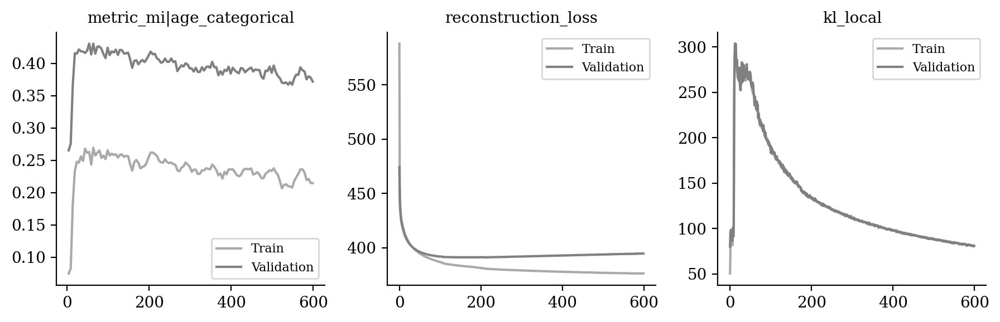

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_categorical").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

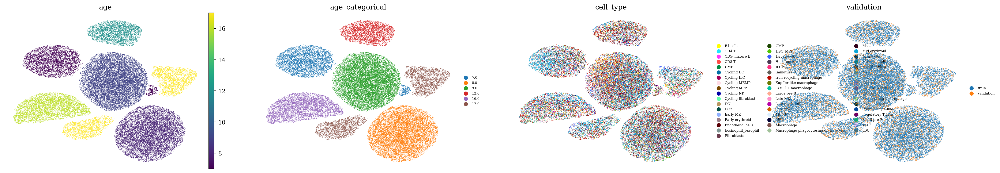

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

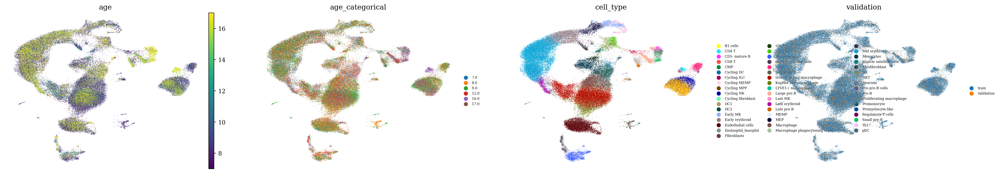

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

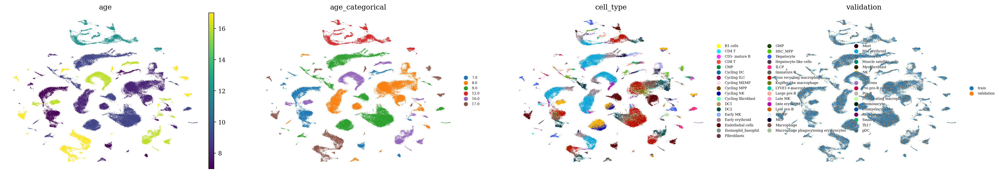

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )